In [ ]:
#SETUP

In [2]:
#Import Statements
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import CountModel 
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
# from py4etrics import tobit
import nfl_data_py as nfl
from IPython.display import display, HTML

In [10]:
#Seasons to work with
seasons = range(2015, 2024+1)
pbp_py = nfl.import_pbp_data(seasons)
# pbp_py.to_excel("NFLpbpdata_2015_2024.xlsx", index=False)

2015 done.
2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
2023 done.
2024 done.
Downcasting floats.


In [12]:
#Set up display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 1000)  # Set to a larger width as needed
pd.set_option('display.max_colwidth', None)  # Allows unlimited column width

In [14]:
#Bringing in DVOA METRICS

#Import DVOA Excel Sheet

file_path = '/Users/mattscomputer/Downloads/Premium-All-Years-DVOA-v8.0.xlsx' 
DVOA = pd.read_excel(file_path, sheet_name='v8.0')  # Replace 'Sheet1' with your sheet name


#Update Rams team code to match NFL-FAST-PY coding

DVOA['TEAM (NOW)'] = DVOA['TEAM (NOW)'].replace({'LAR':'LA'})

#Create various DVOA tables

dvoa_consolidated = DVOA[['YEAR','TEAM','TEAM (NOW)','TOTAL DVOA','TOTAL RANK','OFFENSE DVOA','OFFENSE RANK',
                          'DEFENSE DVOA','DEFENSE RANK','SPECIAL TEAMS DVOA','SPECIAL TEAMS RANK']]

dvoa_offense = DVOA[['YEAR','TEAM (NOW)','OFFENSE DVOA','OFFENSE RANK']]
dvoa_defense = DVOA[['YEAR','TEAM (NOW)','DEFENSE DVOA','DEFENSE RANK']]
dvoa_special_teams = DVOA[['YEAR','TEAM (NOW)','SPECIAL TEAMS DVOA','SPECIAL TEAMS RANK']]
dvoa_total = DVOA[['YEAR','TEAM (NOW)','TOTAL DVOA','TOTAL RANK']]


dvoa_offense.head(50)

,YEAR,TEAM (NOW),OFFENSE DVOA,OFFENSE RANK
0,2024,ARI,0.084023,11
1,2024,ATL,0.043657,14
2,2024,BAL,0.351711,1
3,2024,BUF,0.207124,2
4,2024,CAR,-0.115983,24
5,2024,CHI,-0.130856,27
6,2024,CIN,0.139957,5
7,2024,CLE,-0.317030,32
8,2024,DAL,-0.123066,25
9,2024,DEN,-0.005875,16


In [ ]:
#DEFENSIVE STOP ANALYSIS

In [124]:
#PBP MAIN: Timeout Modeling Main Table Cleaning / Transformation


#------------------------------------------------------------------------------------------------------------------------------------------#

#Cut down table to only needed columns
pbp_main = pbp_py [['game_id','posteam','defteam','away_team','home_team','qtr','game_seconds_remaining',
                    'time','score_differential','posteam_timeouts_remaining','defteam_timeouts_remaining',
                    'away_timeouts_remaining','home_timeouts_remaining','timeout','timeout_team','wp','def_wp',
                    'wpa','home_wp_post','away_wp_post','spread_line','drive','series','yrdln','yardline_100',
                    'down','ydstogo','play_type','yards_gained','rush_attempt','pass_attempt','own_kickoff_recovery','temp','wind',
                    'first_down','series_result']].copy()

#------------------------------------------------------------------------------------------------------------------------------------------#

#Fill all def_wp null values with 0 (because when the game is over, it is initally recorded as null instead of 0)
pbp_main['wp'] = pbp_main['wp'].fillna(0)
pbp_main['def_wp'] = pbp_main['def_wp'].fillna(0)
pbp_main['home_wp_post'] = pbp_main['home_wp_post'].fillna(0)
pbp_main['away_wp_post'] = pbp_main['away_wp_post'].fillna(0)

#------------------------------------------------------------------------------------------------------------------------------------------#

#Remove all plays where the first down doesn't begin with X minutes or less remaining

    #Create column for "seconds remaining in series" 
pbp_main['series_start_seconds_remaining'] = pbp_main.groupby(['game_id','series'])['game_seconds_remaining'].transform('first')
   
    #Apply filter
pbp_main = pbp_main.query('qtr == 4 & series_start_seconds_remaining <= 240')  #I removed the criteria & 'drive_start_time >= 60' for now

#------------------------------------------------------------------------------------------------------------------------------------------#

#Add columns for WP and defense's timeouts at the beginning and the end of the drive

    #Win Probability
pbp_main['drive_beginning_def_wp'] = pbp_main.groupby(['game_id','drive'])['def_wp'].transform('first')
pbp_main['drive_end_def_wp'] = pbp_main.groupby(['game_id','drive'])['def_wp'].transform('last') #***This does not include the last play of the drive (e.g. the punt, FG, etc.)

    #Timeouts
pbp_main['drive_beginning_def_to'] = pbp_main.groupby(['game_id','drive'])['defteam_timeouts_remaining'].transform('first')
pbp_main['drive_end_def_to'] = pbp_main.groupby(['game_id','drive'])['defteam_timeouts_remaining'].transform('last')

#------------------------------------------------------------------------------------------------------------------------------------------#

# Create a column to classify the each game and drive as having or not having a late game defenisve stop

    #Drive
pbp_main['drive_late_def_stop'] = ((pbp_main.groupby(['game_id','drive'])['qtr'].transform('first') == 4) &
                                   (pbp_main.groupby(['game_id','drive'])['game_seconds_remaining'].transform('first') <= 240) &
                                    (pbp_main.groupby(['game_id','drive'])['score_differential'].transform('first') <= 8) &
                                    (pbp_main.groupby(['game_id','drive'])['score_differential'].transform('first') > 0))

pbp_main['drive_late_def_stop'] = pbp_main['drive_late_def_stop'].astype(int)

        #Turn drives where there is an onside kick to 0 (no "late game defensive stop")
condition = pbp_main.groupby(['game_id', 'drive'])['own_kickoff_recovery'].transform('first') == 1
pbp_main.loc[condition, 'drive_late_def_stop'] = 0


    #Game
pbp_main['game_late_def_stop'] = pbp_main.groupby('game_id')['drive_late_def_stop'].transform('max')


#------------------------------------------------------------------------------------------------------------------------------------------#

#Code to denote drives where a team has already used all of their TOs -- DON'T USE FOR NOW

# #Remove series where a team has no choice because they already used their TOs
# #NOTE: Could later update this so that it only removes those where the team called *all* of their TOs on *DEFENSE*
#     #Create columns for number of TOs for the team at the beginning of the 'end of game' period (3:30 in the fourth quarter)
# pbp_main['away_TO_late_start'] = pbp_main.groupby('game_id')['away_timeouts_remaining'].transform('first')
# pbp_main['home_TO_late_start'] = pbp_main.groupby('game_id')['home_timeouts_remaining'].transform('first')

#     #Create columns for number of TOs used by the team since the beginning of the 'end of game' period (3:30 in the fourth quarter)
# pbp_main['away_TO_late_use'] = pbp_main['away_TO_late_start'] - pbp_main['away_timeouts_remaining']
# pbp_main['home_TO_late_use'] = pbp_main['home_TO_late_start'] - pbp_main['home_timeouts_remaining']

#     #Create a column indicating whether the away team already used enough of their timeouts in the late game period that these rows should be removed'
# pbp_main['away_not_enough_time'] = ((pbp_main['away_team'] == pbp_main['defteam']) &
#                     (pbp_trial['game_seconds_remaining'] <= 120) & 
#                     (pbp_trial['game_seconds_remaining'] + 45 * pbp_main['away_timeouts_remaining'] <= 135) & 
#                     (pbp_trial['game_seconds_remaining'] - 45 * pbp_main['away_TO_late_use'] <= 0))
# pbp_main['away_not_enough_time'] = pbp_main['away_not_enough_time'].astype(int)
# pbp_main['away_not_enough_time'] = pbp_main.groupby(['game_id','drive'])['away_not_enough_time'].transform('min')

#     #Create a column indicating whether the home team already used enough of their timeouts in the late game period that these rows should be removed'
# pbp_main['home_not_enough_time'] = ((pbp_main['home_team'] == pbp_main['defteam']) &
#                     (pbp_main['game_seconds_remaining'] <= 120) & 
#                     (pbp_main['game_seconds_remaining'] + 45 * pbp_main['home_timeouts_remaining'] <= 135) & 
#                     (pbp_main['game_seconds_remaining'] - 45 * pbp_main['home_TO_late_use'] <= 0))
# pbp_main['home_not_enough_time'] = pbp_main['home_not_enough_time'].astype(int)
# pbp_main['home_not_enough_time'] = pbp_main.groupby(['game_id','drive'])['home_not_enough_time'].transform('min')

#------------------------------------------------------------------------------------------------------------------------------------------#

#Create many columns to add to the main table for analysis



    #Create columns: (1) drive start, (2) drive end time, (3) drive starting yardline, (4) drive starting score differential

pbp_main['drive_start_time'] = pbp_main.groupby(['game_id','drive'])['game_seconds_remaining'].transform('first')
pbp_main['drive_end_time'] = pbp_main.groupby(['game_id','drive'])['game_seconds_remaining'].transform('last')
pbp_main['drive_start_yard_line'] = pbp_main.groupby(['game_id','drive'])['yardline_100'].transform('first')
pbp_main['drive_start_score_differential'] = pbp_main.groupby(['game_id','drive'])['score_differential'].transform('first')



    #Create column: drive-ending WP (**AFTER** the last play of the drive), accounting for home / away distinction

pbp_main['def_post_drive_wp'] = np.where(
    pbp_main['defteam'] == pbp_main['away_team'],
    pbp_main.groupby(['game_id', 'drive'])['away_wp_post'].transform('last'),
    np.where(
        pbp_main['defteam'] == pbp_main['home_team'],
        pbp_main.groupby(['game_id', 'drive'])['home_wp_post'].transform('last'),
        np.nan  # Leave the value as NaN if neither condition is met
    )
)



    #Create columns: dummy variables for the starting number of TOs for the defense at the beginning of each drive (3, 2, 1, 0)

pbp_main['three_TO'] = np.where(
    pbp_main['drive_beginning_def_to'] == 3, 1, 0)

pbp_main['two_TO'] = np.where(
    pbp_main['drive_beginning_def_to'] == 2, 1, 0)

pbp_main['one_TO'] = np.where(
    pbp_main['drive_beginning_def_to'] == 1, 1, 0)

pbp_main['zero_TO'] = np.where(
    pbp_main['drive_beginning_def_to'] == 0, 1, 0)



    #Create column: whether the defending team was home or away

pbp_main['defteam_home_status'] = np.where(
    pbp_main['home_team'] == pbp_main['defteam'], 1, np.where(
        pbp_main['defteam'] == pbp_main['away_team'], 0,
        np.nan  # Leave the value as NaN if neither condition is met
    ))



    #Create column: the number of first downs by drive (excluding touchdowns)

pbp_main['first_down_only_tracker'] = np.where(
    ((pbp_main['first_down'] == 1) & (pbp_main['series_result'] == "First down")),1,0)



    #Create column: number of plays by drive

        #Filtering condition for which play types to include in the play count
condition = (
    (pbp_main['play_type'] == "pass") | 
    (pbp_main['play_type'] == "run") | 
    (pbp_main['play_type'] == "qb_kneel") | 
    (pbp_main['play_type'] == "qb_spike")
)

        # Apply the mask and groupby to count
counts = pbp_main[condition].groupby(['game_id', 'drive']).size()

        # Map the counts back to the main DataFrame
pbp_main['num_of_plays'] = pbp_main.set_index(['game_id', 'drive']).index.map(counts).fillna(0)



    #Create column: binary indicator if the drive started before or after the two-minute warning

pbp_main['post_two_min_warning'] = np.where(
    (pbp_main['drive_start_time'] <= 120 ),1,0)



    #Create column: "Year" based on the first four characters of the game ID

pbp_main['year'] = pbp_main['game_id'].str[0:4]
pbp_main['year'] = pbp_main['year'].astype(int)

#------------------------------------------------------------------------------------------------------------------------------------------#

# #Merge in the DVOA numbers for the offense and defensive teams


#     #Offensive DVOA

# pbp_main = pbp_main.merge(
#     dvoa_offense, 
#     how='left', 
#     left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
#     right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
# )

# pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)


#     #Defensive DVOA

# pbp_main = pbp_main.merge(
#     dvoa_defense, 
#     how='left', 
#     left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
#     right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
# )

# pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)


#     #Create column: DVOA difference between the offense and defense

# pbp_main['dvoa_difference'] = pbp_main['OFFENSE DVOA'] + pbp_main['DEFENSE DVOA']


#

#------------------------------------------------------------------------------------------------------------------------------------------#

#DVOA ADDITION PART #2


    #Offensive DVOA

pbp_main = pbp_main.merge(
    dvoa_offense, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'OFFENSE DVOA': 'posteam_offensive_dvoa','OFFENSE RANK':'posteam_offensive_rank'}, inplace=True)


pbp_main = pbp_main.merge(
    dvoa_offense, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'OFFENSE DVOA': 'defteam_offensive_dvoa','OFFENSE RANK':'defteam_offensive_rank'}, inplace=True)




    #Defensive DVOA

pbp_main = pbp_main.merge(
    dvoa_defense, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'DEFENSE DVOA': 'defteam_defensive_dvoa','DEFENSE RANK':'defteam_defensive_rank'}, inplace=True)

pbp_main= pbp_main.merge(
    dvoa_defense, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'DEFENSE DVOA': 'posteam_defensive_dvoa','DEFENSE RANK':'posteam_defensive_rank'}, inplace=True)


    #Total DVOA

pbp_main = pbp_main.merge(
    dvoa_total, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'TOTAL DVOA': 'defteam_total_dvoa','TOTAL RANK':'defteam_total_rank'}, inplace=True)


pbp_main = pbp_main.merge(
    dvoa_total, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'TOTAL DVOA': 'posteam_total_dvoa','TOTAL RANK':'posteam_total_rank'}, inplace=True)


    #Special Teams DVOA

pbp_main = pbp_main.merge(
    dvoa_special_teams, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'SPECIAL TEAMS DVOA': 'defteam_special_teams_dvoa','SPECIAL TEAMS RANK':'defteam_special_teams_rank'}, inplace=True)


pbp_main = pbp_main.merge(
    dvoa_special_teams, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main.rename(columns={'SPECIAL TEAMS DVOA': 'posteam_special_teams_dvoa','SPECIAL TEAMS RANK':'posteam_special_teams_rank'}, inplace=True)

pbp_main['offensive_dvoa_difference'] = pbp_main['posteam_offensive_dvoa'] + pbp_main['defteam_defensive_dvoa']
pbp_main['defensive_dvoa_difference'] = pbp_main['posteam_defensive_dvoa'] + pbp_main['defteam_offensive_dvoa']
pbp_main['special_teams_dvoa_difference'] = pbp_main['posteam_special_teams_dvoa'] - pbp_main['defteam_special_teams_dvoa']
pbp_main['total_dvoa_difference'] = pbp_main['posteam_total_dvoa'] - pbp_main['defteam_total_dvoa']

#------------------------------------------------------------------------------------------------------------------------------------------#

#Show the table

# pbp_main.query('game_id == "2015_01_CAR_JAX"').tail(50)


In [126]:
#Creating a table of *ONLY* the drives with stop opportunities and relevant information

#------------------------------------------------------------------------------------------------------------------------------------------#

#Filter down to all the plays that are part of a late game defensive stop opportunity / drive

all_stop_opps = pbp_main.query('drive_late_def_stop == 1').reset_index()
all_stop_opps.query('game_id == "2024_05_TB_ATL"').head(50) #To test and see what it pulls

#------------------------------------------------------------------------------------------------------------------------------------------#

#Create a summary table of each 'late game defensive stop opportunity' drive that include the beginning and end wp, drive start and end time, etc.

all_stop_drives = all_stop_opps.groupby(['game_id', 'drive']).agg(
    posteam=('posteam', 'first'),
    defteam=('defteam', 'first'),
    qtr=('qtr', 'first'),
    drive_beginning_def_to=('drive_beginning_def_to', 'first'),
    drive_beginning_def_wp=('drive_beginning_def_wp', 'first'),
    drive_end_def_wp=('drive_end_def_wp', 'first'),
    def_post_drive_wp=('def_post_drive_wp', 'first'),
    drive_start_time=('drive_start_time', 'first'),
    drive_end_time=('game_seconds_remaining', 'last'),
    drive_start_yard_line=('drive_start_yard_line', 'first'),
    drive_start_score_differential=('drive_start_score_differential', 'first'),
    spread_line=('spread_line', 'first'),
    three_TO=('three_TO', 'first'),
    two_TO=('two_TO', 'first'),
    one_TO=('one_TO', 'first'),
    zero_TO=('zero_TO', 'first'),
    temp = ('temp','first'),
    wind = ('wind','first'),
    defteam_home_status = ('defteam_home_status','first'),
    num_of_plays = ('num_of_plays','first'),
    first_downs = ('first_down_only_tracker','sum'),
    post_two_min_warning = ('post_two_min_warning','first'),
    offensive_dvoa_difference = ('offensive_dvoa_difference','first'),
    defensive_dvoa_difference = ('defensive_dvoa_difference','first'),
    special_teams_dvoa_difference = ('special_teams_dvoa_difference','first'),
    total_dvoa_difference = ('total_dvoa_difference','first'),
    runs = ('rush_attempt','sum')
    
).reset_index()

#------------------------------------------------------------------------------------------------------------------------------------------#

#Create a couple of additional columns


    #Create column: Timeouts remaining as a categorical variable

all_stop_drives['starting_def_timeouts_cat'] = all_stop_drives['drive_beginning_def_to'].astype(str)

    #Create column: Proprortion of plays on the drive that were runs

all_stop_drives['rushing_pct'] = all_stop_drives['runs'] / all_stop_drives['num_of_plays']

    #Create column: Binary indicator of if there's "not enough time" left

all_stop_drives['not_enough_time_left'] = np.where(
                                ((all_stop_drives['drive_start_time'] <= 120) & 
                                 (all_stop_drives['drive_start_time'] <= 45*3 - 40* all_stop_drives['drive_beginning_def_to'])),
                                 1,0)

all_stop_drives['not_enough_time_left_2'] = np.where(
                                (all_stop_drives['drive_start_time'] <= 45),1,0)


    #Create column: Binary variable to indicate whether the row is "censored" for the purposes of the Tobit regression --> all WP = 0 are 'left-censored' and so get the value -1; all else aren't censored and so have the value 0

all_stop_drives['censored_postdrive_wp'] = np.where(all_stop_drives['def_post_drive_wp'] <= 0,-1,0)
all_stop_drives['censored_lastplaydrive_wp'] = np.where(all_stop_drives['drive_end_def_wp'] <= 0,-1,0)

#------------------------------------------------------------------------------------------------------------------------------------------#

#Small adjustments to the dataset to remove / fix null values


    #Remove this row from the dataset because the start time of the drive was null and causing issues with my regression

all_stop_drives = all_stop_drives[all_stop_drives['game_id'] != '2018_06_BUF_HOU'].copy()


    #Fill all rushing_pct rows that are null with 0 to avoid problems with regression

all_stop_drives['rushing_pct'] = all_stop_drives['rushing_pct'].fillna(0)

#------------------------------------------------------------------------------------------------------------------------------------------#

#Remove drives with <30 seconds because the WP is essentially zero regardless of how many TOs you get back & this overweights the 0 TO bucket

#all_stop_drives = all_stop_drives[all_stop_drives['drive_start_time'] >= 30].copy()


#------------------------------------------------------------------------------------------------------------------------------------------#

#View the dataset

# all_stop_drives.sort_values(by = ['drive_start_time','drive_beginning_def_to'],ascending = [True,True]).head(1000).reset_index()





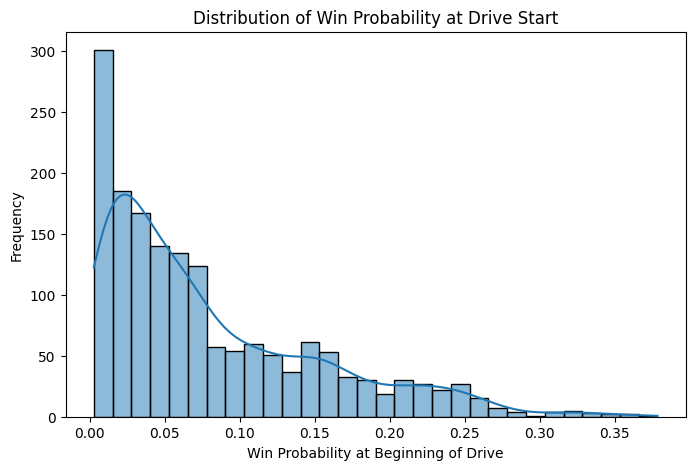

KeyError: "['dvoa_difference'] not in index"

In [128]:
#Exploring the distribution of WP

#Distribution of WP at Drive Start

plt.figure(figsize=(8, 5))
sns.histplot(all_stop_drives["drive_beginning_def_wp"], bins=30, kde=True)
plt.xlabel("Win Probability at Beginning of Drive")
plt.ylabel("Frequency")
plt.title("Distribution of Win Probability at Drive Start")
plt.show()

#Correlation Heatmap

selected_vars = [
    "drive_beginning_def_wp", "drive_beginning_def_to", "drive_start_time",
    "drive_start_score_differential", "spread_line", "dvoa_difference", "defteam_home_status"
]

# Compute correlation matrix for only these variables
corr_matrix =all_stop_drives[selected_vars].corr()

# Create heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Heatmap of Selected Features")
plt.show()



In [130]:
#VIF Test


# Select the relevant features for VIF calculation
features = ["drive_beginning_def_to", "drive_start_time",
            "drive_start_score_differential", "spread_line", 
            "dvoa_difference", "defteam_home_status"]

# Ensure there are no missing values
all_stop_drives_vif = all_stop_drives[features].dropna()

# Add a constant for the intercept
all_stop_drives_vif = add_constant(all_stop_drives_vif)

# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = all_stop_drives_vif.columns
vif_data["VIF"] = [variance_inflation_factor(all_stop_drives_vif.values, i) for i in range(all_stop_drives_vif.shape[1])]

# Display the VIF results
print(vif_data)

KeyError: "['dvoa_difference'] not in index"

In [17]:
#OLS Regression

import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

df = all_stop_drives

# Define independent (X) and dependent (y) variables
X = df[["two_TO","one_TO","zero_TO", "drive_start_time", "drive_start_score_differential",
        "spread_line", "dvoa_difference", "defteam_home_status"]]
y = df["drive_beginning_def_wp"]

# Add a constant (intercept)
X = sm.add_constant(X)

# Split into train (80%) and test (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the linear regression model
model = sm.OLS(y_train, X_train).fit()

# Print summary
print(model.summary())

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate model performance
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print(f"\nModel Performance:\nR² Score: {r2:.4f}\nRMSE: {rmse:.6f}")


                              OLS Regression Results                              
Dep. Variable:     drive_beginning_def_wp   R-squared:                       0.760
Model:                                OLS   Adj. R-squared:                  0.759
Method:                     Least Squares   F-statistic:                     520.4
Date:                    Sun, 30 Mar 2025   Prob (F-statistic):               0.00
Time:                            09:29:58   Log-Likelihood:                 2519.4
No. Observations:                    1324   AIC:                            -5021.
Df Residuals:                        1315   BIC:                            -4974.
Df Model:                               8                                         
Covariance Type:                nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [19]:
#Beta Regression

import statsmodels.api as sm
from sklearn.model_selection import train_test_split
import pandas as pd

epsilon = 1e-6  # Small shift to avoid 0 or 1 values
df["beta_wp"] = df["drive_beginning_def_wp"].clip(epsilon, 1 - epsilon)

# Define independent (X) and dependent (y) variables
X = df[["two_TO", "one_TO", "zero_TO", "drive_start_time", "drive_start_score_differential",
        "spread_line", "dvoa_difference", "defteam_home_status"]]

y = df["beta_wp"]  # Transformed WP

# Add constant
X = sm.add_constant(X)

# Split into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit Beta Regression model using GLM
beta_glm = sm.GLM(y_train, X_train, family=sm.families.Binomial(link=sm.families.links.logit()))
beta_results = beta_glm.fit()

# Print summary
print(beta_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                beta_wp   No. Observations:                 1324
Model:                            GLM   Df Residuals:                     1315
Model Family:                Binomial   Df Model:                            8
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -242.72
Date:                Sun, 30 Mar 2025   Deviance:                       13.089
Time:                        09:30:01   Pearson chi2:                     13.4
No. Iterations:                     6   Pseudo R-squ. (CS):            0.05647
Covariance Type:            nonrobust                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

/opt/anaconda3/lib/python3.12/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning: The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.
  warnings.warn(


In [237]:
#Logit Regression

df = all_stop_drives

epsilon = 1e-6  # Small constant to avoid log(0) or log(1)
df["logit_wp"] = np.log((df["drive_beginning_def_wp"] + epsilon) / (1 - df["drive_beginning_def_wp"] + epsilon))

import statsmodels.api as sm
from sklearn.model_selection import train_test_split

# Define independent (X) and transformed dependent (y) variables
X = df[[
    "two_TO", 
    "one_TO", 
    "zero_TO", 
    "drive_start_time", 
    "drive_start_score_differential",
    "spread_line", 
    "dvoa_difference", 
    "defteam_home_status",
    'not_enough_time_left_2'

]]


y = df["logit_wp"]  # Use the transformed win probability

# Add constant
X = sm.add_constant(X)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the logit-transformed linear regression model
logit_model = sm.OLS(y_train, X_train).fit()

# Print results
print(logit_model.summary())

# Predict on test set
y_pred_logit = logit_model.predict(X_test)

# Convert predictions back to probability space for interpretation
y_pred_wp = np.exp(y_pred_logit) / (1 + np.exp(y_pred_logit))

# Evaluate performance
from sklearn.metrics import mean_squared_error, r2_score
r2_logit = r2_score(y_test, y_pred_logit)
rmse_logit = np.sqrt(mean_squared_error(y_test, y_pred_logit))

print(f"\nLogit-Transformed Model Performance:\nR² Score: {r2_logit:.4f}\nRMSE: {rmse_logit:.6f}")




                            OLS Regression Results                            
Dep. Variable:               logit_wp   R-squared:                       0.885
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                     1118.
Date:                Sun, 30 Mar 2025   Prob (F-statistic):               0.00
Time:                        14:42:46   Log-Likelihood:                -628.84
No. Observations:                1324   AIC:                             1278.
Df Residuals:                    1314   BIC:                             1330.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

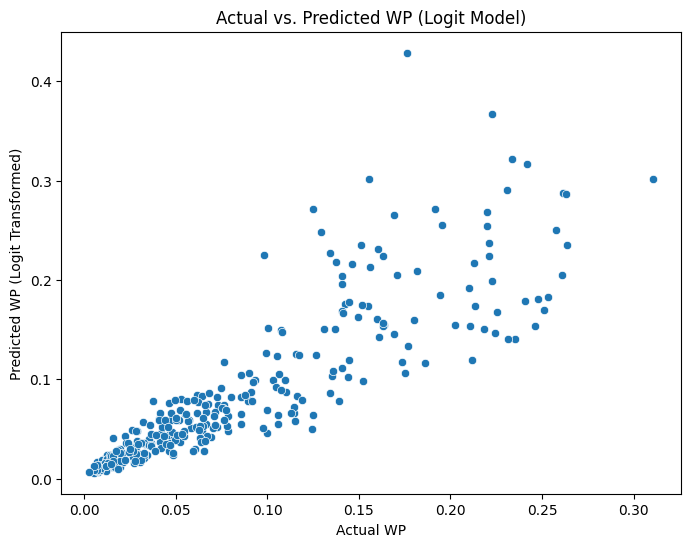

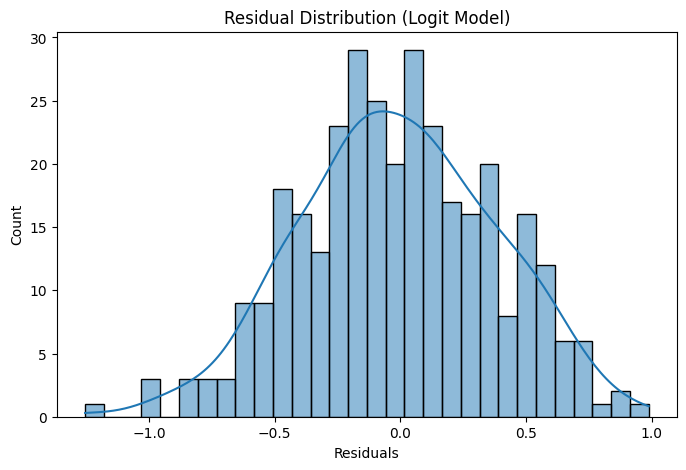

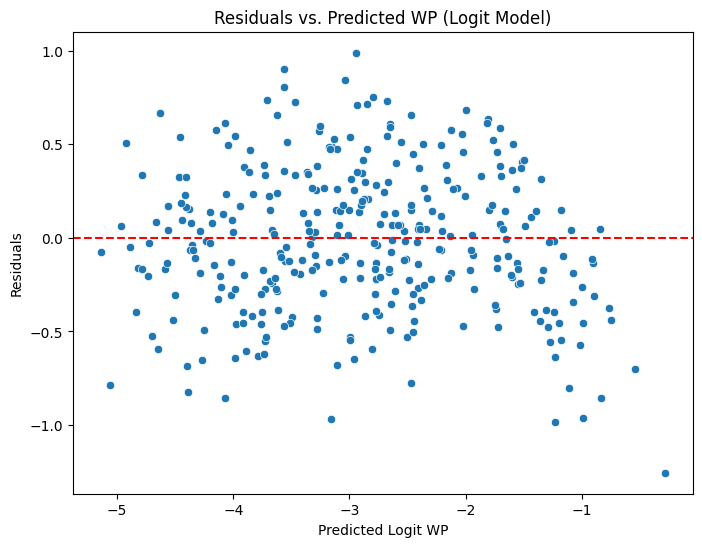

In [23]:
#Logit Regression Assessment

import matplotlib.pyplot as plt
import seaborn as sns

#Step #1: Comparing Actual v. Predicted WP in test sample -- check if this is a relatively straight line

plt.figure(figsize=(8,6))
sns.scatterplot(x=np.exp(y_test) / (1 + np.exp(y_test)), y=y_pred_wp)
plt.xlabel("Actual WP")
plt.ylabel("Predicted WP (Logit Transformed)")
plt.title("Actual vs. Predicted WP (Logit Model)")
plt.show()

#Step #2: Graphing the distribution of residuals for the test sample -- check if this is normally distributed

residuals_logit = y_test - y_pred_logit

plt.figure(figsize=(8,5))
sns.histplot(residuals_logit, kde=True, bins=30)
plt.xlabel("Residuals")
plt.title("Residual Distribution (Logit Model)")
plt.show()

#Step #3: Graphing the distribution of residuals based on the predicted WP for the test sample -- check for homoscedacitity

plt.figure(figsize=(8,6))
sns.scatterplot(x=y_pred_logit, y=residuals_logit)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted Logit WP")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted WP (Logit Model)")
plt.show()


In [25]:
#Adding Predicted WP for each Game to Dataframe

from scipy.special import expit

df = all_stop_drives

X_full = df[["two_TO", "one_TO", "zero_TO", "drive_start_time", 
             "drive_start_score_differential", "spread_line", 
             "dvoa_difference", "defteam_home_status"]]

X_full = sm.add_constant(X_full)

logit_pred = logit_model.predict(X_full)
predicted_wp = expit(logit_pred)

#print(predicted_wp.index.equals(df.index))  # Should return True -- checks to see if the rows for predicted_wp line up with the rows in the full dataframe df = all_stop_drives

df["predicted_logit_log_wp"] = logit_pred
df["predicted_logit_wp"] = predicted_wp

df.head(10)

,game_id,drive,posteam,defteam,qtr,drive_beginning_def_to,drive_beginning_def_wp,drive_end_def_wp,def_post_drive_wp,drive_start_time,drive_end_time,drive_start_yard_line,drive_start_score_differential,spread_line,three_TO,two_TO,one_TO,zero_TO,temp,wind,defteam_home_status,num_of_plays,first_downs,two_min_warning,offense_dvoa,defense_dvoa,off_dvoa_rank,def_dvoa_rank,dvoa_difference,runs,starting_def_timeouts_cat,rushing_pct,not_enough_time_left,not_enough_time_left_2,censored_postdrive_wp,censored_lastplaydrive_wp,beta_wp,logit_wp,predicted_logit_log_wp,predicted_logit_wp
0,2015_01_BAL_DEN,22.0,DEN,BAL,4.0,1.0,0.012132,0.000000,0.000000,28.0,0.0,80.0,6.0,4.5,0,0,1,0,88.0,13.0,0.0,1.0,0,0,-0.054033,0.086349,23.0,22.0,0.032316,1.0,1.0,1.000000,1,1,-1,-1,0.012132,-4.399647,-4.274102,0.013733
1,2015_01_DET_SD,21.0,LAC,DET,4.0,3.0,0.089498,0.022211,0.019486,209.0,153.0,22.0,5.0,3.5,1,0,0,0,84.0,10.0,0.0,4.0,1,1,-0.013776,-0.026890,19.0,13.0,-0.040667,2.0,3.0,0.500000,0,0,0,0,0.089498,-2.319764,-2.138334,0.105426
2,2015_01_DET_SD,23.0,LAC,DET,4.0,0.0,0.033499,0.000000,0.000000,64.0,0.0,35.0,5.0,3.5,0,0,0,1,84.0,10.0,0.0,2.0,0,0,-0.013776,-0.026890,19.0,13.0,-0.040667,2.0,0.0,1.000000,1,0,-1,-1,0.033499,-3.362123,-3.684149,0.024503
3,2015_01_GB_CHI,15.0,GB,CHI,4.0,2.0,0.038129,0.002463,0.002100,221.0,115.0,48.0,8.0,-5.5,0,1,0,0,72.0,11.0,1.0,4.0,2,1,0.034276,0.123157,11.0,30.0,0.157433,4.0,2.0,1.000000,0,0,0,0,0.038129,-3.227878,-3.040324,0.045637
4,2015_01_GB_CHI,17.0,GB,CHI,4.0,1.0,0.007863,0.000000,0.000000,34.0,0.0,35.0,8.0,-5.5,0,0,1,0,72.0,11.0,1.0,1.0,0,0,0.034276,0.123157,11.0,30.0,0.157433,1.0,1.0,1.000000,1,1,-1,-1,0.007863,-4.837599,-4.790035,0.008244
5,2015_01_KC_HOU,29.0,KC,HOU,4.0,0.0,0.014715,0.000000,0.000000,83.0,0.0,35.0,7.0,-1.0,0,0,0,1,NaN,NaN,1.0,2.0,0,0,0.094769,-0.106702,6.0,8.0,-0.011934,2.0,0.0,1.000000,1,0,-1,-1,0.014715,-4.203996,-4.083337,0.016572
6,2015_01_MIA_WAS,19.0,MIA,WAS,4.0,2.0,0.046590,0.000000,0.000000,137.0,0.0,80.0,7.0,-4.0,0,1,0,0,69.0,10.0,1.0,6.0,2,1,-0.087641,0.039466,25.0,17.0,-0.048175,5.0,2.0,0.833333,0,0,-1,-1,0.046590,-3.018633,-3.449853,0.030773
7,2015_01_NO_ARI,19.0,ARI,NO,4.0,2.0,0.097516,0.137239,0.146833,232.0,140.0,41.0,5.0,2.0,0,1,0,0,NaN,NaN,0.0,3.0,0,1,0.187758,0.213227,1.0,32.0,0.400985,2.0,2.0,0.666667,0,0,0,0,0.097516,-2.225125,-1.975491,0.121800
8,2015_01_NO_ARI,21.0,ARI,NO,4.0,2.0,0.040749,0.013442,0.011879,109.0,93.0,57.0,5.0,2.0,0,1,0,0,NaN,NaN,0.0,2.0,0,0,0.187758,0.213227,1.0,32.0,0.400985,1.0,2.0,0.500000,0,0,0,0,0.040749,-3.158701,-3.064840,0.044581
9,2015_01_NYG_DAL,19.0,NYG,DAL,4.0,3.0,0.242561,0.051360,0.142742,198.0,97.0,67.0,3.0,7.0,1,0,0,0,NaN,NaN,1.0,9.0,3,1,0.008819,0.067857,14.0,20.0,0.076677,7.0,3.0,0.777778,0,0,0,0,0.242561,-1.138688,-1.342816,0.207047


In [27]:
#Average Marginal Values for TOs

from scipy.special import expit  # sigmoid function

# Make base feature matrix for all rows
# X_base = df[["drive_start_time", "drive_start_score_differential", 
#              "spread_line", "dvoa_difference", "defteam_home_status"]]

# X_base = sm.add_constant(X_base)

# ----------------------------
# Simulate 3 TOs (baseline)
x_combined = X_full.copy()
X_3to = X_full.copy()
X_3to["two_TO"] = 0
X_3to["one_TO"] = 0
X_3to["zero_TO"] = 0
wp_3to = expit(logit_model.predict(X_3to))

# Simulate 2 TOs
X_2to = X_full.copy()
X_2to["two_TO"] = 1
X_2to["one_TO"] = 0
X_2to["zero_TO"] = 0
wp_2to = expit(logit_model.predict(X_2to))

# Simulate 1 TO
X_1to = X_full.copy()
X_1to["two_TO"] = 0
X_1to["one_TO"] = 1
X_1to["zero_TO"] = 0
wp_1to = expit(logit_model.predict(X_1to))

# Simulate 0 TO
X_0to = X_full.copy()
X_0to["two_TO"] = 0
X_0to["one_TO"] = 0
X_0to["zero_TO"] = 1
wp_0to = expit(logit_model.predict(X_0to))

# ----------------------------

# x_combined['wp_3to'] = wp_3to
# x_combined['wp_2to'] = wp_2to
# x_combined['wp_1to'] = wp_1to
# x_combined['wp_0to'] = wp_0to

# x_combined['gain_3_over_2'] = x_combined['wp_3to'] - x_combined['wp_2to']
# x_combined['gain_2_over_1'] = x_combined['wp_2to'] - x_combined['wp_1to']
# x_combined['gain_1_over_0'] = x_combined['wp_1to'] - x_combined['wp_0to']

#x_combined.sort_values(by = ['wp_3to','wp_2to','wp_1to','wp_0to'],ascending = [False,False,False,False]).head(1000)
# x_combined.sort_values(by = ['gain_3_over_2','gain_2_over_1','gain_1_over_0'],ascending = [False,False,False]).head(1000)

# # # Average effects across the dataset
# avg_gain_3_over_2 = x_combined['gain_3_over_2'].mean()
# avg_gain_2_over_1 = x_combined['gain_2_over_1'].mean()
# avg_gain_1_over_0 = x_combined['gain_1_over_0'].mean()


# print("Average WP Gain: 3 TOs over 2 TOs:", f"{avg_gain_3_over_2:.4%}")
# print("Average WP Gain: 2 TOs over 1 TO:", f"{avg_gain_2_over_1:.4%}")
# print("Average WP Gain: 1 TO over 0 TOs:", f"{avg_gain_1_over_0:.4%}")


# Calculate marginal WP gains
gain_3_over_2 = wp_3to - wp_2to
gain_2_over_1 = wp_2to - wp_1to
gain_1_over_0 = wp_1to - wp_0to

# Average effects across the dataset
avg_gain_3_over_2 = gain_3_over_2.mean()
avg_gain_2_over_1 = gain_2_over_1.mean()
avg_gain_1_over_0 = gain_1_over_0.mean()

print("Average WP Gain: 3 TOs over 2 TOs:", f"{avg_gain_3_over_2:.4%}")
print("Average WP Gain: 2 TOs over 1 TO:", f"{avg_gain_2_over_1:.4%}")
print("Average WP Gain: 1 TO over 0 TOs:", f"{avg_gain_1_over_0:.4%}")


Average WP Gain: 3 TOs over 2 TOs: 0.6506%
Average WP Gain: 2 TOs over 1 TO: 0.6045%
Average WP Gain: 1 TO over 0 TOs: 0.4495%


        marginal_gain_3_over_2  marginal_gain_2_over_1  marginal_gain_1_over_0  count
wp_bin                                                                               
0–5%                  0.002633                0.002401                0.001758    766
5–10%                 0.006067                0.005574                0.004105    385
10–15%                0.009780                0.009083                0.006749    208
15–20%                0.013243                0.012415                0.009300    141
20–25%                0.015404                0.014531                0.010943    104
25–30%                0.016050                0.015160                0.011428     35
30–35%                0.021027                0.020287                0.015574     14
35–40%                0.020399                0.019584                0.014970      3


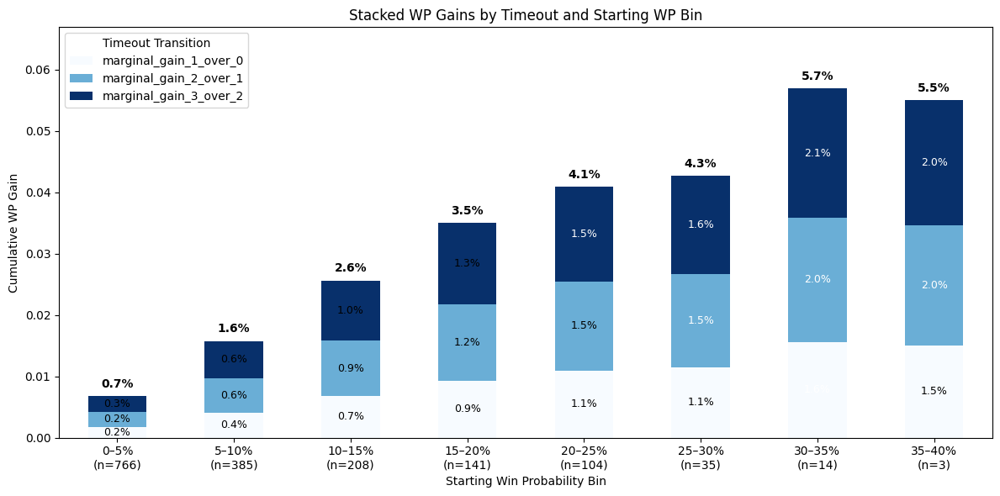

In [29]:
#Separate the WP gain by bins

bins = [0, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30,0.35,0.40]
labels = ["0–5%", "5–10%", "10–15%", "15–20%", "20–25%", "25–30%","30–35%","35–40%"]

df["wp_bin"] = pd.cut(df["drive_beginning_def_wp"], bins=bins, labels=labels)

df['marginal_gain_3_over_2'] = gain_3_over_2
df['marginal_gain_2_over_1'] = gain_2_over_1
df['marginal_gain_1_over_0'] = gain_1_over_0

grouped = df.groupby("wp_bin")[["marginal_gain_3_over_2", "marginal_gain_2_over_1", "marginal_gain_1_over_0"]].mean()

# Count the number of rows in each bin
bin_counts = df.groupby("wp_bin").size().rename("count")

# Merge with grouped means
grouped = grouped.merge(bin_counts, left_index=True, right_index=True)

print(grouped)


# 1. Reorder columns for correct stacking
stacked = grouped[["marginal_gain_1_over_0", "marginal_gain_2_over_1", "marginal_gain_3_over_2"]]

# 2. Create custom tick labels: bin label + count on new line
xtick_labels = [f"{bin_label}\n(n={int(count)})" 
                for bin_label, count in zip(grouped.index, grouped["count"])]

# 3. Plot the stacked bar chart
ax = stacked.plot(kind="bar", stacked=True, figsize=(12,6), colormap="Blues")

# Set x-tick labels
ax.set_xticklabels(xtick_labels, rotation=0)

# Axis labels and title
ax.set_ylabel("Cumulative WP Gain")
ax.set_xlabel("Starting Win Probability Bin")
ax.set_title("Stacked WP Gains by Timeout and Starting WP Bin")
ax.legend(title="Timeout Transition", loc="upper left")

# Needed to avoid label cutoff
plt.tight_layout()

# Loop through bars in the stack
for i, bin_label in enumerate(stacked.index):
    bottom = 0  # Keep track of where each stack starts
    
    # Go through each timeout transition in the stack
    for col in stacked.columns:
        value = stacked.loc[bin_label, col]
        if pd.notnull(value) and value > 0:
            # Position: x = bar index, y = middle of current segment
            ax.text(
                x=i,
                y=bottom + value / 2,
                s=f"{value*100:.1f}%",
                ha="center",
                va="center",
                fontsize=9,
                color="white" if value > 0.015 else "black"
            )
            bottom += value

# Add total value labels on top of each bar
for i, bin_label in enumerate(stacked.index):
    total = stacked.loc[bin_label].sum()
    ax.text(
        x=i,
        y=total + 0.001,  # slightly above the top
        s=f"{total*100:.1f}%",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold",
        color="black"
    )

plt.ylim(0, stacked.sum(axis=1).max() + 0.01)  # give room for top labels
plt.show()


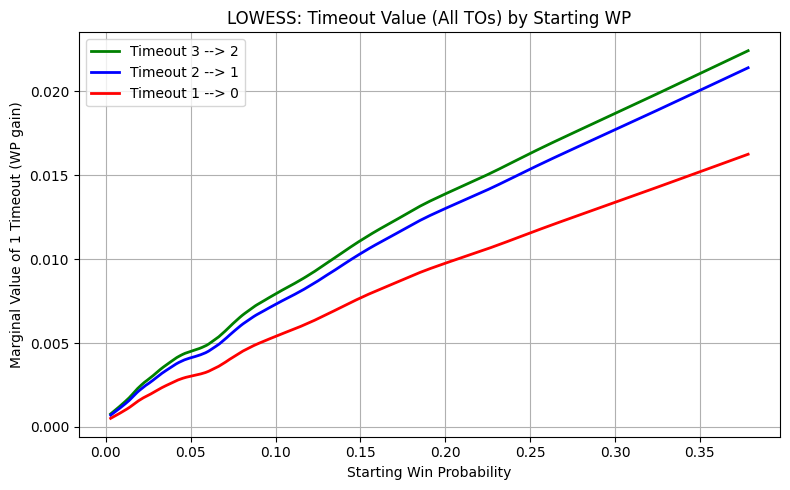

WP = 0.27
  Marginal value of TO #3: 0.01727
  Marginal value of TO #2: 0.01632
  Marginal value of TO #1: 0.01230


In [31]:
#LOWESS CURVES

from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

#Timeout #3 -> #2 LOWESS CURVE

sorted_idx = np.argsort(df['drive_beginning_def_wp'])
x_sorted = df['drive_beginning_def_wp'].iloc[sorted_idx]
y_sorted_3_to_2 = df['marginal_gain_3_over_2'].iloc[sorted_idx]

# Apply LOWESS smoothing
lowess_smoothed_3_to_2 = lowess(y_sorted_3_to_2, x_sorted, frac=0.25, return_sorted=True)  # Adjust frac as needed

# Extract for plotting
smoothed_x_3_to_2 = lowess_smoothed_3_to_2[:, 0]
smoothed_y_3_to_2 = lowess_smoothed_3_to_2[:, 1]

#Timeout #2 -> #1 LOWESS CURVE

sorted_idx = np.argsort(df['drive_beginning_def_wp'])
x_sorted = df['drive_beginning_def_wp'].iloc[sorted_idx]
y_sorted_2_to_1 = df['marginal_gain_2_over_1'].iloc[sorted_idx]

# Apply LOWESS smoothing
lowess_smoothed_2_to_1 = lowess(y_sorted_2_to_1, x_sorted, frac=0.25, return_sorted=True)  # Adjust frac as needed

# Extract for plotting
smoothed_x_2_to_1 = lowess_smoothed_2_to_1[:, 0]
smoothed_y_2_to_1 = lowess_smoothed_2_to_1[:, 1]

#Timeout #1 -> #0 LOWESS CURVE

sorted_idx = np.argsort(df['drive_beginning_def_wp'])
x_sorted = df['drive_beginning_def_wp'].iloc[sorted_idx]
y_sorted_1_to_0 = df['marginal_gain_1_over_0'].iloc[sorted_idx]

# Apply LOWESS smoothing
lowess_smoothed_1_to_0 = lowess(y_sorted_1_to_0, x_sorted, frac=0.25, return_sorted=True)  # Adjust frac as needed

# Extract for plotting
smoothed_x_1_to_0 = lowess_smoothed_1_to_0[:, 0]
smoothed_y_1_to_0 = lowess_smoothed_1_to_0[:, 1]

#Graph of All Three LOWESS Curves

plt.figure(figsize=(8, 5))
# sns.scatterplot(x=df['drive_beginning_def_wp'], y=df['marginal_gain_1_over_0'], alpha=0.3, label='Raw Data')
plt.plot(smoothed_x_3_to_2, smoothed_y_3_to_2, color='green', linewidth=2, label='Timeout 3 --> 2')
plt.plot(smoothed_x_2_to_1, smoothed_y_2_to_1, color='blue', linewidth=2, label='Timeout 2 --> 1')
plt.plot(smoothed_x_1_to_0, smoothed_y_1_to_0, color='red', linewidth=2, label='Timeout 1 --> 0')
plt.xlabel("Starting Win Probability")
plt.ylabel("Marginal Value of 1 Timeout (WP gain)")
plt.title("LOWESS: Timeout Value (All TOs) by Starting WP")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#Interpolate LOWESS Curves

from scipy.interpolate import interp1d

# Timeout 3 → 2
interp_to_3_over_2 = interp1d(
    smoothed_x_3_to_2,
    smoothed_y_3_to_2,
    bounds_error=False,
    fill_value="extrapolate"
)

# Timeout 2 → 1
interp_to_2_over_1 = interp1d(
    smoothed_x_2_to_1,
    smoothed_y_2_to_1,
    bounds_error=False,
    fill_value="extrapolate"
)

# Timeout 1 → 0
interp_to_1_over_0 = interp1d(
    smoothed_x_1_to_0,
    smoothed_y_1_to_0,
    bounds_error=False,
    fill_value="extrapolate"
)

#Example Interpolation
wp = 0.27  # example starting win probability

to_val_3_over_2 = interp_to_3_over_2(wp)
to_val_2_over_1 = interp_to_2_over_1(wp)
to_val_1_over_0 = interp_to_1_over_0(wp)

print(f"WP = {wp:.2f}")
print(f"  Marginal value of TO #3: {to_val_3_over_2:.5f}")
print(f"  Marginal value of TO #2: {to_val_2_over_1:.5f}")
print(f"  Marginal value of TO #1: {to_val_1_over_0:.5f}")

                    marginal_gain_3_over_2  marginal_gain_2_over_1  marginal_gain_1_over_0  count
time_remaining_bin                                                                               
0-20s                             0.002717                0.002482                0.001819    206
20-40s                            0.003258                0.002981                0.002188    135
40-60s                            0.003522                0.003226                0.002370    105
60-80s                            0.004025                0.003693                0.002716    144
80-100s                           0.004435                0.004068                0.002992     91
100-120s                          0.004929                0.004530                0.003337    161
120-140s                          0.005899                0.005444                0.004025    110
140-160s                          0.006671                0.006169                0.004568     89
160-180s            

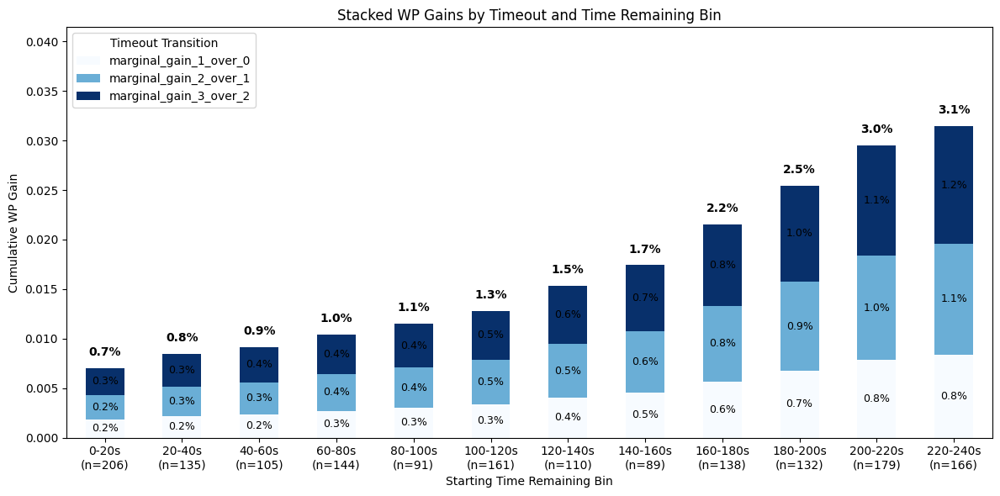

In [227]:
#Separate the WP gain by bins

bins = [0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240]
labels = ["0-20s", "20-40s", "40-60s", "60-80s", "80-100s", "100-120s","120-140s","140-160s","160-180s","180-200s","200-220s","220-240s"]

df["time_remaining_bin"] = pd.cut(df["drive_start_time"], bins=bins, labels=labels)

df['marginal_gain_3_over_2'] = gain_3_over_2
df['marginal_gain_2_over_1'] = gain_2_over_1
df['marginal_gain_1_over_0'] = gain_1_over_0

grouped = df.groupby("time_remaining_bin")[["marginal_gain_3_over_2", "marginal_gain_2_over_1", "marginal_gain_1_over_0"]].mean()

# Count the number of rows in each bin
bin_counts = df.groupby("time_remaining_bin").size().rename("count")

# Merge with grouped means
grouped = grouped.merge(bin_counts, left_index=True, right_index=True)

print(grouped)


# 1. Reorder columns for correct stacking
stacked = grouped[["marginal_gain_1_over_0", "marginal_gain_2_over_1", "marginal_gain_3_over_2"]]

# 2. Create custom tick labels: bin label + count on new line
xtick_labels = [f"{bin_label}\n(n={int(count)})" 
                for bin_label, count in zip(grouped.index, grouped["count"])]

# 3. Plot the stacked bar chart
ax = stacked.plot(kind="bar", stacked=True, figsize=(12,6), colormap="Blues")

# Set x-tick labels
ax.set_xticklabels(xtick_labels, rotation=0)

# Axis labels and title
ax.set_ylabel("Cumulative WP Gain")
ax.set_xlabel("Starting Time Remaining Bin")
ax.set_title("Stacked WP Gains by Timeout and Time Remaining Bin")
ax.legend(title="Timeout Transition", loc="upper left")

# Needed to avoid label cutoff
plt.tight_layout()

# Loop through bars in the stack
for i, bin_label in enumerate(stacked.index):
    bottom = 0  # Keep track of where each stack starts
    
    # Go through each timeout transition in the stack
    for col in stacked.columns:
        value = stacked.loc[bin_label, col]
        if pd.notnull(value) and value > 0:
            # Position: x = bar index, y = middle of current segment
            ax.text(
                x=i,
                y=bottom + value / 2,
                s=f"{value*100:.1f}%",
                ha="center",
                va="center",
                fontsize=9,
                color="white" if value > 0.015 else "black"
            )
            bottom += value

# Add total value labels on top of each bar
for i, bin_label in enumerate(stacked.index):
    total = stacked.loc[bin_label].sum()
    ax.text(
        x=i,
        y=total + 0.001,  # slightly above the top
        s=f"{total*100:.1f}%",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold",
        color="black"
    )

plt.ylim(0, stacked.sum(axis=1).max() + 0.01)  # give room for top labels
plt.show()


In [ ]:
#Revised TO analysis

In [132]:
all_stop_drives.sort_values(by = ['drive_start_time','drive_beginning_def_to'],ascending = [True,True]).head(1000).reset_index()

,index,game_id,drive,posteam,defteam,qtr,drive_beginning_def_to,drive_beginning_def_wp,drive_end_def_wp,def_post_drive_wp,drive_start_time,drive_end_time,drive_start_yard_line,drive_start_score_differential,spread_line,three_TO,two_TO,one_TO,zero_TO,temp,wind,defteam_home_status,num_of_plays,first_downs,post_two_min_warning,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,runs,starting_def_timeouts_cat,rushing_pct,not_enough_time_left,not_enough_time_left_2,censored_postdrive_wp,censored_lastplaydrive_wp
0,69,2015_08_SEA_DAL,20.0,SEA,DAL,4.0,0.0,0.061782,0.000000,0.000000,1.0,0.0,24.0,1.0,-4.5,0,0,0,1,NaN,NaN,1.0,1.0,0,1,0.247906,-0.252774,0.024507,0.525188,1.0,0.0,1.000000,1,1,-1,-1
1,140,2015_16_CHI_TB,24.0,CHI,TB,4.0,0.0,0.026160,0.000000,0.000000,1.0,0.0,35.0,5.0,3.0,0,0,0,1,83.0,13.0,1.0,0.0,0,1,0.115542,0.114379,0.034633,0.035796,0.0,0.0,0.000000,1,1,-1,-1
2,345,2017_01_LAC_DEN,23.0,DEN,LAC,4.0,0.0,0.045909,0.000000,0.000000,1.0,0.0,66.0,3.0,3.0,0,0,0,1,73.0,12.0,0.0,1.0,0,1,-0.213574,0.045569,0.000568,-0.258576,1.0,0.0,1.000000,1,1,-1,-1
3,481,2017_19_JAX_PIT,24.0,JAX,PIT,4.0,0.0,0.052475,0.000000,0.000000,1.0,0.0,35.0,3.0,7.0,0,0,0,1,18.0,2.0,1.0,0.0,0,1,-0.046815,0.001409,-0.055639,-0.103862,0.0,0.0,0.000000,1,1,-1,-1
4,514,2018_03_NYG_HOU,20.0,NYG,HOU,4.0,0.0,0.032967,0.000000,0.000000,1.0,0.0,35.0,5.0,6.5,0,0,0,1,NaN,NaN,1.0,1.0,0,1,-0.079798,0.054092,0.010080,-0.123810,1.0,0.0,1.000000,1,1,-1,-1
5,907,2020_12_CAR_MIN,20.0,MIN,CAR,4.0,0.0,0.114877,0.000000,0.000000,1.0,0.0,57.0,1.0,3.0,0,0,0,1,NaN,NaN,0.0,1.0,0,1,0.109148,0.080790,-0.101811,-0.073452,1.0,0.0,1.000000,1,1,-1,-1
6,12,2015_01_PIT_NE,19.0,NE,PIT,4.0,0.0,0.008273,0.000000,0.000000,2.0,2.0,35.0,7.0,7.5,0,0,0,1,65.0,7.0,0.0,0.0,0,1,0.107205,0.099662,0.037165,0.044708,0.0,0.0,0.000000,1,1,-1,-1
7,190,2016_02_MIA_NE,24.0,NE,MIA,4.0,0.0,0.008273,0.000000,0.000000,2.0,0.0,80.0,7.0,5.5,0,0,0,1,79.0,10.0,0.0,1.0,0,1,0.184584,-0.066807,0.014673,0.266064,1.0,0.0,1.000000,1,1,-1,-1
8,276,2016_11_JAX_DET,25.0,DET,JAX,4.0,0.0,0.006503,0.000000,0.000000,2.0,0.0,35.0,7.0,5.5,0,0,0,1,NaN,NaN,0.0,1.0,0,1,-0.024372,0.041766,0.057406,-0.008732,1.0,0.0,1.000000,1,1,-1,-1
9,417,2017_11_ATL_SEA,21.0,ATL,SEA,4.0,0.0,0.057746,0.000000,0.000000,2.0,0.0,58.0,3.0,1.0,0,0,0,1,45.0,6.0,1.0,1.0,0,1,0.076032,0.016615,0.008092,0.067509,1.0,0.0,1.000000,1,1,-1,-1


In [134]:
all_stop_drives_3_and_2_TOs = all_stop_drives.query('three_TO == 1 | two_TO == 1')
all_stop_drives_2_and_1_TOs = all_stop_drives.query('two_TO == 1 | one_TO == 1')
all_stop_drives_1_and_0_TOs = all_stop_drives.query('one_TO == 1 | zero_TO == 1')
all_stop_drives_3_and_1_TOs = all_stop_drives.query('three_TO == 1 | one_TO == 1')
all_stop_drives_3_and_0_TOs = all_stop_drives.query('three_TO == 1 | zero_TO == 1')
all_stop_drives_2_and_0_TOs = all_stop_drives.query('two_TO == 1 | zero_TO == 1')
all_stop_drives_2_and_1_TOs.head(10)

,game_id,drive,posteam,defteam,qtr,drive_beginning_def_to,drive_beginning_def_wp,drive_end_def_wp,def_post_drive_wp,drive_start_time,drive_end_time,drive_start_yard_line,drive_start_score_differential,spread_line,three_TO,two_TO,one_TO,zero_TO,temp,wind,defteam_home_status,num_of_plays,first_downs,post_two_min_warning,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,runs,starting_def_timeouts_cat,rushing_pct,not_enough_time_left,not_enough_time_left_2,censored_postdrive_wp,censored_lastplaydrive_wp
0,2015_01_BAL_DEN,22.0,DEN,BAL,4.0,1.0,0.012132,0.000000,0.000000,28.0,0.0,80.0,6.0,4.5,0,0,1,0,88.0,13.0,0.0,1.0,0,1,0.032316,-0.244794,-0.066243,0.210866,1.0,1.0,1.000000,1,1,-1,-1
3,2015_01_GB_CHI,15.0,GB,CHI,4.0,2.0,0.038129,0.002463,0.002100,221.0,115.0,48.0,8.0,-5.5,0,1,0,0,72.0,11.0,1.0,4.0,2,0,0.157433,-0.007959,0.016033,0.181425,4.0,2.0,1.000000,0,0,0,0
4,2015_01_GB_CHI,17.0,GB,CHI,4.0,1.0,0.007863,0.000000,0.000000,34.0,0.0,35.0,8.0,-5.5,0,0,1,0,72.0,11.0,1.0,1.0,0,1,0.157433,-0.007959,0.016033,0.181425,1.0,1.0,1.000000,1,1,-1,-1
6,2015_01_MIA_WAS,19.0,MIA,WAS,4.0,2.0,0.046590,0.000000,0.000000,137.0,0.0,80.0,7.0,-4.0,0,1,0,0,69.0,10.0,1.0,6.0,2,0,-0.048175,0.104296,-0.058447,-0.210918,5.0,2.0,0.833333,0,0,-1,-1
7,2015_01_NO_ARI,19.0,ARI,NO,4.0,2.0,0.097516,0.137239,0.146833,232.0,140.0,41.0,5.0,2.0,0,1,0,0,NaN,NaN,0.0,3.0,0,0,0.400985,-0.089510,-0.008184,0.482311,2.0,2.0,0.666667,0,0,0,0
8,2015_01_NO_ARI,21.0,ARI,NO,4.0,2.0,0.040749,0.013442,0.011879,109.0,93.0,57.0,5.0,2.0,0,1,0,0,NaN,NaN,0.0,2.0,0,1,0.400985,-0.089510,-0.008184,0.482311,1.0,2.0,0.500000,0,0,0,0
11,2015_01_PHI_ATL,26.0,ATL,PHI,4.0,1.0,0.042967,0.000000,0.000000,71.0,0.0,29.0,2.0,-3.5,0,0,1,0,NaN,NaN,0.0,3.0,0,1,0.017454,-0.032163,-0.039981,0.009636,3.0,1.0,1.000000,1,0,-1,-1
13,2015_02_ATL_NYG,21.0,ATL,NYG,4.0,2.0,0.026481,0.000000,0.000000,35.0,0.0,50.0,4.0,2.0,0,1,0,0,73.0,9.0,1.0,1.0,0,1,0.073724,0.080511,-0.074851,-0.081637,1.0,2.0,1.000000,1,1,-1,-1
14,2015_02_BAL_OAK,22.0,LV,BAL,4.0,1.0,0.029706,0.000000,0.000000,19.0,0.0,62.0,4.0,-6.0,0,0,1,0,80.0,8.0,0.0,1.0,0,1,0.074657,-0.040424,-0.074340,0.040741,1.0,1.0,1.000000,1,1,-1,-1
17,2015_02_NE_BUF,27.0,NE,BUF,4.0,1.0,0.147694,0.025785,0.040419,204.0,78.0,68.0,5.0,2.0,0,0,1,0,62.0,7.0,1.0,4.0,2,0,0.225357,0.003615,0.023766,0.245508,2.0,1.0,0.500000,0,0,0,0


2025-03-30 22:51:23,433	INFO util.py:154 -- Outdated packages:
  ipywidgets==7.8.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Average Treatment Effect (3 TOs vs. 2 TOs): 0.0287 WP
ATE 95% CI: (-0.0148, 0.0722)


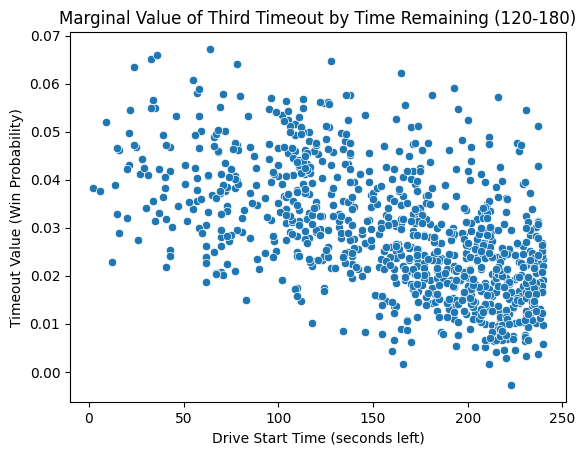

Propensity model AUC: 0.585
Coefficients from linear model:


NameError: name 'cate_3_to_2_model' is not defined

In [136]:
#Causal Forest MODEL (3TO)


df_cate_3_to_2 = all_stop_drives_3_and_2_TOs.copy()
# df_cate_3_to_2 = df_cate_3_to_2[df_cate_3_to_2["drive_start_time"] <= 60].copy()
# df_cate_3_to_2 = df_cate_3_to_2[(df_cate_3_to_2["drive_start_time"] > 60) & (df_cate_3_to_2["drive_start_time"] <= 120)].copy()

Y = df_cate_3_to_2["def_post_drive_wp"]

X = df_cate_3_to_2[[
    "drive_start_time",  #Time left at the start of the drive
    "drive_start_yard_line", #Yard line on the field at the start of the drive
    "drive_start_score_differential", #Score differential at the start of the drive
    "spread_line", #Vegas spread line at the beginning of the game
    "offensive_dvoa_difference", #DVOA difference between the offense and defense on the field
    "defensive_dvoa_difference", #DVOA difference between the offense and defense not on the field
    "special_teams_dvoa_difference", #DVOA difference between the two teams' special teams
    "defteam_home_status", #Whether the defensive team is home or away
    "post_two_min_warning" #Whether the drive started before or after the two minute warning (1 if after)
]]

T = df_cate_3_to_2["drive_beginning_def_to"].apply(lambda x: 1 if x == 3 else 0)

df_cate_3_to_2["treatment_3_vs_2_cf"] = T

from sklearn.ensemble import GradientBoostingRegressor
import numpy as np
from sklearn.linear_model import LogisticRegressionCV
from econml.dml import CausalForestDML
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LogisticRegressionCV


# Instantiate the model
cate_3_to_2_model_cf = CausalForestDML(
    model_y=GradientBoostingRegressor(),     # flexible model for outcome
    model_t=LogisticRegressionCV(),          # for treatment modeling
    discrete_treatment=True,
    n_estimators=100,                        # number of trees in the forest
    min_samples_leaf=10,                     # avoid overfitting small subgroups
    max_depth=10,
    random_state=42
)

# Fit the model
cate_3_to_2_model_cf.fit(Y=Y, T=T, X=X)

ate_3_to_2_cf = cate_3_to_2_model_cf.ate(X=X)
print(f"Average Treatment Effect (3 TOs vs. 2 TOs): {ate_3_to_2_cf:.4f} WP")
lb, ub = cate_3_to_2_model_cf.ate_interval(X=X)
print(f"ATE 95% CI: ({lb:.4f}, {ub:.4f})")

df_cate_3_to_2["timeout_value_3_to_2_cf"] = cate_3_to_2_model_cf.effect(X)

import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=df_cate_3_to_2, x="drive_start_time", y="timeout_value_3_to_2_cf")
plt.title("Marginal Value of Third Timeout by Time Remaining (120-180)")
plt.xlabel("Drive Start Time (seconds left)")
plt.ylabel("Timeout Value (Win Probability)")
plt.show()


# sns.histplot(data=df_cate_3_to_2, x="drive_start_time", hue="treatment_3_vs_2_cf", bins=30, kde=False, multiple="stack")
# plt.title("Distribution of Timeouts by Time Remaining")
# plt.show()

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

# Simple logistic regression for diagnostic
propensity_model = LogisticRegression(max_iter=2000).fit(X, T)
propensity_scores = propensity_model.predict_proba(X)[:, 1]
print(f"Propensity model AUC: {roc_auc_score(T, propensity_scores):.3f}")

print("Coefficients from linear model:")
print(cate_3_to_2_model.model_final_.coef_)

#LOWESS Curve -- 3 v. 2

from statsmodels.nonparametric.smoothers_lowess import lowess
import numpy as np

lowess_curve = lowess(
    df_cate_3_to_2["timeout_value_3_to_2_cf"],
    df_cate_3_to_2["drive_start_time"],
    frac=0.2
)

# Plot
sns.lineplot(x=lowess_curve[:, 0], y=lowess_curve[:, 1])
plt.title("Smoothed Timeout Value by Time Remaining (LOWESS)")
plt.xlabel("Time Remaining")
plt.ylabel("Timeout Value (WP)")





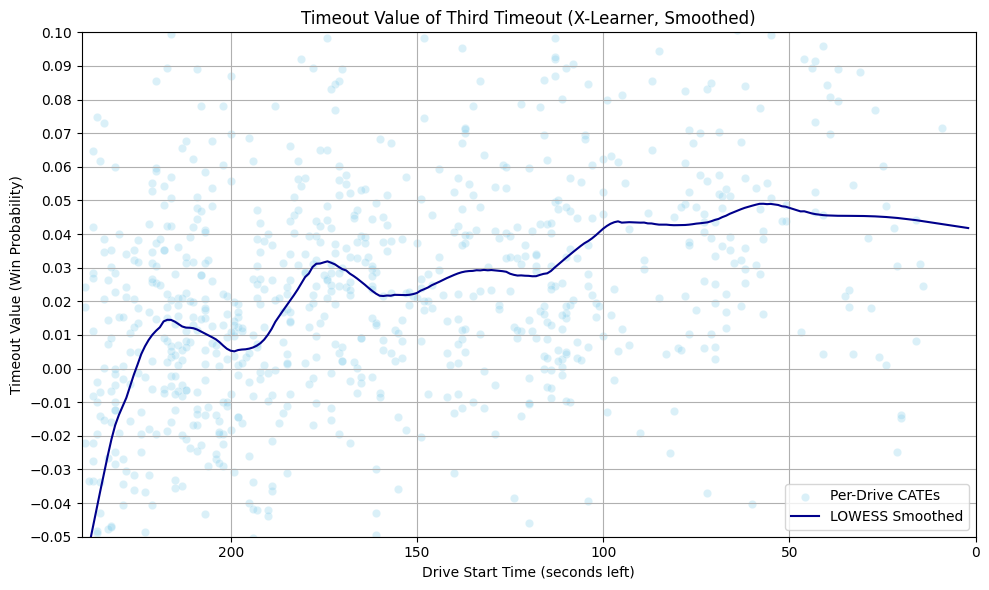

In [138]:
#XLEARNER MODEL & LOWESS CURVE (3TO)

from econml.metalearners import XLearner
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
import seaborn as sns
from matplotlib.ticker import MultipleLocator

#----------------------------------
# Step 1: Prep Data
#----------------------------------
df = df_cate_3_to_2.copy()

# Define treatment variable: 1 if 3 TOs, 0 if 2 TOs
T = df["drive_beginning_def_to"].apply(lambda x: 1 if x == 3 else 0)

# Define outcome: Win probability after the drive ends
Y = df["def_post_drive_wp"]

# Define covariates (features)
X = df[[
    "drive_start_time",  
    "drive_start_yard_line", 
    "drive_start_score_differential", 
    "spread_line", 
    "offensive_dvoa_difference", 
    "defensive_dvoa_difference", 
    "special_teams_dvoa_difference", 
    "defteam_home_status", 
    "post_two_min_warning"
]]

#----------------------------------
# Step 2: Train X-Learner
#----------------------------------

gb_model = GradientBoostingRegressor(random_state=42)
propensity_model = LogisticRegressionCV(max_iter=5000, random_state=42)

x_learner_model = XLearner(
    models=gb_model,
    propensity_model=propensity_model
)

x_learner_model.fit(Y=Y, T=T, X=X)

#----------------------------------
# Step 3: Predict CATEs
#----------------------------------
df["timeout_value_cate_xlearner"] = x_learner_model.effect(X)
df["timeout_value_cate_xlearner_clipped"] = df["timeout_value_cate_xlearner"].clip(lower=0)


#----------------------------------
# Step 4: LOWESS smoothing (optional)
#----------------------------------
lowess_cate = lowess(
    endog=df["timeout_value_cate_xlearner"],
    exog=df["drive_start_time"],
    frac=0.15  # Smaller = less smoothing
)

#----------------------------------
# Step 5: Plot results
#----------------------------------
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df, x="drive_start_time", y="timeout_value_cate_xlearner",
    alpha=0.3, label="Per-Drive CATEs", color='skyblue'
)
plt.plot(lowess_cate[:, 0], lowess_cate[:, 1], color='darkblue', label="LOWESS Smoothed")

# Set y-axis limits and tick spacing
plt.ylim(-0.05, 0.10)
plt.gca().yaxis.set_major_locator(MultipleLocator(0.01))

# Set x-axis (time) range if desired
plt.xlim(0, 240)
# plt.gca().xaxis.set_major_locator(MultipleLocator(10))
plt.gca().invert_xaxis()

plt.title("Timeout Value of Third Timeout (X-Learner, Smoothed)")
plt.xlabel("Drive Start Time (seconds left)")
plt.ylabel("Timeout Value (Win Probability)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

Window 240-180: n=410, treatments=2
Window 230-170: n=383, treatments=2
Window 220-160: n=380, treatments=2
Window 210-150: n=334, treatments=2
Window 200-140: n=285, treatments=2
Window 190-130: n=271, treatments=2
Window 180-120: n=254, treatments=2
Window 170-110: n=250, treatments=2
Window 160-100: n=238, treatments=2
Window 150-90: n=224, treatments=2
Window 140-80: n=215, treatments=2
Window 130-70: n=198, treatments=2
Window 120-60: n=194, treatments=2
Window 110-50: n=155, treatments=2
Window 100-40: n=122, treatments=2
Window 90-30: n=116, treatments=2
Window 80-20: n=111, treatments=2
Window 70-10: n=91, treatments=2
Window 60-0: n=65, treatments=2


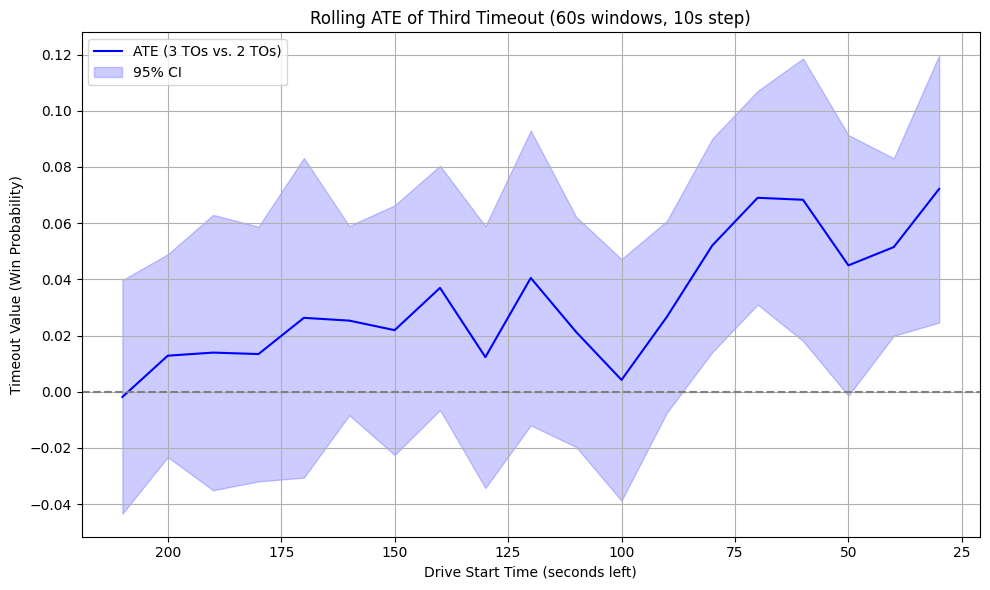

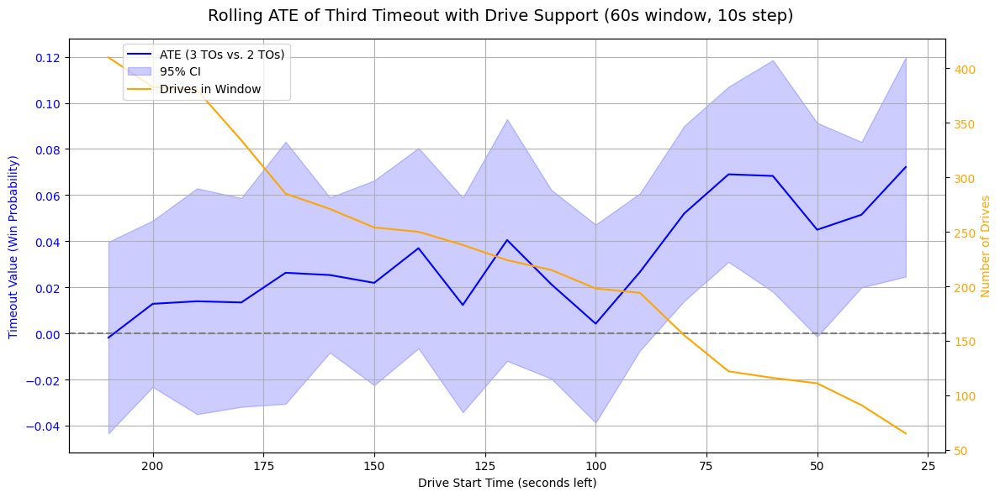

In [140]:
#ROLLING WINDOW MODEL

from econml.dml import CausalForestDML
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LogisticRegressionCV
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

df_cate_3_to_2 = all_stop_drives_3_and_2_TOs.copy()

window_size = 60
step_size = 10
start_times = np.arange(240, window_size - 1, -step_size)

ate_results = []

for start in start_times:
    end = start - window_size
    mask = (df_cate_3_to_2["drive_start_time"] <= start) & (df_cate_3_to_2["drive_start_time"] > end)
    df_window = df_cate_3_to_2[mask]

    print(f"Window {start}-{end}: n={len(df_window)}, treatments={df_window['drive_beginning_def_to'].nunique()}")

    if df_window["drive_beginning_def_to"].nunique() < 2 or len(df_window) < 50:
        continue
    ...

    # Define variables
    Y = df_window["def_post_drive_wp"]
    T = df_window["drive_beginning_def_to"].apply(lambda x: 1 if x == 3 else 0)

    X = df_window[[
        "drive_start_time",
        "drive_start_yard_line",
        "drive_start_score_differential",
        "spread_line",
        "offensive_dvoa_difference",
        "defensive_dvoa_difference",
        "special_teams_dvoa_difference",
        "defteam_home_status",
        "post_two_min_warning"
    ]]

    # Fit causal forest
    try:
        cf = CausalForestDML(
            model_y=GradientBoostingRegressor(),
            model_t = LogisticRegressionCV(max_iter=5000),
            discrete_treatment=True,
            n_estimators=100,
            min_samples_leaf=10,
            max_depth=10,
            random_state=42
        )
        cf.fit(Y=Y, T=T, X=X)

        ate = cf.ate(X=X)
        lb, ub = cf.ate_interval(X=X)

        ate_results.append({
            "window_center": start - window_size / 2,
            "ate": ate,
            "lb": lb,
            "ub": ub,
            "n_obs": len(df_window)
        })

    except Exception as e:
        print(f"Failed at window {start}-{end}: {e}")
        continue

# Convert to DataFrame
ate_df = pd.DataFrame(ate_results)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(ate_df["window_center"], ate_df["ate"], label="ATE (3 TOs vs. 2 TOs)", color='blue')
plt.fill_between(ate_df["window_center"], ate_df["lb"], ate_df["ub"], color='blue', alpha=0.2, label="95% CI")
plt.gca().invert_xaxis()
plt.axhline(0, color='gray', linestyle='--')
plt.xlabel("Drive Start Time (seconds left)")
plt.ylabel("Timeout Value (Win Probability)")
plt.title("Rolling ATE of Third Timeout (60s windows, 10s step)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

fig, ax1 = plt.subplots(figsize=(12, 6))

# ATE curve (left y-axis)
ax1.plot(ate_df["window_center"], ate_df["ate"], label="ATE (3 TOs vs. 2 TOs)", color="blue")
ax1.fill_between(ate_df["window_center"], ate_df["lb"], ate_df["ub"], color="blue", alpha=0.2, label="95% CI")
ax1.axhline(0, color='gray', linestyle='--')
ax1.set_xlabel("Drive Start Time (seconds left)")
ax1.set_ylabel("Timeout Value (Win Probability)", color="blue")
ax1.tick_params(axis='y', labelcolor="blue")
ax1.invert_xaxis()
ax1.grid(True)

# Sample size curve (right y-axis)
ax2 = ax1.twinx()
ax2.plot(ate_df["window_center"], ate_df["n_obs"], color="orange", label="Drives in Window")
ax2.set_ylabel("Number of Drives", color="orange")
ax2.tick_params(axis='y', labelcolor="orange")

# Title and Legend
fig.suptitle("Rolling ATE of Third Timeout with Drive Support (60s window, 10s step)", fontsize=14)
fig.tight_layout()
fig.legend(loc="upper left", bbox_to_anchor=(0.12, 0.92))
plt.show()



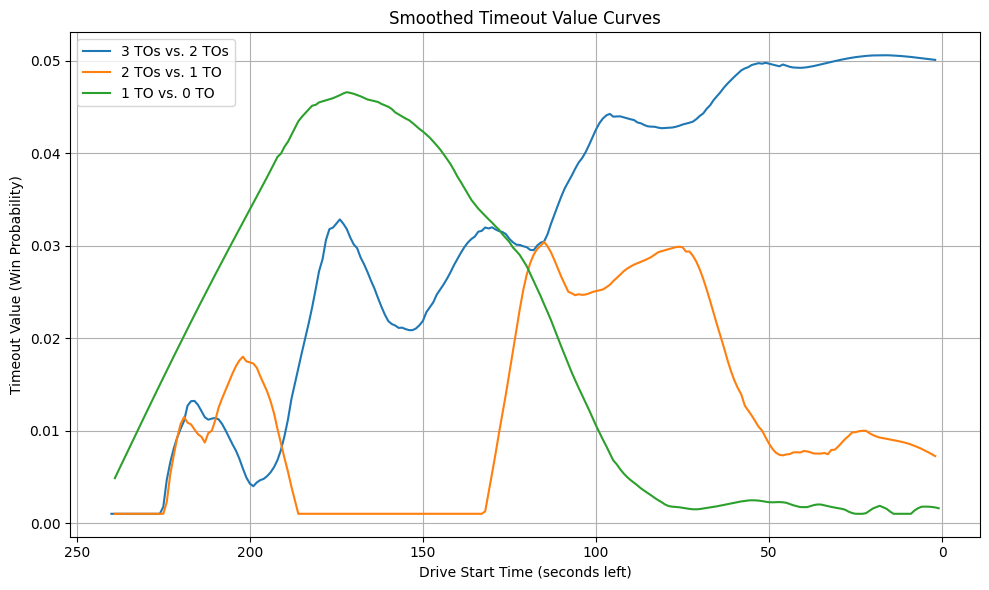

In [142]:
#CONSOLIDATED MODEL -- ALL THREE LOWESS CURVES

# ---------------------------------------------
# Step 1: Imports
# ---------------------------------------------
from econml.metalearners import XLearner
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LogisticRegressionCV
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy.interpolate import interp1d
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------------------------------------------
# Step 2: Modeling Function
# ---------------------------------------------
def run_timeout_cate_model(df, treatment_col_val, control_col_val, label):
    Y = df["def_post_drive_wp"]
    T = df["drive_beginning_def_to"].apply(lambda x: 1 if x == treatment_col_val else 0)

    X = df[[
        "drive_start_time",                 
        "drive_start_yard_line",           
        "drive_start_score_differential",  
        "spread_line",                     
        "offensive_dvoa_difference",       
        "defensive_dvoa_difference",
        "special_teams_dvoa_difference",
        "defteam_home_status",             
        "post_two_min_warning"             
    ]]

    # Train model
    model = XLearner(
        models=GradientBoostingRegressor(),
        propensity_model=LogisticRegressionCV(max_iter=5000)
    )
    model.fit(Y=Y, T=T, X=X)

    # Predict per-drive CATE
    df[f"timeout_value_cate_{label}"] = model.effect(X)

    # LOWESS smoothing
    lowess_result = lowess(
        endog=df[f"timeout_value_cate_{label}"],
        exog=df["drive_start_time"],
        frac=0.15,
        return_sorted=True
    )

    df_lowess = pd.DataFrame(lowess_result, columns=["drive_start_time", f"timeout_value_cate_smoothed_{label}"])

    # Clip to min of 0.001 to avoid negative timeout values
    df_lowess[f"timeout_value_cate_smoothed_{label}"] = df_lowess[f"timeout_value_cate_smoothed_{label}"].clip(lower=0.001)

    # Interpolation function
    f_interp = interp1d(
        df_lowess["drive_start_time"],
        df_lowess[f"timeout_value_cate_smoothed_{label}"],
        kind="linear",
        bounds_error=False,
        fill_value="extrapolate"
    )

    return model, df, df_lowess, f_interp

# Run the models

# 3 TOs vs. 2 TOs
model_3_to_2, df_3_to_2, df_lowess_3_to_2, f_3_to_2 = run_timeout_cate_model(
    df=all_stop_drives_3_and_2_TOs.copy(),
    treatment_col_val=3,
    control_col_val=2,
    label="3_to_2"
)

# 2 TOs vs. 1 TO
model_2_to_1, df_2_to_1, df_lowess_2_to_1, f_2_to_1 = run_timeout_cate_model(
    df=all_stop_drives_2_and_1_TOs.copy(),
    treatment_col_val=2,
    control_col_val=1,
    label="2_to_1"
)

# 1 TO vs. 0 TO
model_1_to_0, df_1_to_0, df_lowess_1_to_0, f_1_to_0 = run_timeout_cate_model(
    df=all_stop_drives_1_and_0_TOs.copy(),
    treatment_col_val=1,
    control_col_val=0,
    label="1_to_0"
)

#Preview the LOWESS Curves

plt.figure(figsize=(10, 6))
plt.plot(df_lowess_3_to_2["drive_start_time"], df_lowess_3_to_2["timeout_value_cate_smoothed_3_to_2"], label="3 TOs vs. 2 TOs")
plt.plot(df_lowess_2_to_1["drive_start_time"], df_lowess_2_to_1["timeout_value_cate_smoothed_2_to_1"], label="2 TOs vs. 1 TO")
plt.plot(df_lowess_1_to_0["drive_start_time"], df_lowess_1_to_0["timeout_value_cate_smoothed_1_to_0"], label="1 TO vs. 0 TO")
plt.gca().invert_xaxis()
plt.xlabel("Drive Start Time (seconds left)")
plt.ylabel("Timeout Value (Win Probability)")
plt.title("Smoothed Timeout Value Curves")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



In [577]:
df_late_stop_games.head(5)

,game_id,posteam,defteam,away_team,home_team,qtr,game_seconds_remaining,time,score_differential,posteam_timeouts_remaining,defteam_timeouts_remaining,away_timeouts_remaining,home_timeouts_remaining,timeout,timeout_team,wp,def_wp,wpa,home_wp_post,away_wp_post,spread_line,drive,series,yrdln,yardline_100,down,ydstogo,play_type,yards_gained,rush_attempt,pass_attempt,own_kickoff_recovery,temp,wind,first_down,series_result,fg_prob,td_prob,total_home_epa,total_away_epa,series_start_seconds_remaining,drive_late_def_stop,game_late_def_stop,team_with_late_def_stop,late_def_teams_in_game,team_will_later_have_a_def_stop,year,posteam_offensive_dvoa,posteam_offensive_rank,defteam_offensive_dvoa,defteam_offensive_rank,defteam_defensive_dvoa,defteam_defensive_rank,posteam_defensive_dvoa,posteam_defensive_rank,defteam_total_dvoa,defteam_total_rank,posteam_total_dvoa,posteam_total_rank,defteam_special_teams_dvoa,defteam_special_teams_rank,posteam_special_teams_dvoa,posteam_special_teams_rank,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,defteam_home_status,drive_beginning_def_wp,drive_end_def_wp,drive_beginning_def_to,drive_end_def_to,redzone,offteam_home_status,prob_late_game_stop_pred,expected_wp_at_late_game_pred,penalty_wp_loss_pred,marg_timeout_value_3_to_2,marg_timeout_value_2_to_1,marg_timeout_value_1_to_0,EV_3TO_late_game_stop,EV_2TO_late_game_stop,EV_1TO_late_game_stop,late_stop_3TO_v_penalty,late_stop_2TO_v_penalty,late_stop_1TO_v_penalty,posteam_offensive_dvoa,posteam_offensive_rank,defteam_offensive_dvoa,defteam_offensive_rank,defteam_defensive_dvoa,defteam_defensive_rank,posteam_defensive_dvoa,posteam_defensive_rank,defteam_total_dvoa,defteam_total_rank,posteam_total_dvoa,posteam_total_rank,defteam_special_teams_dvoa,defteam_special_teams_rank,posteam_special_teams_dvoa,posteam_special_teams_rank,late_game_stop_drive_starting_wp
0,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1644.0,12:24,1.0,3.0,3.0,3.0,3.0,0.0,None,0.564145,0.435855,0.050003,0.385852,0.614148,4.5,14.0,26.0,BAL 40,60.0,1.0,10.0,pass,9.0,0.0,1.0,0.0,88.0,13.0,0.0,First down,0.283882,0.376545,-5.398479,5.398479,1644.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.080383,0.131472,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.265502,0.042577,-0.022731,0.004178,0.003818,0.002800,0.001109,0.001014,0.000743,-0.021621,-0.021717,-0.021987,-0.026661,20,-0.054033,23,-0.218133,1,0.086349,22,0.171169,8,-0.039697,18,0.00707,14,0.073313,1,0.012132
1,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1622.0,12:02,1.0,3.0,3.0,3.0,3.0,0.0,None,0.614148,0.385852,-0.003686,0.389539,0.610461,4.5,14.0,26.0,BAL 49,51.0,2.0,1.0,run,1.0,1.0,0.0,0.0,88.0,13.0,1.0,First down,0.320902,0.419954,-5.307658,5.307658,1644.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.080383,0.131472,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.235809,0.042577,-0.022704,0.004178,0.003818,0.002800,0.000985,0.000900,0.000660,-0.021719,-0.021804,-0.022044,-0.026661,20,-0.054033,23,-0.218133,1,0.086349,22,0.171169,8,-0.039697,18,0.00707,14,0.073313,1,0.012132
2,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1598.0,11:38,1.0,3.0,3.0,3.0,3.0,0.0,None,0.610461,0.389539,-0.030015,0.419554,0.580446,4.5,14.0,27.0,MID 50,50.0,1.0,10.0,run,-1.0,1.0,0.0,0.0,88.0,13.0,0.0,First down,0.320112,0.414440,-4.522444,4.522444,1598.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.080383,0.131472,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.235809,0.042577,-0.023033,0.004178,0.003818,0.002800,0.000985,0.000900,0.000660,-0.022048,-0.022133,-0.022373,-0.026661,20,-0.054033,23,-0.218133,1,0.086349,22,0.171169,8,-0.039697,18,0.00707,14,0.073313,1,0.012132
3,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1563.0,11:03,1.0,3.0,3.

In [ ]:
#Conditional Late Game Drive Start Time Modelling

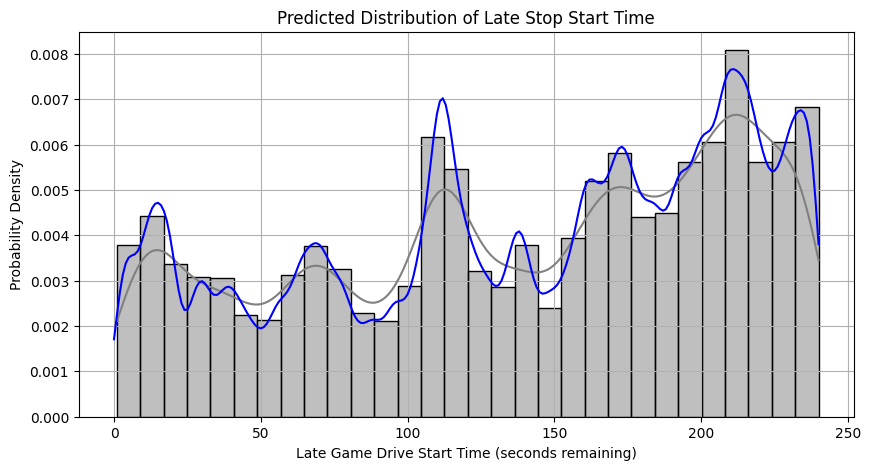

In [144]:
#CKDE Model -- All standard scaling

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import train_test_split


#OLD VARIABLES


    # "ydstogo",
    # "defteam_timeouts_remaining",
    # "posteam_timeouts_remaining",
    # "defteam_home_status",
    # "wp"


# ---------------------------------------------
# Step 1: Prepare Data
# ---------------------------------------------
df = df_late_stop_games.copy()

# One-hot encode 'down' early so X and example_state match
df = pd.get_dummies(df, columns=["down"], drop_first=True)

# Define features and target
base_features = [
    "game_seconds_remaining",
    "score_differential",
    "yardline_100",
    "spread_line",
    "offensive_dvoa_difference",
    "defensive_dvoa_difference",
    "special_teams_dvoa_difference",
]


# Add any new one-hot encoded columns from 'down'
down_features = [col for col in df.columns if col.startswith("down_")]

# Final feature list
features = base_features + down_features

X = df[features]
y = df["drive_start_time"]

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# ---------------------------------------------
# Step 2: Fit Joint KDE on [X, y]
# ---------------------------------------------
# Combine scaled features with y to build joint distribution
XY = np.hstack([X_scaled, y.values.reshape(-1, 1)])
kde = KernelDensity(bandwidth=3.0, kernel='gaussian')
kde.fit(XY)

# ---------------------------------------------
# Step 3: Predict Conditional Density Function
# ---------------------------------------------
def predict_cde(x_cond, grid=np.linspace(0, 240, 241), scaler=scaler):
    x_cond = pd.DataFrame([x_cond])
    x_cond = pd.get_dummies(x_cond, columns=["down"], drop_first=True)
    x_cond = x_cond.reindex(columns=X.columns, fill_value=0)
    x_scaled = scaler.transform(x_cond)

    XY_eval = np.hstack([np.repeat(x_scaled, len(grid), axis=0), grid.reshape(-1, 1)])
    log_dens = kde.score_samples(XY_eval)
    dens = np.exp(log_dens)

    integral = np.trapz(dens, grid)
    if integral <= 0 or np.isnan(integral):
        dens[:] = 0
    else:
        dens /= integral  # normalize to form valid PDF

    return grid, dens

# ---------------------------------------------
# Step 4: Example Input and Plot
# ---------------------------------------------
example_state = {
    "game_seconds_remaining": 180,
    "score_differential": -7,
    "yardline_100": 60,
    "spread_line": 0,
    "offensive_dvoa_difference": 0,
    "defensive_dvoa_difference": 0,
    "special_teams_dvoa_difference": 0,
    "down": 2
}

grid, dens = predict_cde(example_state)

plt.figure(figsize=(10, 5))
sns.histplot(y, label="Actual Start Times", stat="density", kde=True, color='gray', bins=30)
plt.plot(grid, dens, color="blue")
plt.title("Predicted Distribution of Late Stop Start Time")
plt.xlabel("Late Game Drive Start Time (seconds remaining)")
plt.ylabel("Probability Density")
plt.grid(True)
plt.show()


`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.


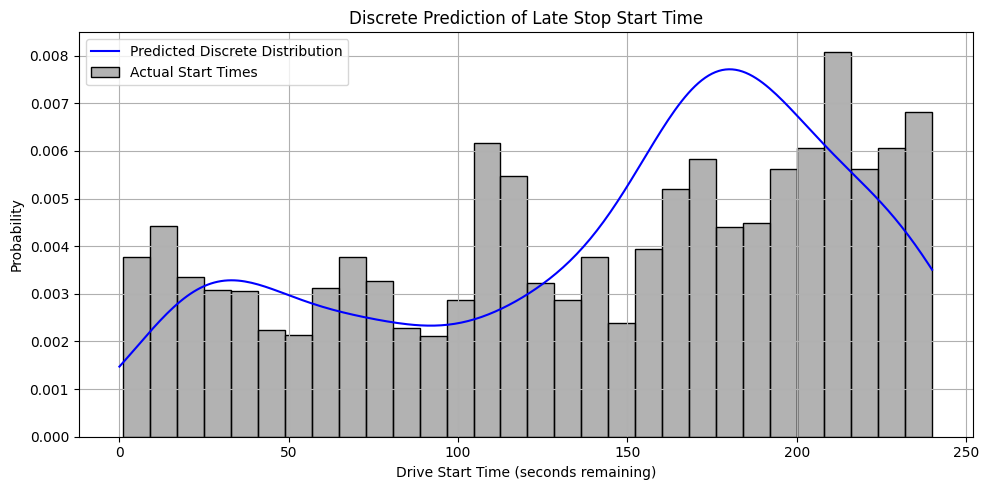

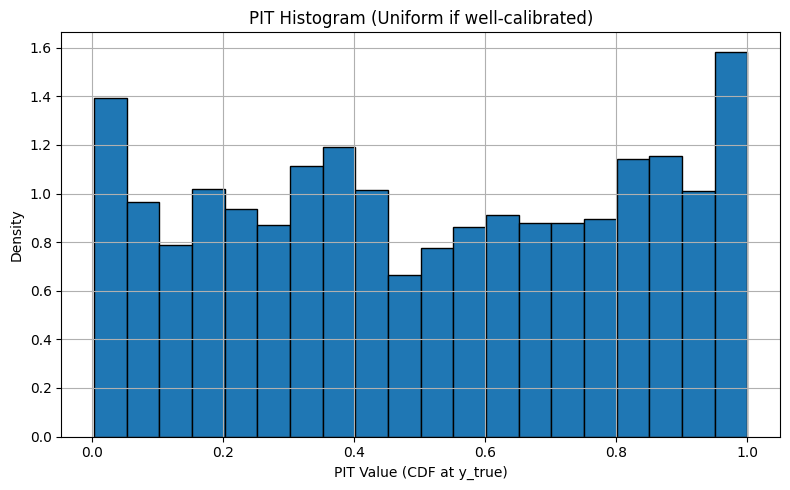

In [212]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import QuantileTransformer, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.neighbors import NearestNeighbors, KernelDensity
from sklearn.base import BaseEstimator
import matplotlib.pyplot as plt
import seaborn as sns

#--------------------------------------------------
# Step 1: Prepare Data
#--------------------------------------------------
df = df_late_stop_games.copy()

# Target
y = df["drive_start_time"]

# Feature sets
quantile_features = ["game_seconds_remaining", "yardline_100"]
standard_features = [
    "spread_line",
    "offensive_dvoa_difference",
    "defensive_dvoa_difference",
    "special_teams_dvoa_difference"
]
categorical_features = ["down"]

# Combine for X
features = quantile_features + standard_features + categorical_features
X = df[features]

#--------------------------------------------------
# Step 2: Preprocessing Pipeline
#--------------------------------------------------
preprocessor = ColumnTransformer([
    ("quantile", QuantileTransformer(output_distribution="normal"), quantile_features),
    ("standard", StandardScaler(), standard_features),
    ("onehot", OneHotEncoder(drop="first", sparse=False), categorical_features)
])

# Fit and transform
X_transformed = preprocessor.fit_transform(X)
ckde_columns = preprocessor.get_feature_names_out()

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.2, random_state=42)

#--------------------------------------------------
# Step 3: Discrete CKDE Model Definition
#--------------------------------------------------
class ConditionalKernelDensity(BaseEstimator):
    def __init__(self, bandwidth=20.0, n_neighbors=200):
        self.bandwidth = bandwidth
        self.n_neighbors = n_neighbors

    def fit(self, X, y):
        self.X_train = np.array(X)
        self.y_train = np.array(y)
        self.nbrs = NearestNeighbors(n_neighbors=self.n_neighbors).fit(self.X_train)
        return self

    def predict(self, X_cond, grid):
        densities = []
        for x in np.atleast_2d(X_cond):
            dists, idxs = self.nbrs.kneighbors([x])
            y_subset = self.y_train[idxs[0]]
            kde = KernelDensity(kernel='gaussian', bandwidth=self.bandwidth)
            kde.fit(y_subset.reshape(-1, 1))
            log_dens = kde.score_samples(grid.reshape(-1, 1))
            dens = np.exp(log_dens)
            dens /= np.sum(dens)  # Normalize for discrete
            densities.append(dens)
        return np.array(densities)

    def predict_cdf(self, X_cond, y_actual, grid):
        pit_values = []
        for x, y in zip(X_cond, y_actual):
            dens = self.predict([x], grid)[0]
            cdf = np.cumsum(dens)
            idx = np.abs(grid - y).argmin()
            pit = cdf[idx]
            pit_values.append(pit)
        return np.array(pit_values)

#--------------------------------------------------
# Step 4: Train CKDE
#--------------------------------------------------
ckde = ConditionalKernelDensity(bandwidth=20.0, n_neighbors=200)
ckde.fit(X_train, y_train)

#--------------------------------------------------
# Step 5: Discrete Grid Prediction
#--------------------------------------------------
# Define a DISCRETE integer grid from 0 to 240 seconds
grid = np.arange(0, 241)

# Example prediction
example_state = pd.DataFrame([{
    "game_seconds_remaining": 180,
    "score_differential": -7,
    "yardline_100": 60,
    "spread_line": 0,
    "offensive_dvoa_difference": 0,
    "defensive_dvoa_difference": 0,
    "special_teams_dvoa_difference": 0,
    "down": 2
}])

example_transformed = preprocessor.transform(example_state)
dens = ckde.predict(example_transformed, grid)[0]

#--------------------------------------------------
# Step 6: Plot
#--------------------------------------------------
plt.figure(figsize=(10, 5))
sns.histplot(y, label="Actual Start Times", stat="density", bins=30, color='gray', alpha=0.6)
plt.plot(grid, dens, color="blue", label="Predicted Discrete Distribution")
plt.title("Discrete Prediction of Late Stop Start Time")
plt.xlabel("Drive Start Time (seconds remaining)")
plt.ylabel("Probability")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

#--------------------------------------------------
# Step 7: Optional PIT Histogram
#--------------------------------------------------
X_test_clean = X_test[np.isfinite(X_test).all(axis=1)]
y_test_clean = y_test[np.isfinite(X_test).all(axis=1)]
pit_values = ckde.predict_cdf(X_test_clean, y_test_clean, grid)

plt.figure(figsize=(8, 5))
plt.hist(pit_values, bins=20, density=True, edgecolor='black')
plt.title("PIT Histogram (Uniform if well-calibrated)")
plt.xlabel("PIT Value (CDF at y_true)")
plt.ylabel("Density")
plt.grid(True)
plt.tight_layout()
plt.show()


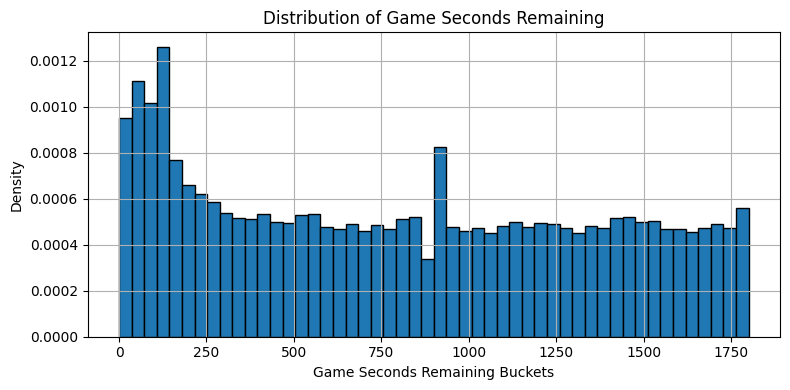

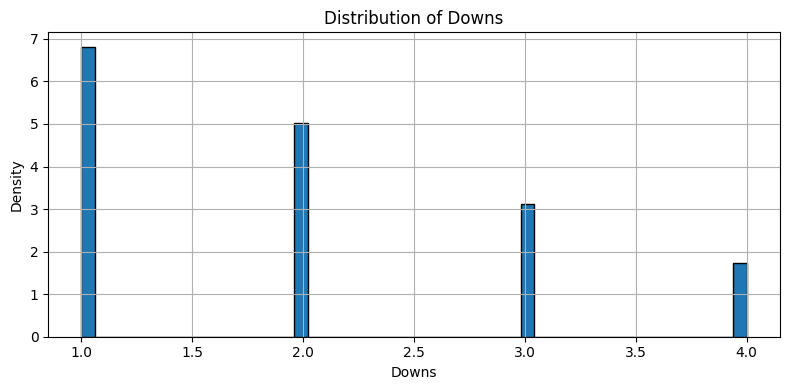

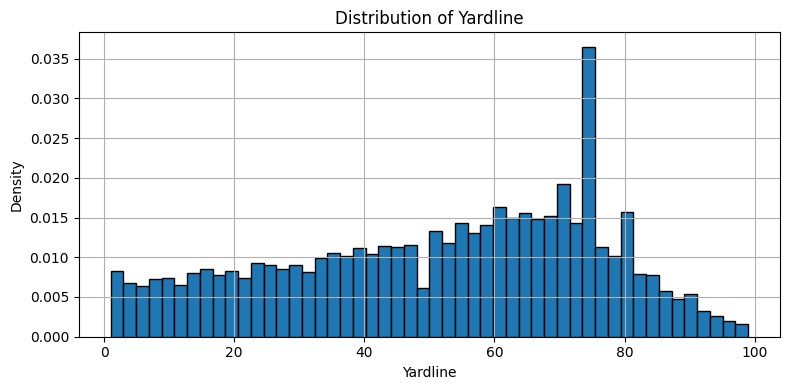

In [92]:
#Visualize Distribution of Independent Variables

plt.figure(figsize=(8, 4))
plt.hist(df_late_stop_games["game_seconds_remaining"], bins=50, edgecolor='black', density=True)
plt.title("Distribution of Game Seconds Remaining")
plt.xlabel("Game Seconds Remaining Buckets")
plt.ylabel("Density")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.hist(df_late_stop_games["down"], bins=50, edgecolor='black', density=True)
plt.title("Distribution of Downs")
plt.xlabel("Downs")
plt.ylabel("Density")
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 4))
plt.hist(df_late_stop_games["yardline_100"], bins=50, edgecolor='black', density=True)
plt.title("Distribution of Yardline")
plt.xlabel("Yardline")
plt.ylabel("Density")
plt.grid(True)
plt.tight_layout()
plt.show()


# plt.hist(df_late_stop_games["score_differential"], bins=50, edgecolor='black', density=True)
# plt.title("Distribution of Score Differential")
# plt.xlabel("Score Differential")
# plt.ylabel("Density")
# plt.grid(True)
# plt.tight_layout()
# plt.show()


# plt.hist(df_late_stop_games["offensive_dvoa_difference"], bins=50, edgecolor='black', density=True)
# plt.title("Distribution of Offense DVOA Difference")
# plt.xlabel("Offense DVOA Difference")
# plt.ylabel("Density")
# plt.grid(True)
# plt.tight_layout()
# plt.show()

# plt.hist(df_late_stop_games["defensive_dvoa_difference"], bins=50, edgecolor='black', density=True)
# plt.title("Distribution of Defensive DVOA Difference")
# plt.xlabel("Defensive DVOA Difference")
# plt.ylabel("Density")
# plt.grid(True)
# plt.tight_layout()
# plt.show()

# plt.hist(df_late_stop_games["special_teams_dvoa_difference"], bins=50, edgecolor='black', density=True)
# plt.title("Distribution of Special Teams DVOA Difference")
# plt.xlabel("Special Teams DVOA Difference")
# plt.ylabel("Density")
# plt.grid(True)
# plt.tight_layout()
# plt.show()

In [ ]:
#Probability Modeling

In [148]:
#PBP EXPANDED: Probability & Starting WP Models Main Table Cleaning / Transformation

#------------------------------------------------------------------------------------------------------------------------------------------#
#Select columns

pbp_main_expanded = pbp_py [['game_id','posteam','defteam','away_team','home_team','qtr','game_seconds_remaining',
                    'time','score_differential','posteam_timeouts_remaining','defteam_timeouts_remaining',
                    'away_timeouts_remaining','home_timeouts_remaining','timeout','timeout_team','wp','def_wp',
                    'wpa','home_wp_post','away_wp_post','spread_line','drive','series','yrdln','yardline_100',
                    'down','ydstogo','play_type','yards_gained','rush_attempt','pass_attempt','own_kickoff_recovery','temp','wind',
                    'first_down','series_result','fg_prob','td_prob','total_home_epa','total_away_epa']].copy()

#------------------------------------------------------------------------------------------------------------------------------------------#

#Fill all def_wp null values with 0 (because when the game is over, it is initally recorded as null instead of 0)
pbp_main_expanded['wp'] = pbp_main_expanded['wp'].fillna(0)
pbp_main_expanded['def_wp'] = pbp_main_expanded['def_wp'].fillna(0)
pbp_main_expanded['home_wp_post'] = pbp_main_expanded['home_wp_post'].fillna(0)
pbp_main_expanded['away_wp_post'] = pbp_main_expanded['away_wp_post'].fillna(0)

#------------------------------------------------------------------------------------------------------------------------------------------#

#Remove all plays where the first down doesn't begin with X minutes or less remaining

    #Create column for "seconds remaining in series" 
pbp_main_expanded['series_start_seconds_remaining'] = pbp_main_expanded.groupby(['game_id','series'])['game_seconds_remaining'].transform('first')
 

condensed_pbp_main = pbp_main[['game_id','drive','drive_late_def_stop','game_late_def_stop']]

condensed_pbp_main = condensed_pbp_main.groupby(['game_id','drive']).agg({'drive_late_def_stop':'mean','game_late_def_stop':'mean'})

condensed_pbp_main.reset_index(inplace = True)

condensed_pbp_main.head(300)


pbp_main_expanded = pbp_main_expanded.merge(condensed_pbp_main, on = ['game_id','drive'], how = 'left')




pbp_main_expanded['drive_late_def_stop'] = pbp_main_expanded['drive_late_def_stop'].fillna(0)
pbp_main_expanded['game_late_def_stop'] = pbp_main_expanded['game_late_def_stop'].fillna(0)
pbp_main_expanded['game_late_def_stop'] = pbp_main_expanded.groupby(['game_id'])['game_late_def_stop'].transform('max')

pbp_main_expanded['team_with_late_def_stop'] = np.where(
        pbp_main_expanded['drive_late_def_stop'] == 1, pbp_main_expanded['defteam'],0)





# Step 1: Ensure proper missing values
pbp_main_expanded['team_with_late_def_stop'] = pbp_main_expanded['team_with_late_def_stop'].replace({None: 0})

# Step 2: Get all teams that had a late defensive stop by game
late_def_teams_by_game = (
    pbp_main_expanded[pbp_main_expanded['team_with_late_def_stop'] != 0]  # or use ~df['team_with_late_def_stop'].isna() if using NaNs
    .groupby('game_id')['team_with_late_def_stop']
    .unique()  # or .unique()[0] if you want to be safer
)

# # Step 3: Map this list of defensive stop teams back to each play
pbp_main_expanded['late_def_teams_in_game'] = pbp_main_expanded['game_id'].map(late_def_teams_by_game)

# Step 4: Check whether the current offensive team (posteam) will later have a defensive stop
pbp_main_expanded['team_will_later_have_a_def_stop'] = pbp_main_expanded.apply(
    lambda row: int(row['posteam'] in row['late_def_teams_in_game']) if isinstance(row['late_def_teams_in_game'], (list, np.ndarray)) else 0,
    axis=1
)

#------------------------------------------------------------------------------------------------------------------------------------------#

#Merge in the DVOA numbers for the offense and defensive teams

    #Create column: "Year" based on the first four characters of the game ID

pbp_main_expanded['year'] = pbp_main_expanded['game_id'].str[0:4]
pbp_main_expanded['year'] = pbp_main_expanded['year'].astype(int)



    #Offensive DVOA

pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_offense, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'OFFENSE DVOA': 'posteam_offensive_dvoa','OFFENSE RANK':'posteam_offensive_rank'}, inplace=True)


pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_offense, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'OFFENSE DVOA': 'defteam_offensive_dvoa','OFFENSE RANK':'defteam_offensive_rank'}, inplace=True)




    #Defensive DVOA

pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_defense, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'DEFENSE DVOA': 'defteam_defensive_dvoa','DEFENSE RANK':'defteam_defensive_rank'}, inplace=True)

pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_defense, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'DEFENSE DVOA': 'posteam_defensive_dvoa','DEFENSE RANK':'posteam_defensive_rank'}, inplace=True)


    #Total DVOA

pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_total, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'TOTAL DVOA': 'defteam_total_dvoa','TOTAL RANK':'defteam_total_rank'}, inplace=True)


pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_total, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'TOTAL DVOA': 'posteam_total_dvoa','TOTAL RANK':'posteam_total_rank'}, inplace=True)


    #Special Teams DVOA

pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_special_teams, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'SPECIAL TEAMS DVOA': 'defteam_special_teams_dvoa','SPECIAL TEAMS RANK':'defteam_special_teams_rank'}, inplace=True)


pbp_main_expanded = pbp_main_expanded.merge(
    dvoa_special_teams, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_main_expanded.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)
pbp_main_expanded.rename(columns={'SPECIAL TEAMS DVOA': 'posteam_special_teams_dvoa','SPECIAL TEAMS RANK':'posteam_special_teams_rank'}, inplace=True)







pbp_main_expanded['offensive_dvoa_difference'] = pbp_main_expanded['posteam_offensive_dvoa'] + pbp_main_expanded['defteam_defensive_dvoa']
pbp_main_expanded['defensive_dvoa_difference'] = pbp_main_expanded['posteam_defensive_dvoa'] + pbp_main_expanded['defteam_offensive_dvoa']
pbp_main_expanded['special_teams_dvoa_difference'] = pbp_main_expanded['posteam_special_teams_dvoa'] - pbp_main_expanded['defteam_special_teams_dvoa']
pbp_main_expanded['total_dvoa_difference'] = pbp_main_expanded['posteam_total_dvoa'] - pbp_main_expanded['defteam_total_dvoa']

#------------------------------------------------------------------------------------------------------------------------------------------#


#EPA / Play Numbers



# pbp_main_expanded["play_number"] = (
#     pbp_main_expanded
#     .groupby(["game_id", "posteam"])
#     .cumcount() + 1
# )


# pbp_main_expanded['home_epa_per_play'] = pbp_main_expanded["total_home_epa"] / pbp_main_expanded["play_number"]
# pbp_main_expanded['away_epa_per_play'] = pbp_main_expanded["total_away_epa"] / pbp_main_expanded["play_number"]


# pbp_main_expanded['posteam_epa_per_play'] =    np.where( 
#         pbp_main_expanded['home_team'] == pbp_main_expanded['posteam'], pbp_main_expanded['home_epa_per_play'], np.where(
#         pbp_main_expanded['away_team'] == pbp_main_expanded['posteam'], pbp_main_expanded['away_epa_per_play'],
#         np.nan  # Leave the value as NaN if neither condition is met
#     ))

# pbp_main_expanded['defteam_epa_per_play'] =    np.where( 
#         pbp_main_expanded['home_team'] == pbp_main_expanded['defteam'], pbp_main_expanded['home_epa_per_play'], np.where(
#         pbp_main_expanded['away_team'] == pbp_main_expanded['defteam'], pbp_main_expanded['away_epa_per_play'],
#         np.nan  # Leave the value as NaN if neither condition is met
#     ))


# pbp_main_expanded['epa_per_play_difference'] = pbp_main_expanded['posteam_epa_per_play'] - pbp_main_expanded['defteam_epa_per_play']

#------------------------------------------------------------------------------------------------------------------------------------------#




pbp_main_expanded['defteam_home_status'] = np.where(
    pbp_main_expanded['home_team'] == pbp_main_expanded['defteam'], 1, np.where(
        pbp_main_expanded['defteam'] == pbp_main_expanded['away_team'], 0,
        np.nan  # Leave the value as NaN if neither condition is met
    ))


    #Win Probability
pbp_main_expanded['drive_beginning_def_wp'] = pbp_main_expanded.groupby(['game_id','drive'])['def_wp'].transform('first')
pbp_main_expanded['drive_end_def_wp'] = pbp_main_expanded.groupby(['game_id','drive'])['def_wp'].transform('last') #***This does not include the last play of the drive (e.g. the punt, FG, etc.)

    #Timeouts
pbp_main_expanded['drive_beginning_def_to'] = pbp_main_expanded.groupby(['game_id','drive'])['defteam_timeouts_remaining'].transform('first')
pbp_main_expanded['drive_end_def_to'] = pbp_main_expanded.groupby(['game_id','drive'])['defteam_timeouts_remaining'].transform('last')


    #Creat column: Binary indicator if offense is in the redzone

pbp_main_expanded['redzone'] = np.where(pbp_main_expanded['yardline_100']<=20, 1,0)

pbp_main_expanded['offteam_home_status'] = np.where(
    pbp_main_expanded['home_team'] == pbp_main_expanded['posteam'], 1, np.where(
        pbp_main_expanded['posteam'] == pbp_main_expanded['away_team'], 0,
        np.nan  # Leave the value as NaN if neither condition is met
    ))





pbp_main_expanded = pbp_main_expanded.query('qtr == 3 | qtr == 4')

pbp_main_expanded.head(10)


,game_id,posteam,defteam,away_team,home_team,qtr,game_seconds_remaining,time,score_differential,posteam_timeouts_remaining,defteam_timeouts_remaining,away_timeouts_remaining,home_timeouts_remaining,timeout,timeout_team,wp,def_wp,wpa,home_wp_post,away_wp_post,spread_line,drive,series,yrdln,yardline_100,down,ydstogo,play_type,yards_gained,rush_attempt,pass_attempt,own_kickoff_recovery,temp,wind,first_down,series_result,fg_prob,td_prob,total_home_epa,total_away_epa,series_start_seconds_remaining,drive_late_def_stop,game_late_def_stop,team_with_late_def_stop,late_def_teams_in_game,team_will_later_have_a_def_stop,year,posteam_offensive_dvoa,posteam_offensive_rank,defteam_offensive_dvoa,defteam_offensive_rank,defteam_defensive_dvoa,defteam_defensive_rank,posteam_defensive_dvoa,posteam_defensive_rank,defteam_total_dvoa,defteam_total_rank,posteam_total_dvoa,posteam_total_rank,defteam_special_teams_dvoa,defteam_special_teams_rank,posteam_special_teams_dvoa,posteam_special_teams_rank,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,defteam_home_status,drive_beginning_def_wp,drive_end_def_wp,drive_beginning_def_to,drive_end_def_to,redzone,offteam_home_status
87,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1800.0,15:00,6.0,3.0,3.0,3.0,3.0,0.0,None,0.745837,0.254163,0.000000,0.745837,0.254163,4.5,12.0,24.0,BAL 35,35.0,NaN,0.0,kickoff,0.0,0.0,0.0,0.0,88.0,13.0,0.0,Opp touchdown,0.227784,0.352274,6.221875,-6.221875,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0
88,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1800.0,15:00,6.0,3.0,3.0,3.0,3.0,0.0,None,0.745837,0.254163,-0.012221,0.733616,0.266384,4.5,12.0,24.0,DEN 20,80.0,1.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.227784,0.352274,5.607522,-5.607522,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0
89,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1797.0,14:57,6.0,3.0,3.0,3.0,3.0,0.0,None,0.733616,0.266384,-0.021758,0.711858,0.288142,4.5,12.0,24.0,DEN 20,80.0,2.0,10.0,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Opp touchdown,0.205863,0.315427,4.920987,-4.920987,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0
90,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1753.0,14:13,6.0,3.0,3.0,3.0,3.0,0.0,None,0.711858,0.288142,-0.171003,0.540856,0.459144,4.5,12.0,24.0,DEN 20,80.0,3.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.186743,0.274310,-1.760423,1.760423,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0
91,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1744.0,14:04,0.0,3.0,3.0,3.0,3.0,0.0,None,0.459144,0.540856,0.005757,0.535099,0.464901,4.5,NaN,24.0,DEN 15,15.0,NaN,0.0,extra_point,0.0,0.0,0.0,0.0,88.0,13.0,0.0,Opp touchdown,0.000000,0.000000,-1.827996,1.827996,1800.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.007070,14.0,0.073313,1.0,-0.244794,0.032316,0.066243,-0.210866,1.0,NaN,NaN,NaN,NaN,1,0.0
92,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1744.0,14:04,-1.0,3.0,3.0,3.0,3.0,0.0,None,0.535099,0.464901,0.000000,0.535099,0.464901,4.5,13.0,25.0,BAL 35,35.0,NaN,0.0,kickoff,0.0,0.0,0.0,0.0,88.0,13.0,0.0,Punt,0.232499,0.351124,-1.827996,1.827996,1744.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.464901,0.531315,3.0,3.0,0,1.0
93

In [150]:
#PBP EXPANDED ADJUSTMENTS

pbp_main_expanded = pbp_main_expanded.dropna(subset=["game_seconds_remaining",'score_differential','yardline_100','down'])
pbp_second_half_plays = pbp_main_expanded
pbp_main_expanded.head(10)

,game_id,posteam,defteam,away_team,home_team,qtr,game_seconds_remaining,time,score_differential,posteam_timeouts_remaining,defteam_timeouts_remaining,away_timeouts_remaining,home_timeouts_remaining,timeout,timeout_team,wp,def_wp,wpa,home_wp_post,away_wp_post,spread_line,drive,series,yrdln,yardline_100,down,ydstogo,play_type,yards_gained,rush_attempt,pass_attempt,own_kickoff_recovery,temp,wind,first_down,series_result,fg_prob,td_prob,total_home_epa,total_away_epa,series_start_seconds_remaining,drive_late_def_stop,game_late_def_stop,team_with_late_def_stop,late_def_teams_in_game,team_will_later_have_a_def_stop,year,posteam_offensive_dvoa,posteam_offensive_rank,defteam_offensive_dvoa,defteam_offensive_rank,defteam_defensive_dvoa,defteam_defensive_rank,posteam_defensive_dvoa,posteam_defensive_rank,defteam_total_dvoa,defteam_total_rank,posteam_total_dvoa,posteam_total_rank,defteam_special_teams_dvoa,defteam_special_teams_rank,posteam_special_teams_dvoa,posteam_special_teams_rank,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,defteam_home_status,drive_beginning_def_wp,drive_end_def_wp,drive_beginning_def_to,drive_end_def_to,redzone,offteam_home_status
88,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1800.0,15:00,6.0,3.0,3.0,3.0,3.0,0.0,None,0.745837,0.254163,-0.012221,0.733616,0.266384,4.5,12.0,24.0,DEN 20,80.0,1.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.227784,0.352274,5.607522,-5.607522,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0
89,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1797.0,14:57,6.0,3.0,3.0,3.0,3.0,0.0,None,0.733616,0.266384,-0.021758,0.711858,0.288142,4.5,12.0,24.0,DEN 20,80.0,2.0,10.0,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Opp touchdown,0.205863,0.315427,4.920987,-4.920987,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0
90,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1753.0,14:13,6.0,3.0,3.0,3.0,3.0,0.0,None,0.711858,0.288142,-0.171003,0.540856,0.459144,4.5,12.0,24.0,DEN 20,80.0,3.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.186743,0.274310,-1.760423,1.760423,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0
93,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1744.0,14:04,-1.0,3.0,3.0,3.0,3.0,0.0,None,0.535099,0.464901,-0.014326,0.520773,0.479227,4.5,13.0,25.0,DEN 20,80.0,1.0,10.0,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Punt,0.232499,0.351124,-2.333716,2.333716,1744.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.464901,0.531315,3.0,3.0,0,1.0
94,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1700.0,13:20,-1.0,3.0,3.0,3.0,3.0,0.0,None,0.520773,0.479227,-0.034656,0.486117,0.513883,4.5,13.0,25.0,DEN 20,80.0,2.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Punt,0.214879,0.321620,-3.100584,3.100584,1744.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.464901,0.531315,3.0,3.0,0,1.0
95,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1695.0,13:15,-1.0,3.0,3.0,3.0,3.0,0.0,None,0.486117,0.513883,-0.017432,0.468685,0.531315,4.5,13.0,25.0,DEN 20,80.0,3.0,10.0,pass,7.0,0.0,1.0,0.0,88.0,13.0,0.0,Punt,0.190376,0.275455,-3.748347,3.748347,1744.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.464901,0.531315,3.0,3.0,0,1.0
96,2015_01_BAL_

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
Attempting to set identical low and high ylims makes transformation singular; automatically expanding.


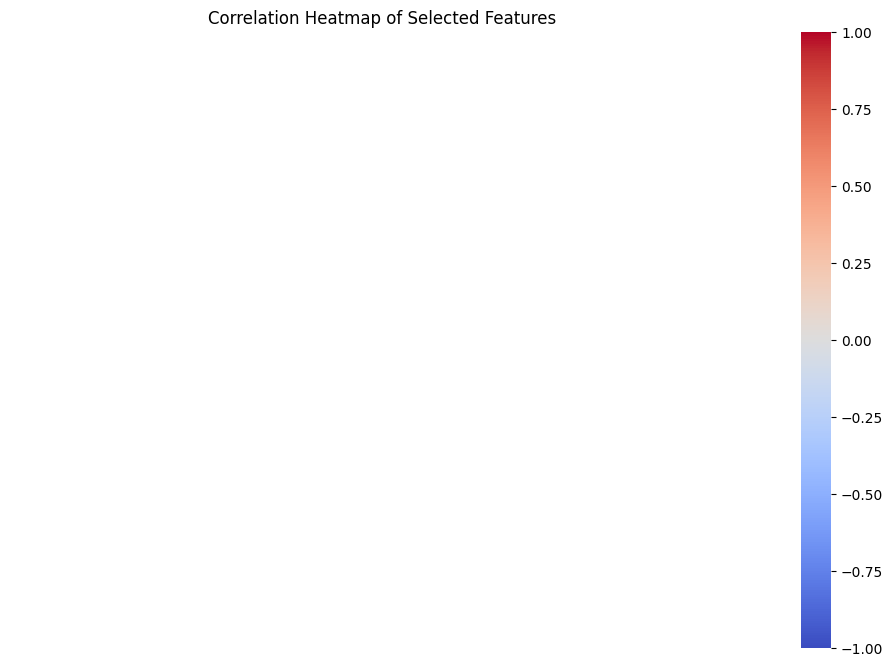

In [152]:
#Correlation Heatmap

features = []

# Compute correlation matrix for only these variables
corr_matrix = pbp_main_expanded[features].corr()

# Create heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Heatmap of Selected Features")
plt.show()


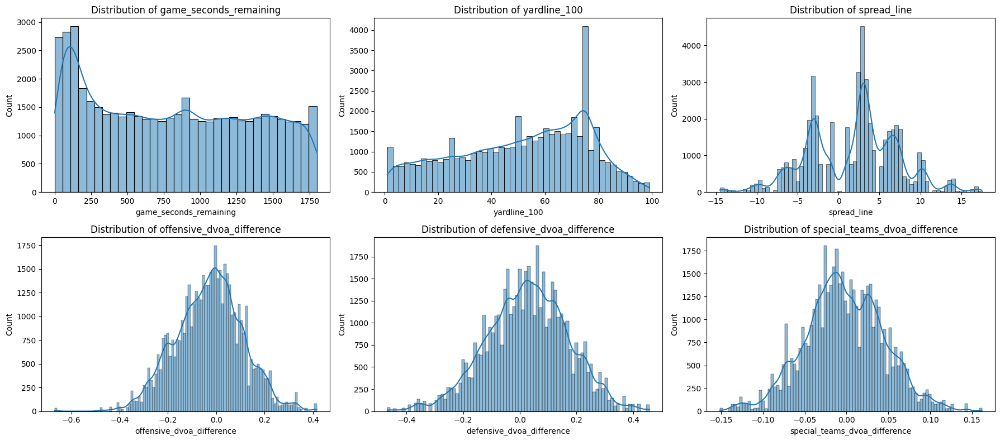

In [154]:
#Visualize Independent Variables (for scaling purposes)

# Choose the columns to visualize (replace with your actual X DataFrame)
columns_to_plot = X.columns[:6]  # Plot first 6 for example

# Create subplots: 2 rows, 3 columns
fig, axes = plt.subplots(2, 3, figsize=(18, 8))
axes = axes.flatten()  # Make it a 1D array for easy indexing

# Loop through each feature and plot
for i, col in enumerate(columns_to_plot):
    sns.histplot(X[col], kde=True, ax=axes[i])
    axes[i].set_title(f"Distribution of {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Count")

# Clean layout
plt.tight_layout()
plt.show()

🔍 Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.65      0.75     30759
           1       0.40      0.75      0.52      9658

    accuracy                           0.67     40417
   macro avg       0.65      0.70      0.64     40417
weighted avg       0.78      0.67      0.70     40417

✅ Accuracy: 0.6726
✅ ROC AUC: 0.7625
✅ Brier Score: 0.200796

📊 Logistic Regression Coefficients:
                  Feature  Coefficient  Odds_Ratio
1      score_differential     2.159684    8.668399
0  game_seconds_remaining     0.192731    1.212556
2                 ydstogo    -0.017949    0.982211
5                down_2.0    -0.068001    0.934259
6                down_3.0    -0.160321    0.851870
3            yardline_100    -0.207384    0.812708
7                down_4.0    -0.310397    0.733156
4                      wp    -2.474771    0.084182




Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



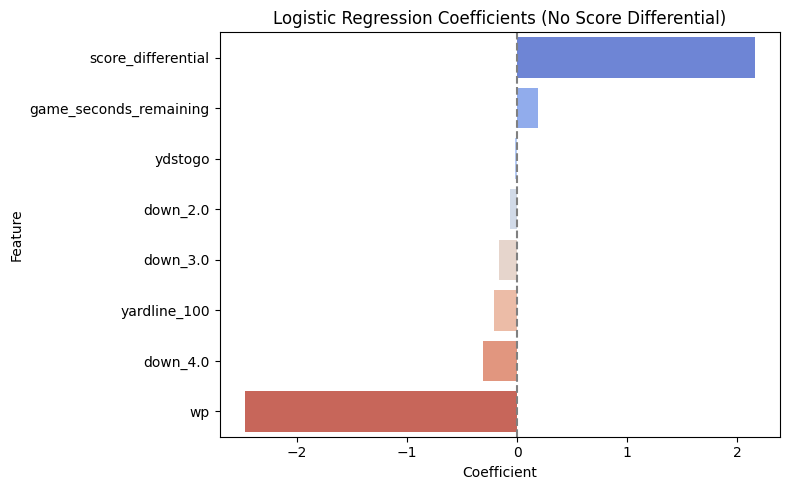

In [156]:
#Probability Model Logistic Regression w/Scaling

import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics import accuracy_score, roc_auc_score, brier_score_loss, classification_report
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# -------------------------------
# Step 1: Define features and target
# -------------------------------

features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100', 
    'down',
    'ydstogo',
    'wp'
]

X = pbp_main_expanded[features]
y = pbp_main_expanded['team_will_later_have_a_def_stop']

# -------------------------------
# Step 2: Train/test split
# -------------------------------

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# -------------------------------
# Step 3: Column-Specific Scaling
# -------------------------------

robust_cols = ['game_seconds_remaining', 'score_differential', 'ydstogo']
standard_cols = ['yardline_100', 'wp']

preprocessor = ColumnTransformer(
    transformers=[
        ('robust', RobustScaler(), robust_cols),
        ('standard', StandardScaler(), standard_cols),
        ('onehot', OneHotEncoder(drop='first'), ['down'])
    ]
)

# Fit + transform train, transform test
X_train_scaled = preprocessor.fit_transform(X_train)
X_test_scaled = preprocessor.transform(X_test)

# Save feature names
feature_names = []
for name, transformer, cols in preprocessor.transformers_:
    if hasattr(transformer, 'get_feature_names_out'):
        names = transformer.get_feature_names_out(cols)
    else:
        names = cols
    feature_names.extend(names)

# -------------------------------
# Step 4: Fit logistic regression
# -------------------------------

logit_model = LogisticRegression(class_weight='balanced', max_iter=1000)
logit_model.fit(X_train_scaled, y_train)

# -------------------------------
# Step 5: Evaluate model
# -------------------------------

y_pred_probs = logit_model.predict_proba(X_test_scaled)[:, 1]
y_pred_class = logit_model.predict(X_test_scaled)

print("🔍 Classification Report:")
print(classification_report(y_test, y_pred_class))

print(f"✅ Accuracy: {accuracy_score(y_test, y_pred_class):.4f}")
print(f"✅ ROC AUC: {roc_auc_score(y_test, y_pred_probs):.4f}")
print(f"✅ Brier Score: {brier_score_loss(y_test, y_pred_probs):.6f}")

# -------------------------------
# Step 6: Coefficient interpretation
# -------------------------------

coeff_df = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": logit_model.coef_[0]
})
coeff_df["Odds_Ratio"] = np.exp(coeff_df["Coefficient"])
coeff_df.sort_values("Odds_Ratio", ascending=False, inplace=True)

print("\n📊 Logistic Regression Coefficients:")
print(coeff_df)

# -------------------------------
# Step 7: Visualize coefficients
# -------------------------------

plt.figure(figsize=(8, 5))
sns.barplot(data=coeff_df, y="Feature", x="Coefficient", palette="coolwarm")
plt.axvline(0, color='gray', linestyle='--')
plt.title("Logistic Regression Coefficients (No Score Differential)")
plt.tight_layout()
plt.show()

# -------------------------------
# Step 8: Predict full-dataset probabilities
# -------------------------------

X_scaled_full = preprocessor.transform(X)
# pbp_main_expanded['prob_late_def_stop'] = logit_model.predict_proba(X_scaled_full)[:, 1]


In [336]:
#Calibration Graph for Logistic Regression Probability Model w/Scaling


from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Assume you already have:
# X_train_scaled, X_test_scaled, y_train, y_test

# --------------------------
# 1. Train calibrated models
# --------------------------
calib_sigmoid = CalibratedClassifierCV(LogisticRegression(), method='sigmoid', cv=5)
calib_isotonic = CalibratedClassifierCV(LogisticRegression(), method='isotonic', cv=5)

calib_sigmoid.fit(X_train_scaled, y_train)
calib_isotonic.fit(X_train_scaled, y_train)

# --------------------------
# 2. Predict probabilities
# --------------------------
probs_sigmoid = calib_sigmoid.predict_proba(X_test_scaled)[:, 1]
probs_isotonic = calib_isotonic.predict_proba(X_test_scaled)[:, 1]

# --------------------------
# 3. Calibration curves
# --------------------------
prob_true_sigmoid, prob_pred_sigmoid = calibration_curve(y_test, probs_sigmoid, n_bins=10)
prob_true_iso, prob_pred_iso = calibration_curve(y_test, probs_isotonic, n_bins=10)

plt.figure(figsize=(7, 6))
plt.plot(prob_pred_sigmoid, prob_true_sigmoid, marker='o', label="Sigmoid")
plt.plot(prob_pred_iso, prob_true_iso, marker='s', label="Isotonic")
plt.plot([0, 1], [0, 1], '--', color='gray', label="Perfect calibration")
plt.xlabel("Predicted Probability")
plt.ylabel("Observed Frequency")
plt.title("📊 Calibration Curve Comparison")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --------------------------
# 4. Performance comparison
# --------------------------
from sklearn.metrics import brier_score_loss, roc_auc_score

print("🔎 Model Performance:")
print(f"Sigmoid Brier Score:  {brier_score_loss(y_test, probs_sigmoid):.6f}")
print(f"Isotonic Brier Score: {brier_score_loss(y_test, probs_isotonic):.6f}")
print(f"Sigmoid ROC AUC:      {roc_auc_score(y_test, probs_sigmoid):.4f}")
print(f"Isotonic ROC AUC:     {roc_auc_score(y_test, probs_isotonic):.4f}")


ValueError: Found input variables with inconsistent numbers of samples: [161665, 39390]

Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.


🔍 Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.93      0.88     30759
           1       0.66      0.43      0.52      9658

    accuracy                           0.81     40417
   macro avg       0.75      0.68      0.70     40417
weighted avg       0.80      0.81      0.80     40417

✅ Accuracy: 0.8120
✅ ROC AUC: 0.8670
✅ Brier Score: 0.122692


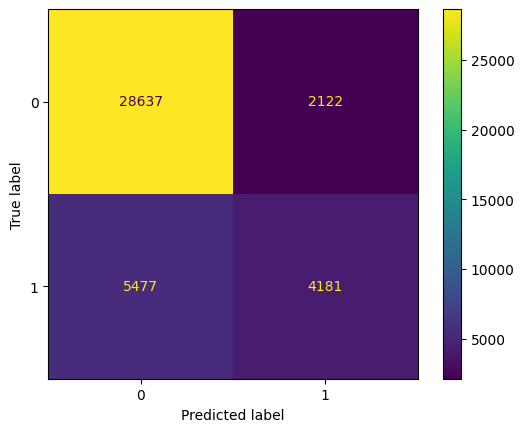

In [160]:
#Probability Model Gradient Boosted Regression (for predicting the PROBABILITY a team will later need a defensive stop)

from sklearn.experimental import enable_hist_gradient_boosting  # Only needed for older versions
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import (
    classification_report,
    accuracy_score,
    roc_auc_score,
    brier_score_loss,
    ConfusionMatrixDisplay
)

# -------------------------------
# 1. Define and preprocess features
# -------------------------------
features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp'
]

X = pbp_main_expanded[features]
y = pbp_main_expanded['team_will_later_have_a_def_stop']

# Optional: one-hot encode 'down' if you want to keep it numeric
X = pd.get_dummies(X, columns=['down'], drop_first=True)

# Train/test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# -------------------------------
# 2. Fit HistGradientBoostingClassifier
# -------------------------------
gb_model_columns = X_train.columns.tolist()
gb_model = HistGradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

# -------------------------------
# 3. Evaluate model
# -------------------------------
y_pred_class = gb_model.predict(X_test)
y_pred_probs = gb_model.predict_proba(X_test)[:, 1]

print("🔍 Classification Report:")
print(classification_report(y_test, y_pred_class))

print(f"✅ Accuracy: {accuracy_score(y_test, y_pred_class):.4f}")
print(f"✅ ROC AUC: {roc_auc_score(y_test, y_pred_probs):.4f}")
print(f"✅ Brier Score: {brier_score_loss(y_test, y_pred_probs):.6f}")

# -------------------------------
# 4. (Optional) Visualize Confusion Matrix
# -------------------------------
ConfusionMatrixDisplay.from_estimator(gb_model, X_test, y_test)


Glyph 128295 (\N{WRENCH}) missing from font(s) DejaVu Sans.
Glyph 128295 (\N{WRENCH}) missing from font(s) DejaVu Sans.


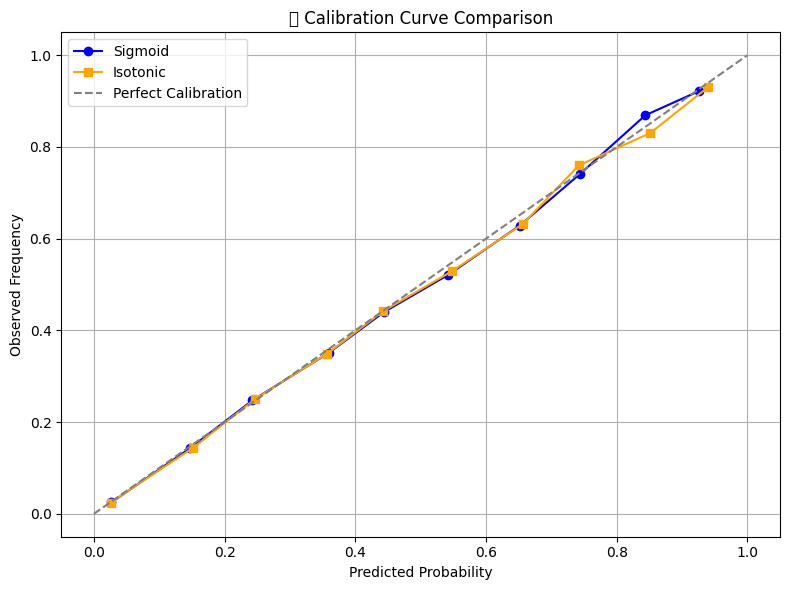

📊 Model Performance (Calibration)
Sigmoid Brier Score:  0.130763
Isotonic Brier Score: 0.130732
Sigmoid ROC AUC:      0.8434
Isotonic ROC AUC:     0.8434


In [162]:
#Assessment Stats / Graphs for Probability Model Gradient Boosted Regression (for predicting the PROBABILITY a team will later need a defensive stop)

from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.metrics import brier_score_loss, roc_auc_score, classification_report
import matplotlib.pyplot as plt
import numpy as np

# 1️⃣ Wrap your already-trained model with calibrated versions
calibrated_iso = CalibratedClassifierCV(gb_model, method='isotonic', cv=5)
calibrated_sigmoid = CalibratedClassifierCV(gb_model, method='sigmoid', cv=5)

# 2️⃣ Fit both calibrated models
calibrated_iso.fit(X_train_scaled, y_train)
calibrated_sigmoid.fit(X_train_scaled, y_train)

# 3️⃣ Predict probabilities
iso_probs = calibrated_iso.predict_proba(X_test_scaled)[:, 1]
sigmoid_probs = calibrated_sigmoid.predict_proba(X_test_scaled)[:, 1]

# 4️⃣ Calibration Curves
prob_true_iso, prob_pred_iso = calibration_curve(y_test, iso_probs, n_bins=10)
prob_true_sigmoid, prob_pred_sigmoid = calibration_curve(y_test, sigmoid_probs, n_bins=10)

# 5️⃣ Plot
plt.figure(figsize=(8, 6))
plt.plot(prob_pred_sigmoid, prob_true_sigmoid, marker='o', label='Sigmoid', color='blue')
plt.plot(prob_pred_iso, prob_true_iso, marker='s', label='Isotonic', color='orange')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfect Calibration')
plt.title("🔧 Calibration Curve Comparison")
plt.xlabel("Predicted Probability")
plt.ylabel("Observed Frequency")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 6️⃣ Metrics
print("📊 Model Performance (Calibration)")
print(f"Sigmoid Brier Score:  {brier_score_loss(y_test, sigmoid_probs):.6f}")
print(f"Isotonic Brier Score: {brier_score_loss(y_test, iso_probs):.6f}")
print(f"Sigmoid ROC AUC:      {roc_auc_score(y_test, sigmoid_probs):.4f}")
print(f"Isotonic ROC AUC:     {roc_auc_score(y_test, iso_probs):.4f}")


In [380]:
# -----------------------------------------------
# 📦 Imports
# -----------------------------------------------
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from sklearn.preprocessing import StandardScaler, QuantileTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.calibration import calibration_curve
from sklearn.metrics import (
    accuracy_score, roc_auc_score, brier_score_loss, classification_report
)
import matplotlib.pyplot as plt

# -----------------------------------------------
# 1. Preprocessing
# -----------------------------------------------
quantile_features = ["game_seconds_remaining", "yardline_100", "ydstogo", "wp"]
standard_features = [
    "score_differential", "spread_line",
    "offensive_dvoa_difference", "defensive_dvoa_difference",
    "special_teams_dvoa_difference"
]
categorical_features = ["down"]
all_raw_features = quantile_features + standard_features + categorical_features

preprocessor = ColumnTransformer([
    ("quantile", QuantileTransformer(output_distribution="normal"), quantile_features),
    ("standard", StandardScaler(), standard_features),
    ("onehot", OneHotEncoder(drop="first", sparse_output=False), categorical_features)
])

# -----------------------------------------------
# 2. Transform Data
# -----------------------------------------------
df = pbp_main_expanded.copy()
df = df.dropna(subset=all_raw_features + ["team_will_later_have_a_def_stop"])
preprocessor.fit(df[all_raw_features])
X_transformed = preprocessor.transform(df[all_raw_features])
feature_names = preprocessor.get_feature_names_out()

df_transformed = pd.DataFrame(X_transformed, columns=feature_names, index=df.index)
df = pd.concat([df, df_transformed], axis=1)
df["team_half_id"] = df["game_id"].astype(str) + "_" + df["posteam"].astype(str)

# -----------------------------------------------
# 3. Sequence Construction
# -----------------------------------------------
max_seq_len = 50
sequence_cols = feature_names.tolist()

X_sequences, y_labels, team_ids = [], [], []

for team_half_id, group in df.groupby("team_half_id"):
    group_sorted = group.sort_values("game_seconds_remaining", ascending=False)
    X_seq = group_sorted[sequence_cols].values

    # Pad
    if len(X_seq) < max_seq_len:
        pad = np.zeros((max_seq_len - len(X_seq), X_seq.shape[1]))
        X_seq = np.vstack([X_seq, pad])
    else:
        X_seq = X_seq[:max_seq_len]

    X_sequences.append(X_seq)
    y_labels.append(group_sorted["team_will_later_have_a_def_stop"].iloc[0])
    team_ids.append(team_half_id)

X_tensor = torch.tensor(np.stack(X_sequences), dtype=torch.float32)
y_tensor = torch.tensor(np.array(y_labels), dtype=torch.float32)

print(f"✅ Sequences shape: {X_tensor.shape}")
print(f"✅ Labels shape:    {y_tensor.shape}")

# -----------------------------------------------
# 4. LSTM Model Definition
# -----------------------------------------------
class TimeSeriesBinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=1, dropout=0.1):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, dropout=dropout)
        self.fc = nn.Sequential(
            nn.Linear(hidden_size, 32),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        _, (hn, _) = self.lstm(x)
        return self.fc(hn[-1])

# -----------------------------------------------
# 5. Train Model
# -----------------------------------------------
dataset = TensorDataset(X_tensor, y_tensor)
train_loader = DataLoader(dataset, batch_size=64, shuffle=True)

model = TimeSeriesBinaryClassifier(input_size=X_tensor.shape[2])
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

for epoch in range(10):
    model.train()
    total_loss = 0
    for xb, yb in train_loader:
        preds = model(xb).squeeze()
        loss = loss_fn(preds, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1} | Loss: {total_loss / len(train_loader):.4f}")

# -----------------------------------------------
# 6. Platt Calibration
# -----------------------------------------------
model.eval()
with torch.no_grad():
    raw_probs = model(X_tensor).squeeze().numpy()
    true_labels = y_tensor.numpy()

# Split and fit Platt scaling
probs_train, probs_val, y_train, y_val = train_test_split(raw_probs, true_labels, test_size=0.2, random_state=42)
platt = LogisticRegression()
platt.fit(probs_train.reshape(-1, 1), y_train)
calibrated_probs = platt.predict_proba(probs_val.reshape(-1, 1))[:, 1]

# Evaluate
print("\n🔎 Calibrated LSTM with Platt Scaling:")
print(f"✅ Brier Score: {brier_score_loss(y_val, calibrated_probs):.6f}")
print(f"✅ ROC AUC:     {roc_auc_score(y_val, calibrated_probs):.4f}")
print(f"✅ Accuracy:    {accuracy_score(y_val, (calibrated_probs >= 0.5).astype(int)):.4f}")

# -----------------------------------------------
# 7. Apply to pbp_second_half_plays
# -----------------------------------------------
pbp_df = pbp_second_half_plays.copy()
pbp_df["team_half_id"] = pbp_df["game_id"].astype(str) + "_" + pbp_df["posteam"].astype(str)

predictions = {}
for team_half_id, group in pbp_df.groupby("team_half_id"):
    if group[all_raw_features].isnull().any().any():
        continue
    X_seq = preprocessor.transform(group.sort_values("game_seconds_remaining", ascending=False)[all_raw_features])
    if len(X_seq) < max_seq_len:
        pad = np.zeros((max_seq_len - len(X_seq), X_seq.shape[1]))
        X_seq = np.vstack([X_seq, pad])
    else:
        X_seq = X_seq[:max_seq_len]

    X_tensor_input = torch.tensor(X_seq[np.newaxis, :, :], dtype=torch.float32)
    with torch.no_grad():
        raw_pred = model(X_tensor_input).item()
        calibrated = platt.predict_proba([[raw_pred]])[0][1]
        predictions[team_half_id] = calibrated

# Assign predictions
pbp_df["prob_late_game_stop_situation"] = pbp_df["team_half_id"].map(predictions)


✅ Sequences shape: torch.Size([5486, 50, 12])
✅ Labels shape:    torch.Size([5486])


dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1


Epoch 1 | Loss: 0.5931
Epoch 2 | Loss: 0.4848
Epoch 3 | Loss: 0.3610
Epoch 4 | Loss: 0.3012
Epoch 5 | Loss: 0.2729
Epoch 6 | Loss: 0.2682
Epoch 7 | Loss: 0.2546
Epoch 8 | Loss: 0.2470
Epoch 9 | Loss: 0.2431
Epoch 10 | Loss: 0.2420

🔎 Calibrated LSTM with Platt Scaling:
✅ Brier Score: 0.071564
✅ ROC AUC:     0.9541
✅ Accuracy:    0.9026


In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from sklearn.preprocessing import StandardScaler, QuantileTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import brier_score_loss, roc_auc_score, accuracy_score
from torch.utils.data import DataLoader, TensorDataset

# ----------------------------------------
# 1. Preprocessing Setup
# ----------------------------------------

quantile_features = ["game_seconds_remaining", "yardline_100", "ydstogo", "wp"]
standard_features = [
    "score_differential", "spread_line",
    "offensive_dvoa_difference", "defensive_dvoa_difference", "special_teams_dvoa_difference"
]
categorical_features = ["down"]
all_raw_features = quantile_features + standard_features + categorical_features

preprocessor = ColumnTransformer([
    ("quantile", QuantileTransformer(output_distribution="normal"), quantile_features),
    ("standard", StandardScaler(), standard_features),
    ("onehot", OneHotEncoder(drop="first", sparse_output=False), categorical_features)
])

df = pbp_main_expanded.copy()
df = df.dropna(subset=all_raw_features + ["team_will_later_have_a_def_stop"])
preprocessor.fit(df[all_raw_features])
X_all = preprocessor.transform(df[all_raw_features])
feature_names = preprocessor.get_feature_names_out()

df_transformed = pd.DataFrame(X_all, columns=feature_names, index=df.index)
df = pd.concat([df, df_transformed], axis=1)
df["team_half_id"] = df["game_id"].astype(str) + "_" + df["posteam"].astype(str)

# ----------------------------------------
# 2. Build Rolling Sequences Per Play
# ----------------------------------------

max_seq_len = 30
sequence_cols = feature_names.tolist()
X_sequences = []
y_labels = []
play_indices = []

for team_half_id, group in df.groupby("team_half_id"):
    group_sorted = group.sort_values("game_seconds_remaining", ascending=False).reset_index()
    label = group_sorted["team_will_later_have_a_def_stop"].iloc[0]

    for i in range(1, len(group_sorted)):
        start = max(0, i - max_seq_len)
        end = i
        window = group_sorted.loc[start:end - 1, sequence_cols].values

        if len(window) < max_seq_len:
            pad = np.zeros((max_seq_len - len(window), len(sequence_cols)))
            window = np.vstack([pad, window])

        X_sequences.append(window)
        y_labels.append(label)
        play_indices.append(group_sorted.loc[i, "index"])

X_tensor = torch.tensor(np.stack(X_sequences), dtype=torch.float32)
y_tensor = torch.tensor(y_labels, dtype=torch.float32)

# ----------------------------------------
# 3. LSTM Model Definition
# ----------------------------------------

class TimeSeriesBinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=64):
        super().__init__()
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size, batch_first=True)
        self.fc = nn.Sequential(
            nn.Linear(hidden_size, 32),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        _, (hn, _) = self.lstm(x)
        return self.fc(hn[-1])

# ----------------------------------------
# 4. Train the Model
# ----------------------------------------

dataset = TensorDataset(X_tensor, y_tensor)
train_loader = DataLoader(dataset, batch_size=64, shuffle=True)

model = TimeSeriesBinaryClassifier(input_size=X_tensor.shape[2])
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

n_epochs = 10
for epoch in range(n_epochs):
    model.train()
    total_loss = 0
    for xb, yb in train_loader:
        pred = model(xb).squeeze()
        loss = loss_fn(pred, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/{n_epochs} | Loss: {total_loss / len(train_loader):.4f}")

# ----------------------------------------
# 5. Platt Calibration (Logistic Regression)
# ----------------------------------------

model.eval()
with torch.no_grad():
    raw_probs = model(X_tensor).squeeze().numpy()
    true_labels = y_tensor.numpy()

X_train_cal, X_val_cal, y_train_cal, y_val_cal = train_test_split(raw_probs, true_labels, test_size=0.2, random_state=42)

platt = LogisticRegression()
platt.fit(X_train_cal.reshape(-1, 1), y_train_cal)
calibrated_probs = platt.predict_proba(X_val_cal.reshape(-1, 1))[:, 1]

print(f"✅ Platt Calibrated ROC AUC: {roc_auc_score(y_val_cal, calibrated_probs):.4f}")
print(f"✅ Platt Calibrated Brier:    {brier_score_loss(y_val_cal, calibrated_probs):.6f}")

# ----------------------------------------
# 6. Apply to `pbp_second_half_plays`
# ----------------------------------------

pbp_df = pbp_second_half_plays.copy()
pbp_df["team_half_id"] = pbp_df["game_id"].astype(str) + "_" + pbp_df["posteam"].astype(str)

play_level_predictions = []

for team_half_id, group in pbp_df.groupby("team_half_id"):
    group_sorted = group.sort_values("game_seconds_remaining", ascending=False).copy()
    if group_sorted[all_raw_features].isnull().any().any():
        continue  # Skip if missing

    for i in range(1, len(group_sorted)):
        start = max(0, i - max_seq_len)
        end = i
        window = group_sorted.iloc[start:end][all_raw_features]
        transformed = preprocessor.transform(window)

        if transformed.shape[0] < max_seq_len:
            pad = np.zeros((max_seq_len - transformed.shape[0], transformed.shape[1]))
            transformed = np.vstack([pad, transformed])

        input_tensor = torch.tensor(transformed, dtype=torch.float32).unsqueeze(0)
        with torch.no_grad():
            raw_pred = model(input_tensor).item()
        calibrated_prob = platt.predict_proba([[raw_pred]])[0][1]

        play_level_predictions.append({
            "index": group_sorted.iloc[i].name,
            "prob_late_game_stop_situation": calibrated_prob
        })

# Map back to dataframe
pred_df = pd.DataFrame(play_level_predictions).set_index("index")
pbp_second_half_plays = pbp_second_half_plays.join(pred_df, how="left")

print("✅ Added `prob_late_game_stop_situation` column to `pbp_second_half_plays`")


Epoch 1/10 | Loss: 0.4102
Epoch 2/10 | Loss: 0.3936
Epoch 3/10 | Loss: 0.3798
Epoch 4/10 | Loss: 0.3580
Epoch 5/10 | Loss: 0.3350
Epoch 6/10 | Loss: 0.3107
Epoch 7/10 | Loss: 0.2869
Epoch 8/10 | Loss: 0.2736
Epoch 9/10 | Loss: 0.2504
Epoch 10/10 | Loss: 0.2334


In [ ]:
#Probability Model -- New Attempt

In [306]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
from sklearn.preprocessing import StandardScaler

# ------------------------
# 1. Pad sequences
# ------------------------

def pad_sequence(seq, max_len, padding_value=0.0):
    """Pad or truncate a sequence to fixed length."""
    seq = np.array(seq)
    if len(seq) >= max_len:
        return seq[:max_len]
    else:
        padding = np.full((max_len - len(seq), seq.shape[1]), padding_value)
        return np.vstack([seq, padding])

# ------------------------
# 2. Dataset Class
# ------------------------

class PlaySequenceDataset(Dataset):
    def __init__(self, pbp_df, max_seq_len=30, feature_cols=None, label_col="team_will_later_have_a_def_stop"):
        self.max_seq_len = max_seq_len
        self.feature_cols = feature_cols or []
        self.label_col = label_col
        self.groups = []
        
        # Standardize continuous features
        scaler = StandardScaler()
        pbp_df[self.feature_cols] = scaler.fit_transform(pbp_df[self.feature_cols])

        # Sort for sequential ordering (descending time)
        pbp_df = pbp_df.sort_values(by=["game_id", "posteam", "game_seconds_remaining"], ascending=[True, True, False])

        for (game_id, team), group in pbp_df.groupby(["game_id", "posteam"]):
            sequence = group[self.feature_cols].values
            label = group[self.label_col].iloc[0]  # Same for all plays in group
            padded_seq = pad_sequence(sequence, max_seq_len)
            self.groups.append((padded_seq, label))

    def __len__(self):
        return len(self.groups)

    def __getitem__(self, idx):
        x, y = self.groups[idx]
        return torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.float32)




In [316]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, QuantileTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
import torch
from torch.utils.data import Dataset, DataLoader

# -------------------------------
# 1. Define features
# -------------------------------
quantile_features = ["game_seconds_remaining", "yardline_100", "ydstogo", "wp"]
standard_features = [
    "score_differential",
    "spread_line",
    "offensive_dvoa_difference",
    "defensive_dvoa_difference",
    "special_teams_dvoa_difference"
]
categorical_features = ["down"]

all_raw_features = quantile_features + standard_features + categorical_features

# -------------------------------
# 2. Preprocessing pipeline
# -------------------------------
preprocessor = ColumnTransformer([
    ("quantile", QuantileTransformer(output_distribution="normal"), quantile_features),
    ("standard", StandardScaler(), standard_features),
    ("onehot", OneHotEncoder(drop="first", sparse_output=False), categorical_features)
])

# -------------------------------
# 3. Fit and transform
# -------------------------------
df = pbp_main_expanded.copy()
df = df.dropna(subset=all_raw_features + ["team_will_later_have_a_def_stop"])  # Drop rows with missing data

# Store original columns for future use
preprocessor.fit(df[all_raw_features])
X_all = preprocessor.transform(df[all_raw_features])
feature_names = preprocessor.get_feature_names_out()

df_transformed = pd.DataFrame(X_all, columns=feature_names, index=df.index)
df = pd.concat([df, df_transformed], axis=1)

# -------------------------------
# 4. Group by team+half
# -------------------------------
df["team_half_id"] = df["game_id"].astype(str) + "_" + df["posteam"].astype(str)

# -------------------------------
# 5. Pad/truncate to fixed sequence length
# -------------------------------
max_seq_len = 50
sequence_cols = feature_names.tolist()

X_sequences = []
y_labels = []
team_ids = []

for team_half_id, group in df.groupby("team_half_id"):
    group_sorted = group.sort_values("game_seconds_remaining", ascending=False)
    X = group_sorted[sequence_cols].values

    # Pad or truncate
    if len(X) < max_seq_len:
        pad = np.zeros((max_seq_len - len(X), X.shape[1]))
        X_padded = np.vstack([X, pad])
    else:
        X_padded = X[:max_seq_len]

    label = group_sorted["team_will_later_have_a_def_stop"].iloc[0]  # same across group

    X_sequences.append(X_padded)
    y_labels.append(label)
    team_ids.append(team_half_id)

# -------------------------------
# 6. Convert to tensors
# -------------------------------
X_tensor = torch.tensor(np.stack(X_sequences), dtype=torch.float32)
y_tensor = torch.tensor(np.array(y_labels), dtype=torch.float32)

print(f"✅ Sequences shape: {X_tensor.shape}  (teams × {max_seq_len} × features)")
print(f"✅ Labels shape:    {y_tensor.shape}  (teams)")


✅ Sequences shape: torch.Size([5486, 50, 12])  (teams × 50 × features)
✅ Labels shape:    torch.Size([5486])  (teams)


In [320]:
import torch.nn as nn

class TimeSeriesBinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=1, dropout=0.1):
        super(TimeSeriesBinaryClassifier, self).__init__()

        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.fc = nn.Sequential(
            nn.Linear(hidden_size, 32),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(32, 1),
            nn.Sigmoid()  # Since it's a probability
        )

    def forward(self, x):
        # x: (batch_size, seq_len, input_size)
        _, (hn, _) = self.lstm(x)  # hn: (num_layers, batch_size, hidden_size)
        out = hn[-1]               # Take final layer's hidden state (batch_size, hidden_size)
        return self.fc(out)        # Output shape: (batch_size, 1)


In [322]:
from torch.utils.data import TensorDataset, DataLoader

# Create dataset and dataloader
dataset = TensorDataset(X_tensor, y_tensor)
train_loader = DataLoader(dataset, batch_size=64, shuffle=True)


In [324]:
# Instantiate model
model = TimeSeriesBinaryClassifier(input_size=X_tensor.shape[2])
loss_fn = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Training loop
n_epochs = 10
for epoch in range(n_epochs):
    model.train()
    epoch_loss = 0
    for X_batch, y_batch in train_loader:
        y_pred = model(X_batch).squeeze()
        loss = loss_fn(y_pred, y_batch)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{n_epochs} | Loss: {avg_loss:.4f}")


dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.1 and num_layers=1


Epoch 1/10 | Loss: 0.5346
Epoch 2/10 | Loss: 0.4194
Epoch 3/10 | Loss: 0.3468
Epoch 4/10 | Loss: 0.2756
Epoch 5/10 | Loss: 0.2617
Epoch 6/10 | Loss: 0.2506
Epoch 7/10 | Loss: 0.2540
Epoch 8/10 | Loss: 0.2360
Epoch 9/10 | Loss: 0.2335
Epoch 10/10 | Loss: 0.2331


In [342]:
from sklearn.calibration import calibration_curve

✅ Accuracy:      0.8999
✅ ROC AUC:       0.9568
✅ Brier Score:   0.074529

🔍 Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.94      0.93      4190
         1.0       0.79      0.78      0.79      1296

    accuracy                           0.90      5486
   macro avg       0.86      0.86      0.86      5486
weighted avg       0.90      0.90      0.90      5486



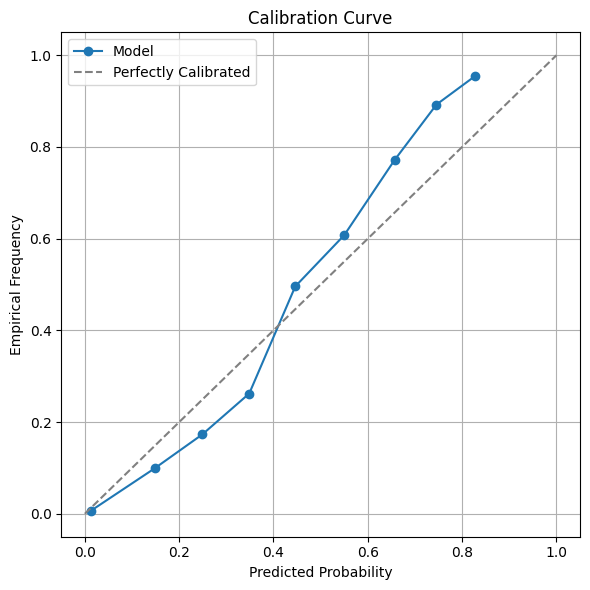

In [344]:
from sklearn.calibration import calibration_curve
from sklearn.metrics import (
    accuracy_score, roc_auc_score, brier_score_loss, 
    confusion_matrix, classification_report
)

model.eval()
with torch.no_grad():
    y_pred_probs = model(X_tensor).squeeze().numpy()
    y_true = y_tensor.numpy()

# Binary predictions
y_pred_class = (y_pred_probs >= 0.5).astype(int)

# Metrics
print(f"✅ Accuracy:      {accuracy_score(y_true, y_pred_class):.4f}")
print(f"✅ ROC AUC:       {roc_auc_score(y_true, y_pred_probs):.4f}")
print(f"✅ Brier Score:   {brier_score_loss(y_true, y_pred_probs):.6f}")
print("\n🔍 Classification Report:")
print(classification_report(y_true, y_pred_class))


prob_true, prob_pred = calibration_curve(y_true, y_pred_probs, n_bins=10)

plt.figure(figsize=(6, 6))
plt.plot(prob_pred, prob_true, marker='o', label="Model")
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label="Perfectly Calibrated")
plt.xlabel("Predicted Probability")
plt.ylabel("Empirical Frequency")
plt.title("Calibration Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# pbp_main_expanded["lstm_late_def_stop_prob"] = np.repeat(y_pred_probs, 1)  # Assuming 1 row per team-half


🔎 Base (Uncalibrated) Calibration Results:
  ✅ Brier Score: 0.071066
  ✅ ROC AUC:     0.9578
  ✅ Accuracy:    0.9071

🔎 Platt Scaling Calibration Results:
  ✅ Brier Score: 0.067719
  ✅ ROC AUC:     0.9578
  ✅ Accuracy:    0.9080

🔎 Isotonic Regression Calibration Results:
  ✅ Brier Score: 0.068843
  ✅ ROC AUC:     0.9558
  ✅ Accuracy:    0.9016



Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.
Glyph 128300 (\N{MICROSCOPE}) missing from font(s) DejaVu Sans.


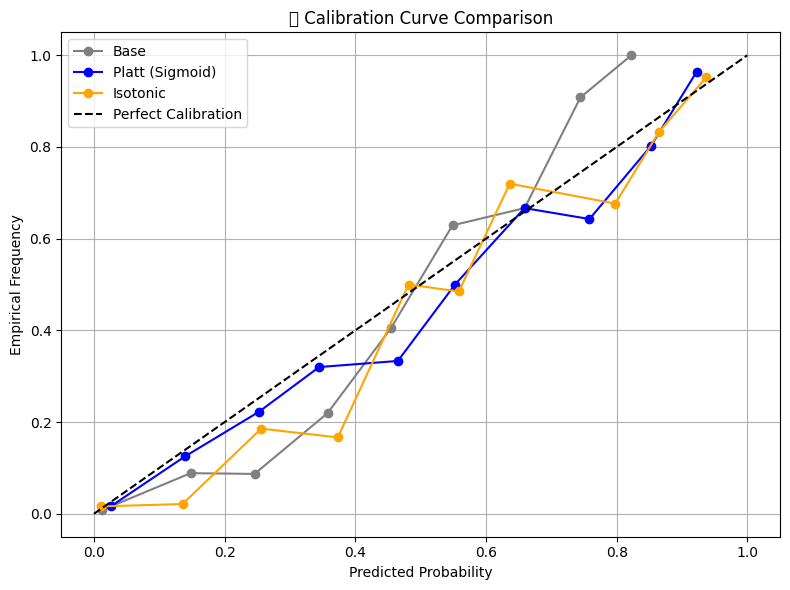

In [364]:
from sklearn.linear_model import LogisticRegression
from sklearn.isotonic import IsotonicRegression
from sklearn.model_selection import train_test_split
from sklearn.calibration import calibration_curve
from sklearn.metrics import (
    accuracy_score, roc_auc_score, brier_score_loss, classification_report
)
import matplotlib.pyplot as plt
import numpy as np

# ----------------------------------------
# Step 1: Split predicted probabilities
# ----------------------------------------
preds_train, preds_val, y_train, y_val = train_test_split(
    y_pred_probs, y_true, test_size=0.2, random_state=42
)

# ----------------------------------------
# Step 2: Fit Platt Scaling (Logistic Regression)
# ----------------------------------------
platt = LogisticRegression()
platt.fit(preds_train.reshape(-1, 1), y_train)
platt_probs = platt.predict_proba(preds_val.reshape(-1, 1))[:, 1]

# ----------------------------------------
# Step 3: Fit Isotonic Regression
# ----------------------------------------
iso = IsotonicRegression(out_of_bounds='clip')
iso.fit(preds_train, y_train)
iso_probs = iso.predict(preds_val)

# ----------------------------------------
# Step 4: Base Model Probs (Uncalibrated)
# ----------------------------------------
base_probs = preds_val

# ----------------------------------------
# Step 5: Metrics Comparison
# ----------------------------------------
def evaluate(name, y_true, y_probs):
    print(f"🔎 {name} Calibration Results:")
    print(f"  ✅ Brier Score: {brier_score_loss(y_true, y_probs):.6f}")
    print(f"  ✅ ROC AUC:     {roc_auc_score(y_true, y_probs):.4f}")
    print(f"  ✅ Accuracy:    {accuracy_score(y_true, (y_probs >= 0.5).astype(int)):.4f}")
    print("")

evaluate("Base (Uncalibrated)", y_val, base_probs)
evaluate("Platt Scaling", y_val, platt_probs)
evaluate("Isotonic Regression", y_val, iso_probs)

# ----------------------------------------
# Step 6: Plot Calibration Curves
# ----------------------------------------
plt.figure(figsize=(8, 6))

for probs, label, color in zip(
    [base_probs, platt_probs, iso_probs],
    ["Base", "Platt (Sigmoid)", "Isotonic"],
    ["gray", "blue", "orange"]
):
    frac_pos, mean_pred = calibration_curve(y_val, probs, n_bins=10)
    plt.plot(mean_pred, frac_pos, marker='o', label=label, color=color)

plt.plot([0, 1], [0, 1], linestyle='--', color='black', label='Perfect Calibration')
plt.xlabel("Predicted Probability")
plt.ylabel("Empirical Frequency")
plt.title("🔬 Calibration Curve Comparison")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [368]:
from sklearn.linear_model import LogisticRegression

# -----------------------------
# 1. Get uncalibrated predictions for calibration training
# -----------------------------
model.eval()
with torch.no_grad():
    raw_probs = model(X_tensor).squeeze().numpy()  # Shape: (n_samples,)
    true_labels = y_tensor.numpy()

# -----------------------------
# 2. Fit Platt scaling (sigmoid calibration)
# -----------------------------
platt_calibrator = LogisticRegression()
platt_calibrator.fit(raw_probs.reshape(-1, 1), true_labels)

# -----------------------------
# 3. Prepare pbp_second_half_plays input
# -----------------------------
pbp_df = pbp_second_half_plays

# Select and transform features
X_new_raw = pbp_df[all_raw_features].dropna()
X_new_transformed = preprocessor.transform(X_new_raw)

# Group into team-half and build sequences
pbp_df["team_half_id"] = pbp_df["game_id"].astype(str) + "_" + pbp_df["posteam"].astype(str)

sequences = []
team_ids = []

for team_half_id, group in pbp_df.groupby("team_half_id"):
    group_sorted = group.sort_values("game_seconds_remaining", ascending=False)
    if group_sorted[all_raw_features].isnull().any().any():
        continue  # Skip groups with missing values

    X_seq = preprocessor.transform(group_sorted[all_raw_features])

    if len(X_seq) < max_seq_len:
        pad = np.zeros((max_seq_len - len(X_seq), X_seq.shape[1]))
        X_padded = np.vstack([X_seq, pad])
    else:
        X_padded = X_seq[:max_seq_len]

    sequences.append(X_padded)
    team_ids.append(team_half_id)

# Stack and predict
X_seq_tensor = torch.tensor(np.stack(sequences), dtype=torch.float32)

with torch.no_grad():
    raw_preds = model(X_seq_tensor).squeeze().numpy()  # Uncalibrated LSTM predictions

# -----------------------------
# 4. Apply Platt calibration
# -----------------------------
calibrated_probs = platt_calibrator.predict_proba(raw_preds.reshape(-1, 1))[:, 1]

# -----------------------------
# 5. Map back to dataframe
# -----------------------------
team_half_to_prob = dict(zip(team_ids, calibrated_probs))
pbp_df["prob_late_game_stop_situation"] = pbp_df["team_half_id"].map(team_half_to_prob)


In [338]:
import sklearn
print(sklearn.__version__)

1.2.2


In [340]:
from sklearn.calibration import calibration_curve

# quick test
import numpy as np
y_true = np.array([0, 0, 1, 1])
y_prob = np.array([0.1, 0.4, 0.35, 0.8])
prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=4)

print(prob_true, prob_pred)

[0.  0.5 1. ] [0.1   0.375 0.8  ]


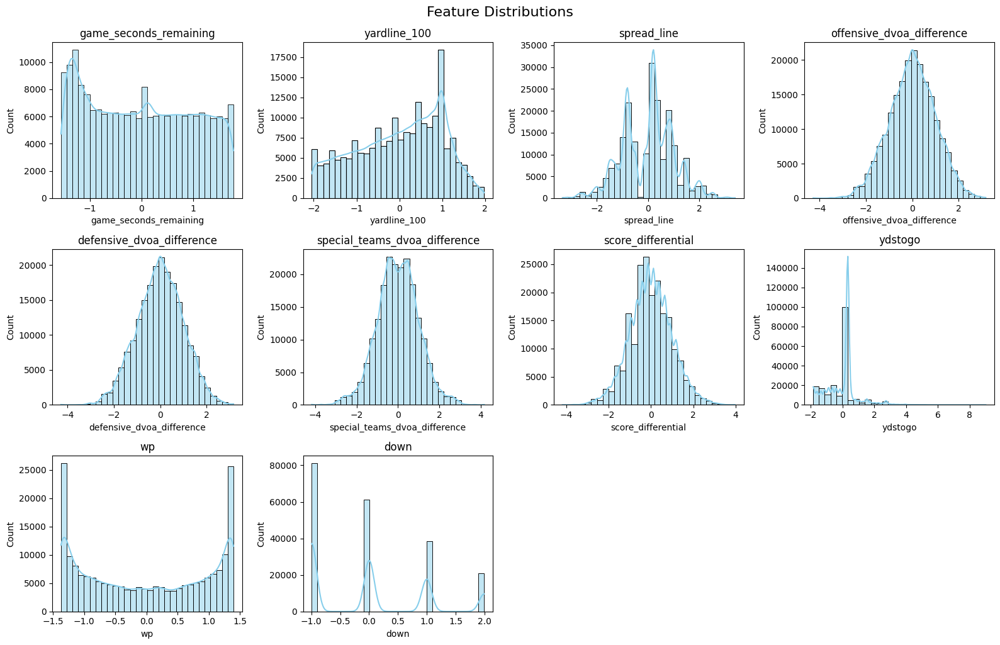

In [314]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of your features
feature_cols = [
    "game_seconds_remaining",
    "yardline_100",
    "spread_line",
    "offensive_dvoa_difference",
    "defensive_dvoa_difference",
    "special_teams_dvoa_difference",
    "score_differential",
    "ydstogo",
    "wp",
    "down"
]

# Set up the plot grid: 3 rows, 4 columns
n_features = len(feature_cols)
n_cols = 4
n_rows = (n_features + n_cols - 1) // n_cols

plt.figure(figsize=(16, 10))  # Adjust for screen size

for i, col in enumerate(feature_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(pbp_second_half_plays[col], kde=True, bins=30, color='skyblue', edgecolor='black')
    plt.title(col)
    plt.tight_layout()

plt.suptitle("Feature Distributions", fontsize=16, y=1.02)
plt.show()


In [246]:
pbp_main_expanded.head(10)

,game_id,posteam,defteam,away_team,home_team,qtr,game_seconds_remaining,time,score_differential,posteam_timeouts_remaining,defteam_timeouts_remaining,away_timeouts_remaining,home_timeouts_remaining,timeout,timeout_team,wp,def_wp,wpa,home_wp_post,away_wp_post,spread_line,drive,series,yrdln,yardline_100,down,ydstogo,play_type,yards_gained,rush_attempt,pass_attempt,own_kickoff_recovery,temp,wind,first_down,series_result,fg_prob,td_prob,total_home_epa,total_away_epa,series_start_seconds_remaining,drive_late_def_stop,game_late_def_stop,team_with_late_def_stop,late_def_teams_in_game,team_will_later_have_a_def_stop,year,posteam_offensive_dvoa,posteam_offensive_rank,defteam_offensive_dvoa,defteam_offensive_rank,defteam_defensive_dvoa,defteam_defensive_rank,posteam_defensive_dvoa,posteam_defensive_rank,defteam_total_dvoa,defteam_total_rank,posteam_total_dvoa,posteam_total_rank,defteam_special_teams_dvoa,defteam_special_teams_rank,posteam_special_teams_dvoa,posteam_special_teams_rank,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,defteam_home_status,drive_beginning_def_wp,drive_end_def_wp,drive_beginning_def_to,drive_end_def_to,redzone,offteam_home_status,prob_late_def_stop,prob_late_game_stop_pred,expected_timeout_value_3_to_2,penalty_wp_loss_pred,marg_timeout_value_3_to_2,late_stop_3TO_v_penalty
88,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1800.0,15:00,6.0,3.0,3.0,3.0,3.0,0.0,None,0.745837,0.254163,-0.012221,0.733616,0.266384,4.5,12.0,24.0,DEN 20,80.0,1.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.227784,0.352274,5.607522,-5.607522,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0,0.263019,0.154734,0.027156,-0.013483,0.004202,-0.009281
89,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1797.0,14:57,6.0,3.0,3.0,3.0,3.0,0.0,None,0.733616,0.266384,-0.021758,0.711858,0.288142,4.5,12.0,24.0,DEN 20,80.0,2.0,10.0,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Opp touchdown,0.205863,0.315427,4.920987,-4.920987,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0,0.265961,0.163109,0.028383,-0.012856,0.004629,-0.008227
90,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1753.0,14:13,6.0,3.0,3.0,3.0,3.0,0.0,None,0.711858,0.288142,-0.171003,0.540856,0.459144,4.5,12.0,24.0,DEN 20,80.0,3.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.186743,0.274310,-1.760423,1.760423,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.254163,0.288142,3.0,3.0,0,1.0,0.275428,0.179059,0.027243,-0.015843,0.004878,-0.010965
93,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1744.0,14:04,-1.0,3.0,3.0,3.0,3.0,0.0,None,0.535099,0.464901,-0.014326,0.520773,0.479227,4.5,13.0,25.0,DEN 20,80.0,1.0,10.0,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Punt,0.232499,0.351124,-2.333716,2.333716,1744.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.464901,0.531315,3.0,3.0,0,1.0,0.380579,0.342725,0.028639,-0.019069,0.009815,-0.009254
94,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1700.0,13:20,-1.0,3.0,3.0,3.0,3.0,0.0,None,0.520773,0.479227,-0.034656,0.486117,0.513883,4.5,13.0,25.0,DEN 20,80.0,2.0,10.0,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Punt,0.214879,0.321620,-3.100584,3.100584,1744.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.032316,-0.244794,-0.066243,0.210866,0.0,0.464901,0.531315,3.0,3.0,0,1.0,0.385628,0.342725,0.028240,-0.014484,0.009679,-0.004805
95,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1695.0,1

In [266]:
temp_table = pbp_main_expanded.groupby('game_id').agg({'game_late_def_stop':'max'})
temp_table.reset_index(inplace = True)
temp_table.groupby('game_late_def_stop').agg({'game_id':'count'})

,game_id
game_late_def_stop,
0.0,1477
1.0,1266


In [ ]:
#PREDICTED WP MODELING

In [164]:
#DF LATE STOP GAMES: Starting Late Game WP Model Main Table Cleaning / Transformation


df_late_stop_games = pbp_main_expanded.query('game_late_def_stop == 1 & team_will_later_have_a_def_stop == 1')
df_late_stop_games.head(10)

#Merge in  win probability at the start of the late game defensive stop for each team

condensed_stop_drives = all_stop_drives[['game_id','defteam','drive_beginning_def_wp','drive_start_time']]
condensed_stop_drives = condensed_stop_drives.groupby(['game_id', 'defteam']).first().reset_index()
condensed_stop_drives.rename(columns={'drive_beginning_def_wp': 'late_game_stop_drive_starting_wp','defteam':'posteam'}, inplace=True)
df_late_stop_games = df_late_stop_games.merge(condensed_stop_drives, how = 'left', on = ['game_id','posteam'])
df_late_stop_games = df_late_stop_games.dropna(subset=["late_game_stop_drive_starting_wp"])

df_late_stop_games.head(10)


#PROBLEM CHILDREN: 2018_06_BUF_HOU, 2019_17_OAK_DEN, 2020_09_CAR_KC

,game_id,posteam,defteam,away_team,home_team,qtr,game_seconds_remaining,time,score_differential,posteam_timeouts_remaining,defteam_timeouts_remaining,away_timeouts_remaining,home_timeouts_remaining,timeout,timeout_team,wp,def_wp,wpa,home_wp_post,away_wp_post,spread_line,drive,series,yrdln,yardline_100,down,ydstogo,play_type,yards_gained,rush_attempt,pass_attempt,own_kickoff_recovery,temp,wind,first_down,series_result,fg_prob,td_prob,total_home_epa,total_away_epa,series_start_seconds_remaining,drive_late_def_stop,game_late_def_stop,team_with_late_def_stop,late_def_teams_in_game,team_will_later_have_a_def_stop,year,posteam_offensive_dvoa,posteam_offensive_rank,defteam_offensive_dvoa,defteam_offensive_rank,defteam_defensive_dvoa,defteam_defensive_rank,posteam_defensive_dvoa,posteam_defensive_rank,defteam_total_dvoa,defteam_total_rank,posteam_total_dvoa,posteam_total_rank,defteam_special_teams_dvoa,defteam_special_teams_rank,posteam_special_teams_dvoa,posteam_special_teams_rank,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,defteam_home_status,drive_beginning_def_wp,drive_end_def_wp,drive_beginning_def_to,drive_end_def_to,redzone,offteam_home_status,prob_late_def_stop,late_game_stop_drive_starting_wp,drive_start_time
0,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1644.0,12:24,1.0,3.0,3.0,3.0,3.0,0.0,None,0.564145,0.435855,0.050003,0.385852,0.614148,4.5,14.0,26.0,BAL 40,60.0,1.0,10.0,pass,9.0,0.0,1.0,0.0,88.0,13.0,0.0,First down,0.283882,0.376545,-5.398479,5.398479,1644.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.066243,-0.210866,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.430062,0.012132,28.0
1,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1622.0,12:02,1.0,3.0,3.0,3.0,3.0,0.0,None,0.614148,0.385852,-0.003686,0.389539,0.610461,4.5,14.0,26.0,BAL 49,51.0,2.0,1.0,run,1.0,1.0,0.0,0.0,88.0,13.0,1.0,First down,0.320902,0.419954,-5.307658,5.307658,1644.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.066243,-0.210866,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.359049,0.012132,28.0
2,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1598.0,11:38,1.0,3.0,3.0,3.0,3.0,0.0,None,0.610461,0.389539,-0.030015,0.419554,0.580446,4.5,14.0,27.0,MID 50,50.0,1.0,10.0,run,-1.0,1.0,0.0,0.0,88.0,13.0,0.0,First down,0.320112,0.414440,-4.522444,4.522444,1598.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.066243,-0.210866,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.372175,0.012132,28.0
3,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1563.0,11:03,1.0,3.0,3.0,3.0,3.0,0.0,None,0.580446,0.419554,0.059539,0.360015,0.639985,4.5,14.0,27.0,BAL 49,51.0,2.0,11.0,pass,22.0,0.0,1.0,0.0,88.0,13.0,1.0,First down,0.305527,0.360738,-6.749398,6.749398,1598.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.066243,-0.210866,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.400049,0.012132,28.0
4,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1540.0,10:40,1.0,3.0,3.0,3.0,3.0,0.0,None,0.639985,0.360015,-0.014460,0.374475,0.625525,4.5,14.0,28.0,DEN 29,29.0,1.0,10.0,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Field goal,0.415055,0.467831,-6.352983,6.352983,1540.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,23.0,-0.218133,1.0,0.086349,22.0,0.171169,8.0,-0.039697,18.0,0.00707,14.0,0.073313,1.0,-0.244794,0.032316,0.066243,-0.210866,1.0,0.435855,0.437435,3.0,3.0,0,0.0,0.364044,0.012132,28.0
5,2015_01_BAL_DEN,BAL,DEN,BAL,DEN,3.0,1520.0,10:20,1.0,3.0,3.0,3.0,3.0,0.0,None,0.625525,0.374475,-0.005242,0.379718,0.620282,4.5,14.0,28.0,DEN 29,29.0,2.0,10.0,pass,4.0,0.0,1.0,0.0,88.0,13.0,0.0,Field goal,0.456772,0.406883,-6.073161,6.073161,1540.0,0.0,1.0,0,[BAL],1,2015,-0.026661,20.0,-0.054033,

✅ R² Score: 0.7433


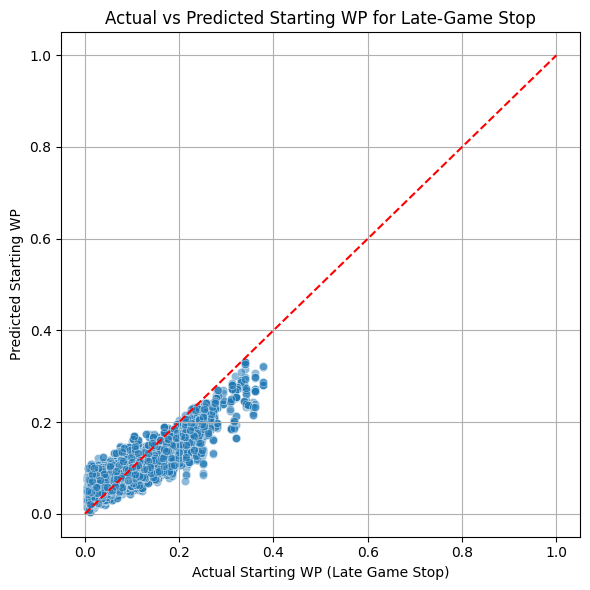

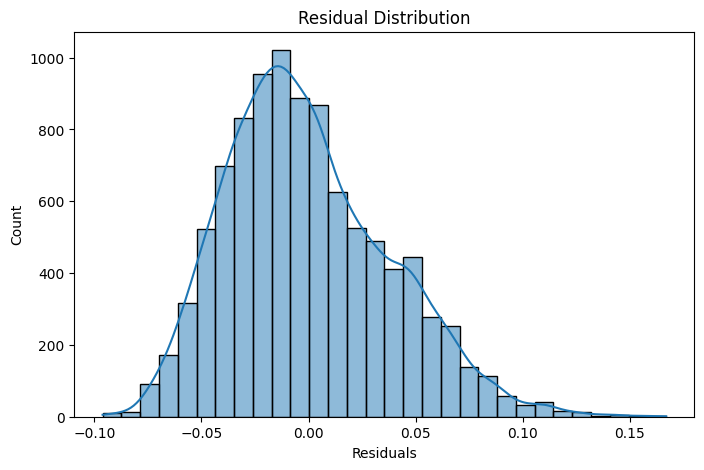

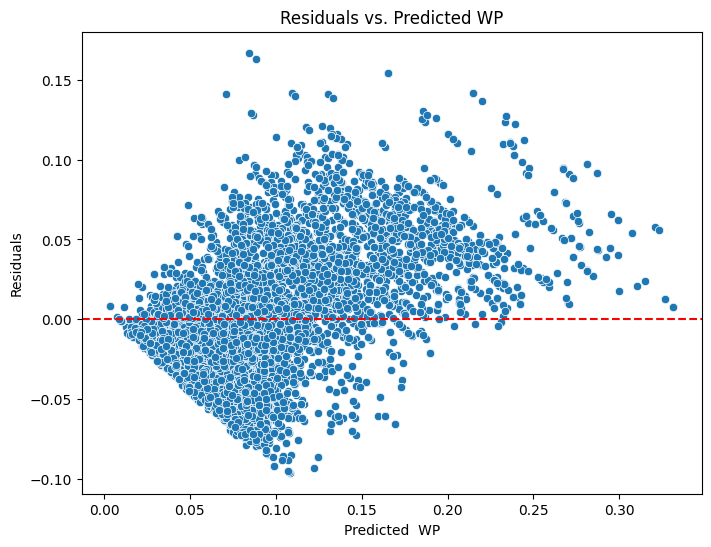

In [166]:
#Starting Late Game WP Gradient Boosted Model

df_late_stop_games['score_diff_x_wp'] = df_late_stop_games['score_differential'] * df_late_stop_games['wp']
df_late_stop_games['ydstogo_x_down'] = df_late_stop_games['ydstogo'] * df_late_stop_games['down']
# pbp_main_expanded['epa_per_play_difference'] = pbp_main_expanded['posteam_epa_per_play'] - pbp_main_expanded['defteam_epa_per_play']


# -------------------------------
# 1. Imports
# -------------------------------
from sklearn.experimental import enable_hist_gradient_boosting  # Needed for some older versions
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import pandas as pd
import numpy as np

# -------------------------------
# 2. Define features and target
# -------------------------------
features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp',
    'offensive_dvoa_difference',
    'defensive_dvoa_difference',
    'special_teams_dvoa_difference',
    # 'posteam_timeouts_remaining'
    # 'epa_per_play_difference',
    # 'total_home_epa',
    # 'total_away_epa'
    
    
]

X_wp_pred = df_late_stop_games[features].copy()
y_wp_pred = df_late_stop_games['late_game_stop_drive_starting_wp']

# One-hot encode down
X_wp_pred = pd.get_dummies(X_wp_pred, columns=['down'], drop_first=True)

# -------------------------------
# 3. Train/test split
# -------------------------------
X_train_wp, X_test_wp, y_train_wp, y_test_wp = train_test_split(X_wp_pred, y_wp_pred, test_size=0.2, random_state=42)

# -------------------------------
# 4. Train gradient boosted regression model
# -------------------------------
wp_model_columns = X_train_wp.columns.tolist()
wp_model = HistGradientBoostingRegressor(random_state=42)
wp_model.fit(X_train_wp, y_train_wp)

# -------------------------------
# 5. Evaluate model
# -------------------------------
y_pred_wp = wp_model.predict(X_test_wp)

r2 = r2_score(y_test_wp, y_pred_wp)
print(f"✅ R² Score: {r2:.4f}")

# -------------------------------
# 6. Optional: Visuals for assessment
# -------------------------------
import matplotlib.pyplot as plt
import seaborn as sns

# Actual vs. predicted
plt.figure(figsize=(6,6))
sns.scatterplot(x=y_test_wp, y=y_pred_wp, alpha=0.5)
plt.plot([0, 1], [0, 1], '--', color='red')
plt.xlabel("Actual Starting WP (Late Game Stop)")
plt.ylabel("Predicted Starting WP")
plt.title("Actual vs Predicted Starting WP for Late-Game Stop")
plt.grid(True)
plt.tight_layout()
plt.show()


residuals_logit = y_test_wp - y_pred_wp

plt.figure(figsize=(8,5))
sns.histplot(residuals_logit, kde=True, bins=30)
plt.xlabel("Residuals")
plt.title("Residual Distribution")
plt.show()

#Step #3: Graphing the distribution of residuals based on the predicted WP for the test sample -- check for homoscedacitity

plt.figure(figsize=(8,6))
sns.scatterplot(x=y_pred_wp, y=residuals_logit)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted  WP")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted WP")
plt.show()


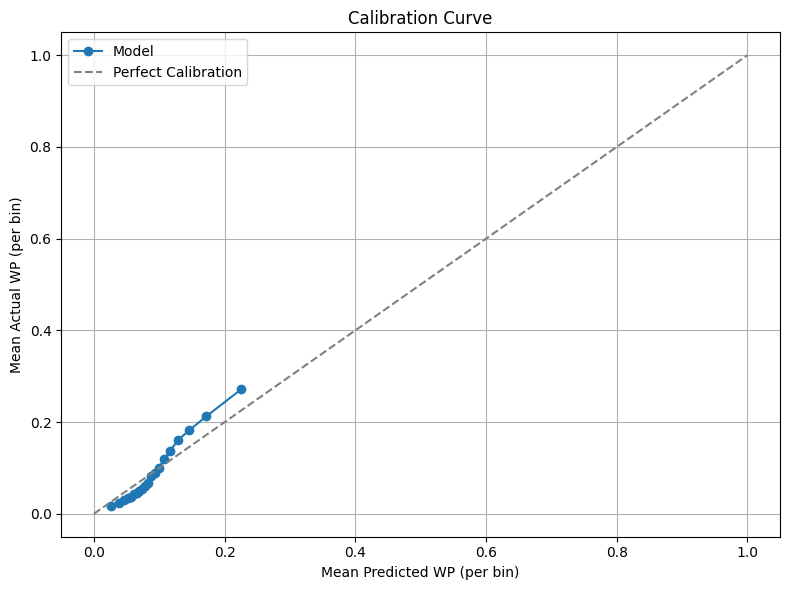

                  bin  mean_pred  mean_actual  count
0   (0.00238, 0.0341]   0.026805     0.016522    493
1    (0.0341, 0.0429]   0.038947     0.024356    492
2    (0.0429, 0.0491]   0.046196     0.029622    493
3    (0.0491, 0.0541]   0.051603     0.035272    493
4    (0.0541, 0.0588]   0.056509     0.037635    491
5    (0.0588, 0.0636]   0.061152     0.042450    493
6    (0.0636, 0.0676]   0.065683     0.045783    493
7    (0.0676, 0.0718]   0.069704     0.048825    492
8    (0.0718, 0.0762]   0.074018     0.054801    492
9    (0.0762, 0.0805]   0.078197     0.060637    492
10    (0.0805, 0.085]   0.082678     0.066794    492
11    (0.085, 0.0903]   0.087573     0.083286    493
12   (0.0903, 0.0958]   0.092950     0.088092    492
13    (0.0958, 0.103]   0.099497     0.099961    492
14     (0.103, 0.112]   0.107479     0.120216    494
15     (0.112, 0.123]   0.117004     0.137853    491
16     (0.123, 0.136]   0.129302     0.161927    493
17     (0.136, 0.157]   0.145559     0.181708 

In [168]:
#Calibration Curve

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Bin the predicted values into quantiles
cal_df = pd.DataFrame({
    "y_true": y_test_wp,
    "y_pred": y_pred_wp
})

cal_df["bin"] = pd.qcut(cal_df["y_pred"], q=20, duplicates="drop")

# Aggregate by bin
calibration_summary = cal_df.groupby("bin", observed=False).agg(
    mean_pred=("y_pred", "mean"),
    mean_actual=("y_true", "mean"),
    count=("y_true", "count")
).reset_index()

# Plot with matplotlib directly
plt.figure(figsize=(8, 6))
plt.plot(calibration_summary["mean_pred"], calibration_summary["mean_actual"], marker="o", label="Model")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Perfect Calibration")
plt.xlabel("Mean Predicted WP (per bin)")
plt.ylabel("Mean Actual WP (per bin)")
plt.title("Calibration Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

print(calibration_summary.head(100))


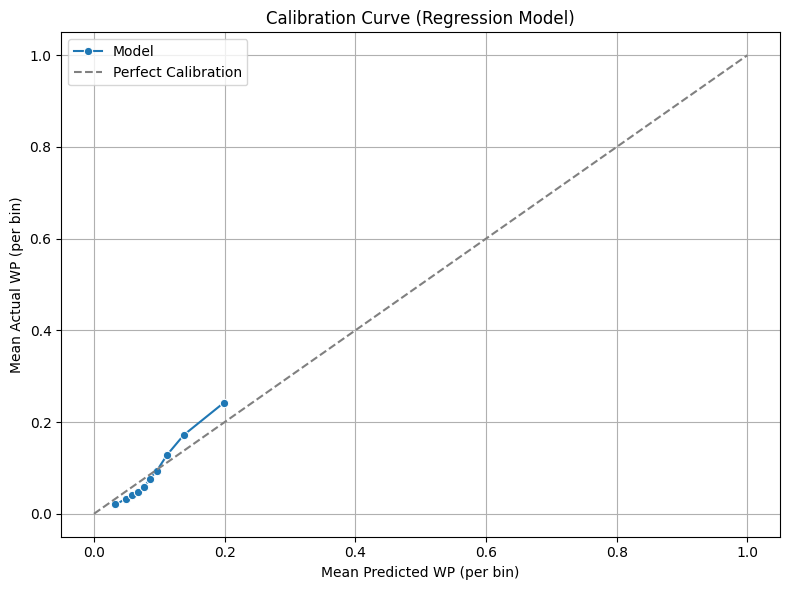


🔍 Calibration Bin Summary:
                 bin  mean_pred  mean_actual  count
0  (0.00238, 0.0429]   0.032870     0.020435    985
1   (0.0429, 0.0541]   0.048899     0.032447    986
2   (0.0541, 0.0636]   0.058835     0.040047    984
3   (0.0636, 0.0718]   0.067691     0.047302    985
4   (0.0718, 0.0805]   0.076108     0.057719    984
5   (0.0805, 0.0903]   0.085128     0.075049    985
6    (0.0903, 0.103]   0.096223     0.094026    984
7     (0.103, 0.123]   0.112227     0.129008    985
8     (0.123, 0.157]   0.137431     0.171818    986
9     (0.157, 0.331]   0.198585     0.241961    984
📉 Brier Score (MSE): 0.001445


In [170]:
#Calibrarion Curve Pt. 2

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create a DataFrame with predictions and actuals
df_cal = pd.DataFrame({
    "y_true": y_test_wp,
    "y_pred": y_pred_wp
})

# Bin predictions into equal-sized quantile bins
df_cal["bin"] = pd.qcut(df_cal["y_pred"], q=10, duplicates="drop")  # Handles tied values

# Group by bin and compute calibration stats
calibration_summary = df_cal.groupby("bin", observed=False).agg(
    mean_pred=("y_pred", "mean"),
    mean_actual=("y_true", "mean"),
    count=("y_true", "count")
).reset_index()

# Plot calibration curve
plt.figure(figsize=(8, 6))
sns.lineplot(data=calibration_summary, x="mean_pred", y="mean_actual", marker="o", label="Model")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Perfect Calibration")
plt.title("Calibration Curve (Regression Model)")
plt.xlabel("Mean Predicted WP (per bin)")
plt.ylabel("Mean Actual WP (per bin)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Optional: Print summary table
print("\n🔍 Calibration Bin Summary:")
print(calibration_summary)


from sklearn.metrics import mean_squared_error

brier = mean_squared_error(y_test_wp, y_pred_wp)
print(f"📉 Brier Score (MSE): {brier:.6f}")


In [ ]:
#5 YD PENALTY ANALYSIS

In [172]:
#PBP_PENALTIES: Penalties Main table cleaning / transformation


#------------------------------------------------------------------------------------------------------------------------------------------#

#Cut down table to only needed columns
pbp_penalties = pbp_py [['game_id','penalty','penalty_team','penalty_yards','penalty_type','wp','def_wp','wpa','posteam','defteam','away_team','home_team','qtr','game_seconds_remaining',
                    'time','score_differential','posteam_timeouts_remaining','defteam_timeouts_remaining', 
                    'away_timeouts_remaining','home_timeouts_remaining','timeout','timeout_team','home_wp_post','away_wp_post','spread_line','drive','series','yrdln','yardline_100',
                    'down','ydstogo','play_type','yards_gained','rush_attempt','pass_attempt','own_kickoff_recovery','temp','wind',
                    'first_down','series_result','goal_to_go','two_point_attempt']].copy()

#------------------------------------------------------------------------------------------------------------------------------------------#

#Fill all def_wp null values with 0 (because when the game is over, it is initally recorded as null instead of 0)
pbp_penalties['wp'] = pbp_penalties['wp'].fillna(0)
pbp_penalties['def_wp'] = pbp_penalties['def_wp'].fillna(0)
pbp_penalties['home_wp_post'] = pbp_penalties['home_wp_post'].fillna(0)
pbp_penalties['away_wp_post'] = pbp_penalties['away_wp_post'].fillna(0)

#------------------------------------------------------------------------------------------------------------------------------------------#

pbp_penalties['year'] = pbp_penalties['game_id'].str[0:4]
pbp_penalties['year'] = pbp_penalties['year'].astype(int)

#------------------------------------------------------------------------------------------------------------------------------------------#

#Merge in the DVOA numbers for the offense and defensive teams


    #Offensive DVOA

pbp_penalties = pbp_penalties.merge(
    dvoa_offense, 
    how='left', 
    left_on=['year', 'posteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_penalties.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)


    #Defensive DVOA

pbp_penalties = pbp_penalties.merge(
    dvoa_defense, 
    how='left', 
    left_on=['year', 'defteam'],  # Columns in salaries_by_season_2024
    right_on=['YEAR', 'TEAM (NOW)']  # Columns in safeties_2024
)

pbp_penalties.drop(columns=['YEAR', 'TEAM (NOW)'], inplace=True)


    #Create column: DVOA difference between the offense and defense

pbp_penalties['offensive_dvoa_difference'] = pbp_penalties['OFFENSE DVOA'] + pbp_penalties['DEFENSE DVOA']


#------------------------------------------------------------------------------------------------------------------------------------------

#Create column for offensive team home status

pbp_penalties['offteam_home_status'] = np.where(
    pbp_penalties['home_team'] == pbp_penalties['posteam'], 1, np.where(
        pbp_penalties['posteam'] == pbp_penalties['away_team'], 0,
        np.nan  # Leave the value as NaN if neither condition is met
    ))

#------------------------------------------------------------------------------------------------------------------------------------------


# Filter only for plays with penalties

pbp_penalties = pbp_penalties.query('penalty == 1')
pbp_penalties.reset_index(drop=True, inplace=True)


# Create new columns

    # Create column: Side of ball that committed the penalty
pbp_penalties['penalty_side_of_ball'] = np.where(
    pbp_penalties['penalty_team'] == pbp_penalties['posteam'],'Offensive',
    np.where(
        pbp_penalties['penalty_team'] == pbp_penalties['defteam'],
        'Defensive',
        np.nan  # Leave the value as NaN if neither condition is met
    )
)

    #Create column: Binary indicator of offensive presnap (liberal definition by including illegal shifts / motions / formations) penalties
pbp_penalties['offensive_presnap_penalty'] = np.where(
                        ((pbp_penalties['penalty_type'] == 'False Start') |
                        (pbp_penalties['penalty_type'] == 'Delay of Game') |
                        (pbp_penalties['penalty_type'] == 'Illegal Formation') |
                        (pbp_penalties['penalty_type'] == 'Illegal Motion') |
                        (pbp_penalties['penalty_type'] == 'Illegal Shift') |
                        (pbp_penalties['penalty_type'] == 'Illegal Substitution') |
                        (pbp_penalties['penalty_type'] == 'Offensive Too Many Men on Field')), 1, 0)


    #Creat column: Binary indicator if offense is in the redzone

pbp_penalties['redzone'] = np.where(pbp_penalties['yardline_100']<=20, 1,0)


#------------------------------------------------------------------------------------------------------------------------------------------


# Filter only for plays with 5-yard offensive penalties

pbp_5yd_penalties_offense = pbp_penalties[
                                (pbp_penalties['penalty_side_of_ball'] == "Offensive") &
                                (pbp_penalties['penalty_yards'] == 5) &
                                (pbp_penalties['offensive_presnap_penalty'] == 1)
].copy()

# Drop the penalties with null values for the wpa or down columns (usually penalties on point after tries)

pbp_5yd_penalties_offense = pbp_5yd_penalties_offense.dropna(subset=["wpa", "down"])

#------------------------------------------------------------------------------------------------------------------------------------------

# Display the dataframe

pbp_5yd_penalties_offense.query('game_id == "2023_16_DET_MIN"').head(100)

,game_id,penalty,penalty_team,penalty_yards,penalty_type,wp,def_wp,wpa,posteam,defteam,away_team,home_team,qtr,game_seconds_remaining,time,score_differential,posteam_timeouts_remaining,defteam_timeouts_remaining,away_timeouts_remaining,home_timeouts_remaining,timeout,timeout_team,home_wp_post,away_wp_post,spread_line,drive,series,yrdln,yardline_100,down,ydstogo,play_type,yards_gained,rush_attempt,pass_attempt,own_kickoff_recovery,temp,wind,first_down,series_result,goal_to_go,two_point_attempt,year,OFFENSE DVOA,OFFENSE RANK,DEFENSE DVOA,DEFENSE RANK,offensive_dvoa_difference,offteam_home_status,penalty_side_of_ball,offensive_presnap_penalty,redzone
30067,2023_16_DET_MIN,1.0,DET,5.0,Delay of Game,0.427753,0.572247,-0.006162,DET,MIN,DET,MIN,2.0,2378.0,09:38,0.0,3.0,3.0,3.0,3.0,0.0,None,0.578408,0.421592,-2.5,7.0,19.0,DET 39,61.0,2.0,21.0,no_play,0.0,0.0,0.0,0.0,NaN,NaN,0.0,First down,0,0.0,2023,0.137801,5.0,-0.038904,11.0,0.098897,0.0,Offensive,1,0
30071,2023_16_DET_MIN,1.0,MIN,5.0,False Start,0.456834,0.543166,-0.026379,MIN,DET,DET,MIN,2.0,2040.0,04:00,-3.0,3.0,2.0,2.0,3.0,0.0,None,0.430455,0.569545,-2.5,8.0,24.0,MIN 13,87.0,2.0,12.0,no_play,0.0,0.0,0.0,0.0,NaN,NaN,0.0,Turnover,0,0.0,2023,-0.079248,23.0,-0.032198,13.0,-0.111446,1.0,Offensive,1,0
30074,2023_16_DET_MIN,1.0,DET,5.0,Delay of Game,0.403068,0.596932,-0.047411,DET,MIN,DET,MIN,3.0,1474.0,09:34,-4.0,3.0,3.0,3.0,3.0,0.0,None,0.644343,0.355656,-2.5,13.0,37.0,MIN 36,36.0,3.0,3.0,no_play,0.0,0.0,0.0,0.0,NaN,NaN,0.0,First down,0,0.0,2023,0.137801,5.0,-0.038904,11.0,0.098897,0.0,Offensive,1,0
30076,2023_16_DET_MIN,1.0,MIN,5.0,Offensive Too Many Men on Field,0.102540,0.897460,-0.012299,MIN,DET,DET,MIN,4.0,412.0,06:52,-9.0,3.0,3.0,3.0,3.0,0.0,None,0.090242,0.909758,-2.5,18.0,50.0,MIN 30,70.0,2.0,10.0,no_play,0.0,0.0,0.0,0.0,NaN,NaN,0.0,First down,0,0.0,2023,-0.079248,23.0,-0.032198,13.0,-0.111446,1.0,Offensive,1,0
30079,2023_16_DET_MIN,1.0,DET,5.0,False Start,0.904182,0.095818,-0.016463,DET,MIN,DET,MIN,4.0,252.0,04:12,6.0,3.0,0.0,3.0,0.0,0.0,None,0.000000,0.000000,-2.5,19.0,55.0,DET 47,53.0,2.0,7.0,no_play,0.0,0.0,0.0,0.0,NaN,NaN,0.0,Punt,0,0.0,2023,0.137801,5.0,-0.038904,11.0,0.098897,0.0,Offensive,1,0
30080,2023_16_DET_MIN,1.0,DET,5.0,Delay of Game,0.887719,0.112281,-0.004667,DET,MIN,DET,MIN,4.0,252.0,04:12,6.0,3.0,0.0,3.0,0.0,0.0,None,0.112281,0.887719,-2.5,19.0,55.0,DET 42,58.0,2.0,12.0,no_play,0.0,0.0,0.0,0.0,NaN,NaN,0.0,Punt,0,0.0,2023,0.137801,5.0,-0.038904,11.0,0.098897,0.0,Offensive,1,0
30081,2023_16_DET_MIN,1.0,DET,5.0,Illegal Formation,0.840074,0.159926,0.024860,DET,MIN,DET,MIN,4.0,170.0,02:50,6.0,2.0,0.0,2.0,0.0,0.0,None,0.135066,0.864934,-2.5,19.0,55.0,DET 41,59.0,4.0,13.0,no_play,0.0,0.0,0.0,0.0,NaN,NaN,0.0,Punt,0,0.0,2023,0.137801,5.0,-0.038904,11.0,0.098897,0.0,Offensive,1,0


In [174]:
#Filter table for only second half penalties

pbp_5yd_penalties_off_H2 = pbp_5yd_penalties_offense[
                                (pbp_5yd_penalties_offense['qtr'] == 3) |
                                (pbp_5yd_penalties_offense['qtr'] == 4)
].copy()

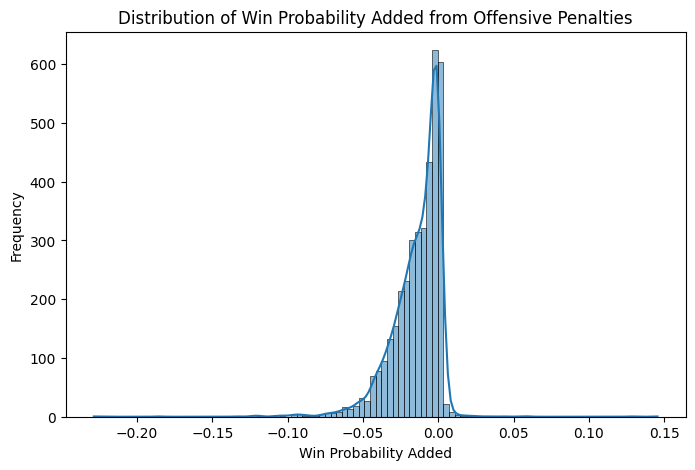

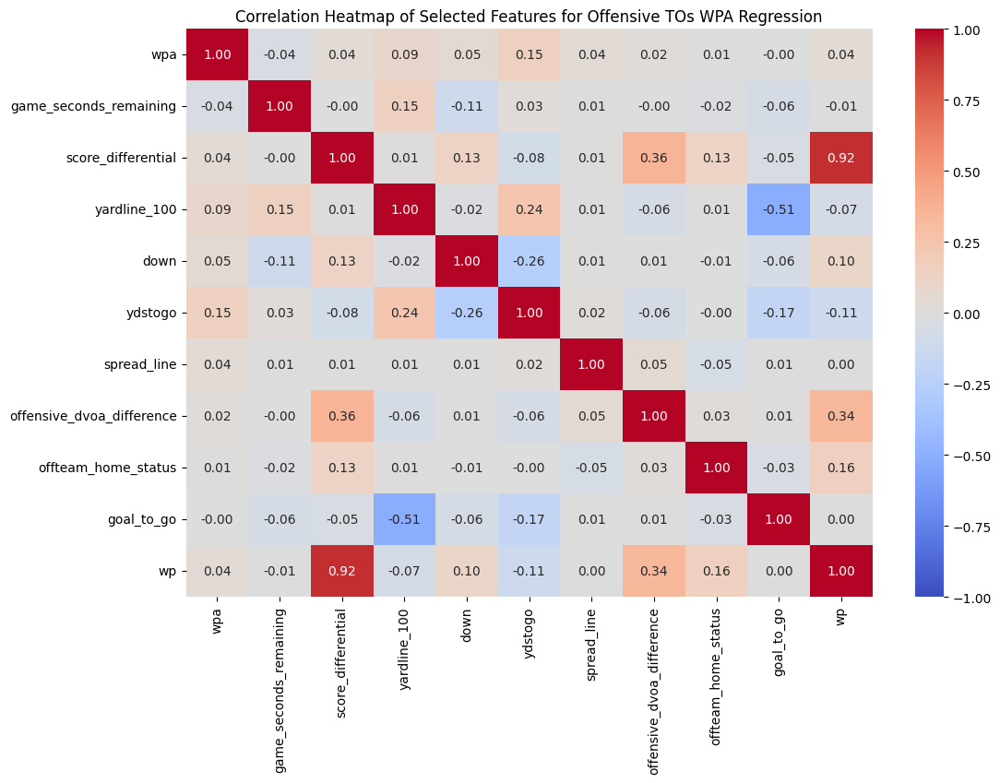

In [176]:
#Exploratory data analysis: Explore data to determine independent variables and best regression to start with

#Exploring the distribution of WP

#Distribution of WP at Drive Start

plt.figure(figsize=(8, 5))
sns.histplot(pbp_5yd_penalties_off_H2["wpa"], bins=100, kde=True)
plt.xlabel("Win Probability Added")
plt.ylabel("Frequency")
plt.title("Distribution of Win Probability Added from Offensive Penalties")
plt.show()

#Correlation Heatmap

selected_vars = [
                'wpa',
                'game_seconds_remaining',
                'score_differential',
                'yardline_100', 
                'down',
                'ydstogo',
                'spread_line', 
                'offensive_dvoa_difference', 
                'offteam_home_status',
                'goal_to_go',
                'wp'
]

# Compute correlation matrix for only these variables
corr_matrix =pbp_5yd_penalties_off_H2[selected_vars].corr()

# Create heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Heatmap of Selected Features for Offensive TOs WPA Regression")
plt.show()






In [178]:
#VIF Test


# Select the relevant features for VIF calculation
features = [    
                'game_seconds_remaining',
                'score_differential',
                'yardline_100', 
                'down',
                'ydstogo',
                'spread_line', 
                'offensive_dvoa_difference', 
                'offteam_home_status',
                'goal_to_go',
                'wp'
]



# Ensure there are no missing values
pbp_5yd_penalties_off_H2_vif = pbp_5yd_penalties_off_H2[features].dropna()

# Add a constant for the intercept
pbp_5yd_penalties_off_H2_vif = add_constant(pbp_5yd_penalties_off_H2_vif)

# Compute VIF for each feature
pbp_5yd_penalties_off_H2_vif_data = pd.DataFrame()
pbp_5yd_penalties_off_H2_vif_data["Feature"] = pbp_5yd_penalties_off_H2_vif.columns
pbp_5yd_penalties_off_H2_vif_data["VIF"] = [variance_inflation_factor(pbp_5yd_penalties_off_H2_vif.values, i) for i in range(pbp_5yd_penalties_off_H2_vif.shape[1])]

# Display the VIF results
print(pbp_5yd_penalties_off_H2_vif_data)

                      Feature        VIF
0                       const  41.380027
1      game_seconds_remaining   1.036266
2          score_differential   7.088081
3                yardline_100   1.477287
4                        down   1.117168
5                     ydstogo   1.160455
6                 spread_line   1.006211
7   offensive_dvoa_difference   1.156587
8         offteam_home_status   1.034689
9                  goal_to_go   1.382483
10                         wp   7.046001


In [180]:
#Timeout Linear Regression Model

import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns


# Use a clear dataset name
df_penalty = pbp_5yd_penalties_off_H2

# Define independent (X) and dependent (y) variables
X_penalty = df_penalty[[                
    'game_seconds_remaining',
    'score_differential',
    'yardline_100', 
    'down',
    'ydstogo',
    'spread_line', 
    # 'offensive_dvoa_difference',      # Optional: uncomment if needed
    # 'offteam_home_status',  # Optional: uncomment if needed
    'goal_to_go',
    'wp'
]]

y_penalty = df_penalty['wpa']

# Add constant (intercept)
X_penalty = sm.add_constant(X_penalty)

# Split into train and test sets
X_penalty_train, X_penalty_test, y_penalty_train, y_penalty_test = train_test_split(
    X_penalty, y_penalty, test_size=0.2, random_state=42
)

# Fit the model
model_penalty_ols = sm.OLS(y_penalty_train, X_penalty_train).fit()

# Print results
print(model_penalty_ols.summary())

# Predict on test set
y_penalty_pred = model_penalty_ols.predict(X_penalty_test)

# Evaluate performance
r2_penalty = r2_score(y_penalty_test, y_penalty_pred)
rmse_penalty = mean_squared_error(y_penalty_test, y_penalty_pred, squared=False)

print(f"\nPenalty WPA Model Performance:\nR² Score: {r2_penalty:.4f}\nRMSE: {rmse_penalty:.6f}")


                            OLS Regression Results                            
Dep. Variable:                    wpa   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.048
Method:                 Least Squares   F-statistic:                     19.87
Date:                Sun, 30 Mar 2025   Prob (F-statistic):           1.71e-29
Time:                        22:58:43   Log-Likelihood:                 8142.7
No. Observations:                3018   AIC:                        -1.627e+04
Df Residuals:                    3009   BIC:                        -1.621e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

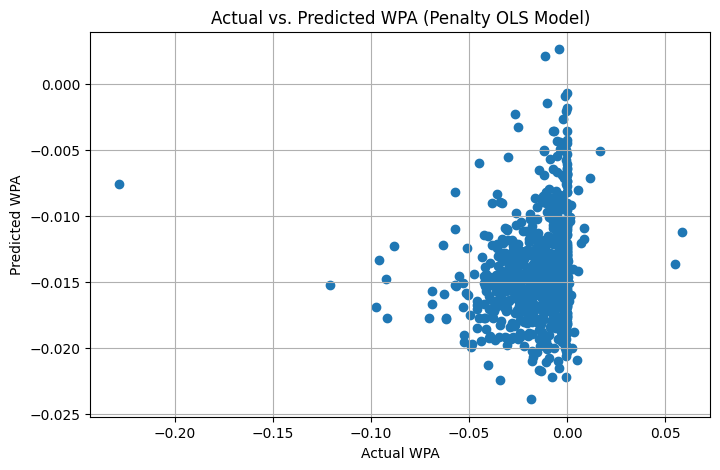

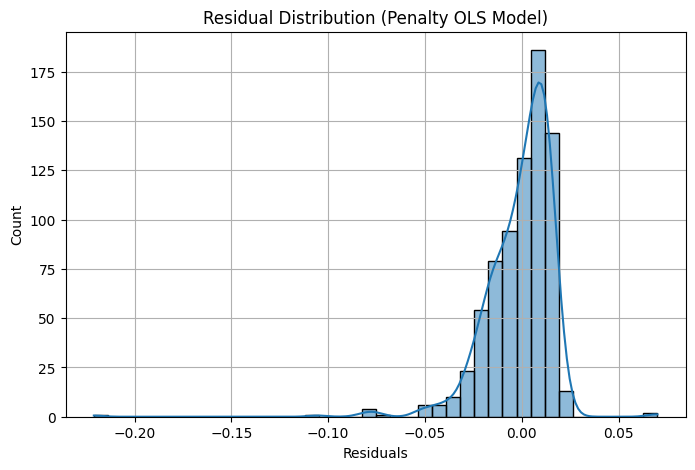

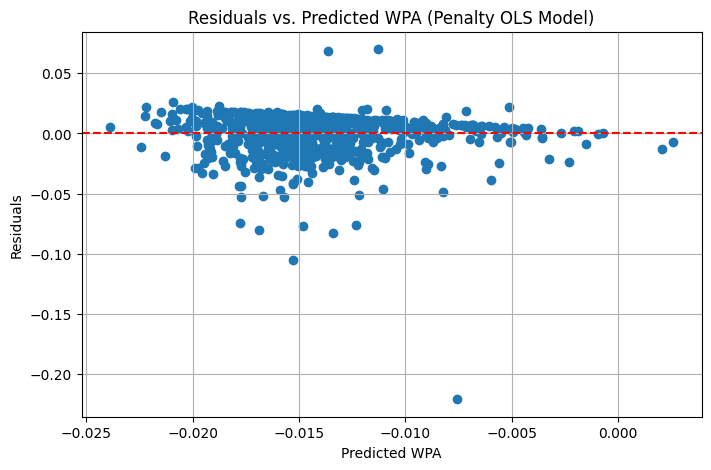

In [182]:
#Timeout Linear Regression Model Assessment Graphs


import matplotlib.pyplot as plt
import seaborn as sns

# Residuals
residuals_penalty = y_penalty_test - y_penalty_pred

# Plot actual vs predicted
plt.figure(figsize=(8, 5))
plt.scatter(y_penalty_test, y_penalty_pred)
plt.xlabel("Actual WPA")
plt.ylabel("Predicted WPA")
plt.title("Actual vs. Predicted WPA (Penalty OLS Model)")
plt.grid(True)
plt.show()

# Residual distribution
plt.figure(figsize=(8, 5))
sns.histplot(residuals_penalty, bins=40, kde=True)
plt.title("Residual Distribution (Penalty OLS Model)")
plt.xlabel("Residuals")
plt.ylabel("Count")
plt.grid(True)
plt.show()

# Residuals vs. predicted
plt.figure(figsize=(8, 5))
plt.scatter(y_penalty_pred, residuals_penalty)
plt.axhline(0, color="red", linestyle="--")
plt.xlabel("Predicted WPA")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted WPA (Penalty OLS Model)")
plt.grid(True)
plt.show()


In [184]:
#Timeout Gradient Boosted Model -- Pre-Logit Adjustment


from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split


# Define independent (X) and dependent (y) variables
X_penalty = df_penalty[[                
    'game_seconds_remaining',
    'score_differential',
    'yardline_100', 
    'down',
    'ydstogo',
    'spread_line', 
    'offensive_dvoa_difference',      
    'offteam_home_status',  
    'redzone',
    'wp'
]]

y_penalty = df_penalty['wpa']

# Add constant (intercept)
X_penalty = sm.add_constant(X_penalty)

# Split into train and test sets
X_penalty_train, X_penalty_test, y_penalty_train, y_penalty_test = train_test_split(
    X_penalty, y_penalty, test_size=0.2, random_state=42
)

# Initialize the Gradient Boosting Regressor
gbr_penalty = GradientBoostingRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=4,
    random_state=42
)

# Fit the model
gbr_penalty.fit(X_penalty_train, y_penalty_train)

# Predict on test set
y_penalty_pred_gbr = gbr_penalty.predict(X_penalty_test)

# Evaluate model performance
r2_gbr = r2_score(y_penalty_test, y_penalty_pred_gbr)
rmse_gbr = mean_squared_error(y_penalty_test, y_penalty_pred_gbr, squared=False)

print(f"\nGradient Boosting WPA Model Performance:\nR² Score: {r2_gbr:.4f}\nRMSE: {rmse_gbr:.6f}")



Gradient Boosting WPA Model Performance:
R² Score: 0.5630
RMSE: 0.012213


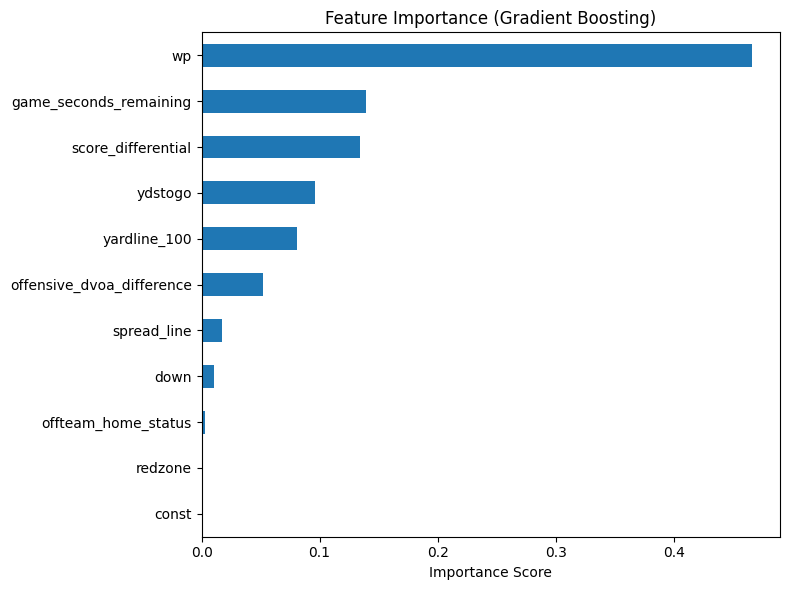

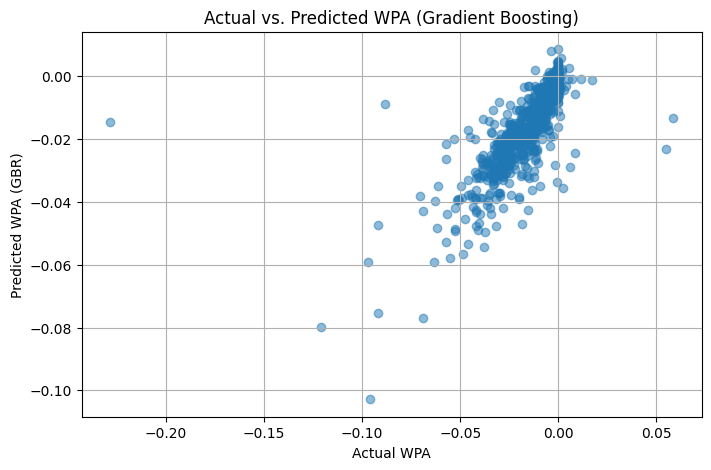

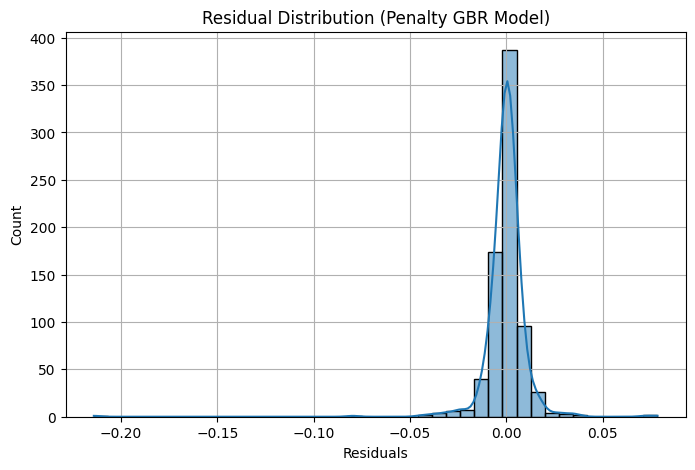

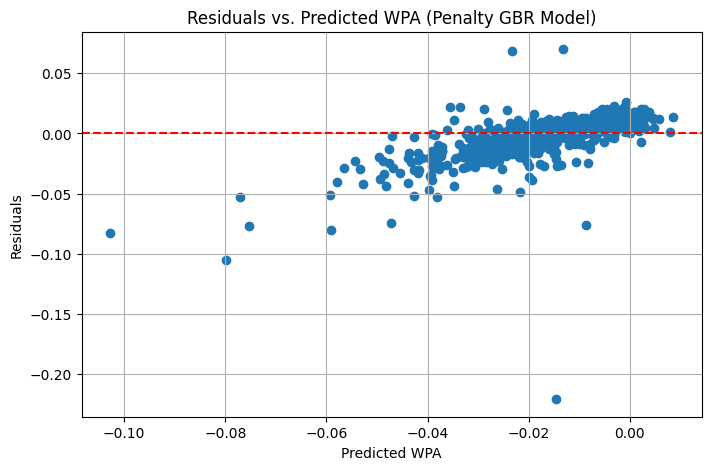

In [186]:
#Assessment Graphs for Timeout Gradient Boosted Model -- Pre-Logit Adjustment

import matplotlib.pyplot as plt
import pandas as pd


# Feature importances for the model
feature_importance = pd.Series(gbr_penalty.feature_importances_, index=X_penalty.columns)
feature_importance.sort_values().plot(kind='barh', figsize=(8, 6))
plt.title("Feature Importance (Gradient Boosting)")
plt.xlabel("Importance Score")
plt.tight_layout()
plt.show()


# Actuals v. Predicted for Testing Set

plt.figure(figsize=(8, 5))
plt.scatter(y_penalty_test, y_penalty_pred_gbr, alpha=0.5)
plt.xlabel("Actual WPA")
plt.ylabel("Predicted WPA (GBR)")
plt.title("Actual vs. Predicted WPA (Gradient Boosting)")
plt.grid(True)
plt.show()


# Residual distribution

residuals_penalty_gbr = y_penalty_test - y_penalty_pred_gbr


plt.figure(figsize=(8, 5))
sns.histplot(residuals_penalty_gbr, bins=40, kde=True)
plt.title("Residual Distribution (Penalty GBR Model)")
plt.xlabel("Residuals")
plt.ylabel("Count")
plt.grid(True)
plt.show()

# Residuals vs. predicted

plt.figure(figsize=(8, 5))
plt.scatter(y_penalty_pred_gbr, residuals_penalty)
plt.axhline(0, color="red", linestyle="--")
plt.xlabel("Predicted WPA")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted WPA (Penalty GBR Model)")
plt.grid(True)
plt.show()



In [188]:
#Timeout Gradient Boosted Model -- Post-Logit Adjustment


import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor

# Define independent (X) and dependent (y) variables

    #X Variables

X_penalty = df_penalty[[                
    'game_seconds_remaining',
    'score_differential',
    'yardline_100', 
    'down',
    'ydstogo',
    'spread_line', 
    'offensive_dvoa_difference',      
    'offteam_home_status',  
    'redzone',
    'wp'
]]

    # Add constant (intercept)

X_penalty = sm.add_constant(X_penalty)

    #Y Variable

y_penalty = df_penalty['wpa']

#Define transformation for y-variable

def log_modulus(x):
    return np.sign(x) * np.log1p(np.abs(x))

def inv_log_modulus(x):
    return np.sign(x) * (np.expm1(np.abs(x)))

# Apply transformation to WPA (dependent variable) using log-modulus

y_penalty_transformed = log_modulus(y_penalty)

#Split dataset into testing and training subsets (80% train, 20% test)

X_penalty_train, X_penalty_test, y_penalty_train_t, y_penalty_test_t = train_test_split(
    X_penalty, y_penalty_transformed, test_size=0.2, random_state=42
)

# Initialize the Gradient Boosting Regressor (GBR)

gbr_transformed = GradientBoostingRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=4,
    random_state=42
)

# Fit the model

gbr_transformed.fit(X_penalty_train, y_penalty_train_t)

# Predict on test set (transformed scale)

y_penalty_pred_logmod = gbr_transformed.predict(X_penalty_test)

# Inverse-transform predictions back to WPA scale
y_penalty_pred_final = inv_log_modulus(y_penalty_pred_logmod)

from sklearn.metrics import r2_score, mean_squared_error

r2_final = r2_score(y_penalty_test, y_penalty_pred_final := inv_log_modulus(y_penalty_pred_logmod))
rmse_final = mean_squared_error(y_penalty_test := inv_log_modulus(y_penalty_test_t), y_penalty_pred_final, squared=False)

print(f"Transformed Model Performance:\nR² Score: {r2_final:.4f}\nRMSE: {rmse_final:.6f}")



Transformed Model Performance:
R² Score: 0.5596
RMSE: 0.012261


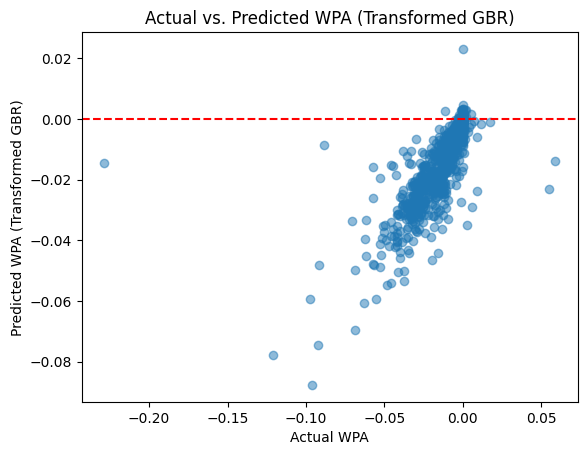

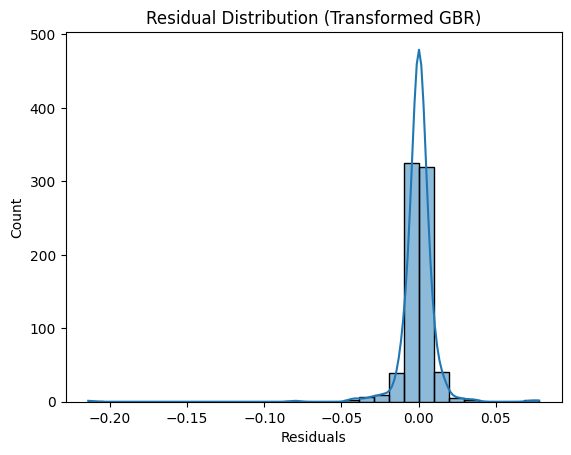

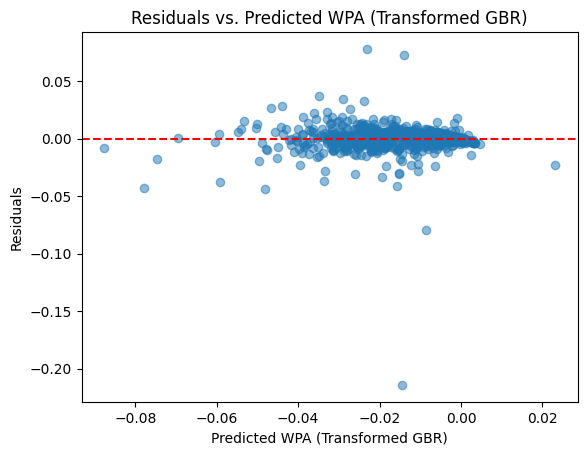

In [190]:
#Assessment Graphs for Timeout Gradient Boosted Model -- Post-Logit Adjustment

import matplotlib.pyplot as plt
import seaborn as sns

residuals = y_penalty_test - y_penalty_pred_final

# Actual vs. Predicted
plt.scatter(y_penalty_test, y_penalty_pred_final, alpha=0.5)
plt.xlabel("Actual WPA")
plt.ylabel("Predicted WPA (Transformed GBR)")
plt.title("Actual vs. Predicted WPA (Transformed GBR)")
plt.axhline(0, color='red', linestyle='--')
plt.show()

# Residual Distribution
sns.histplot(residuals, kde=True, bins=30)
plt.title("Residual Distribution (Transformed GBR)")
plt.xlabel("Residuals")
plt.show()

# Residuals vs. Predicted
plt.scatter(y_penalty_pred_final, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted WPA (Transformed GBR)")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted WPA (Transformed GBR)")
plt.show()


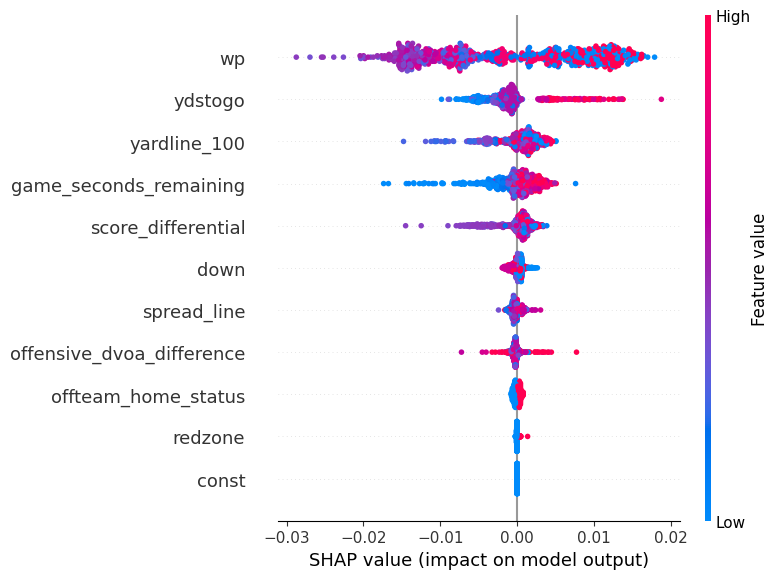

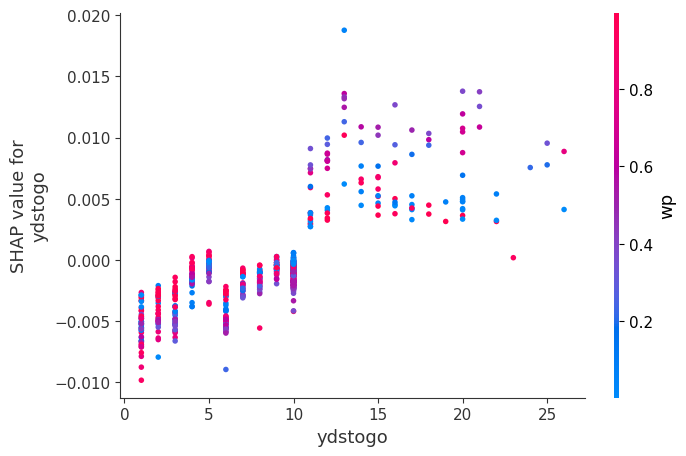

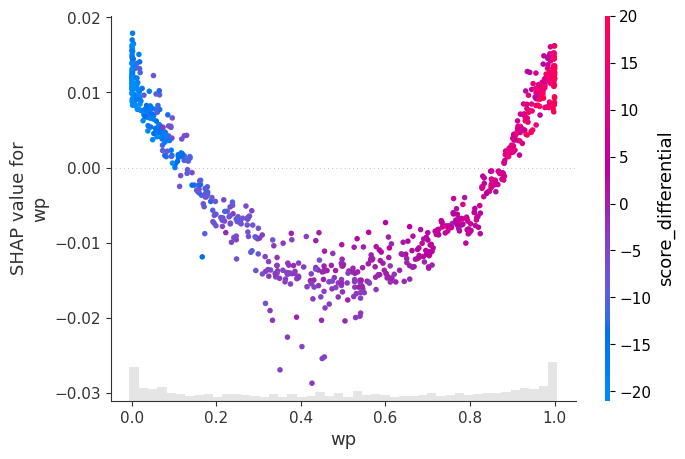

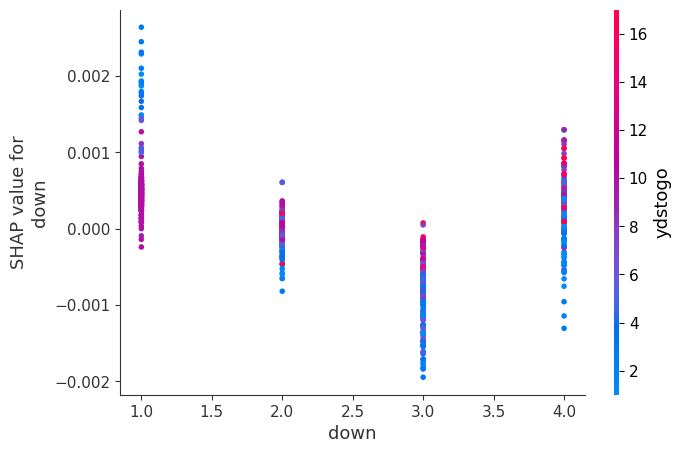

In [192]:
#SHAP Plots for Timeout Gradient Boosted Model -- Post-Logit Adjustment

import shap

# Create SHAP explainer
explainer = shap.Explainer(gbr_transformed, X_penalty_train)

# Compute SHAP values for test data
shap_values = explainer(X_penalty_test)

# Summary plot (global feature importance and direction)
shap.summary_plot(shap_values, X_penalty_test)

# Force plot for one prediction
shap.plots.force(shap_values[0])

shap.dependence_plot(
    'ydstogo',                        # Feature to analyze
    shap_values.values,              # ✅ Extract SHAP values array from Explanation object
    X_penalty_test,                  # The feature data (must align row-wise)
    interaction_index='wp'         # Optional: color by another feature
)

shap.plots.scatter(shap_values[:, "wp"], color=shap_values[:, "score_differential"])

shap.dependence_plot(
    'down',                        # Feature to analyze
    shap_values.values,              # ✅ Extract SHAP values array from Explanation object
    X_penalty_test,                  # The feature data (must align row-wise)
    interaction_index='ydstogo'         # Optional: color by another feature
)

In [194]:
#Paramater Tuning for Timeout Model

import optuna
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score

#Create the function to test a range of different options for the parameter tuning



def objective(trial):
    # Suggest hyperparameters (no hardcoded range)
    n_estimators = trial.suggest_int('n_estimators', 100, 500)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.2, log=True)
    max_depth = trial.suggest_int('max_depth', 3, 6)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
    subsample = trial.suggest_float('subsample', 0.6, 1.0)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])

    model = GradientBoostingRegressor(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        subsample=subsample,
        max_features=max_features,
        random_state=42
    )

    score = cross_val_score(model, X_penalty_train, y_penalty_train_t, cv=5, scoring='neg_mean_squared_error')
    return -1 * score.mean()  # minimize MSE

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print("Best trial:")
print(study.best_trial)


[I 2025-03-30 22:59:12,834] A new study created in memory with name: no-name-7f2904a2-4d98-41be-a427-fcae844cfcb0
[I 2025-03-30 22:59:18,150] Trial 0 finished with value: 0.00010718954360340709 and parameters: {'n_estimators': 477, 'learning_rate': 0.10861407849382117, 'max_depth': 4, 'min_samples_split': 7, 'min_samples_leaf': 3, 'subsample': 0.6573320234873077, 'max_features': None}. Best is trial 0 with value: 0.00010718954360340709.
[I 2025-03-30 22:59:23,124] Trial 1 finished with value: 9.748083732334974e-05 and parameters: {'n_estimators': 333, 'learning_rate': 0.016915791502754077, 'max_depth': 6, 'min_samples_split': 10, 'min_samples_leaf': 3, 'subsample': 0.6426776722910715, 'max_features': None}. Best is trial 1 with value: 9.748083732334974e-05.
[I 2025-03-30 22:59:25,019] Trial 2 finished with value: 0.00011018913608587598 and parameters: {'n_estimators': 483, 'learning_rate': 0.020553422310652533, 'max_depth': 3, 'min_samples_split': 6, 'min_samples_leaf': 3, 'subsample':

Best trial:
FrozenTrial(number=35, state=1, values=[9.25710996373185e-05], datetime_start=datetime.datetime(2025, 3, 30, 23, 1, 57, 449), datetime_complete=datetime.datetime(2025, 3, 30, 23, 2, 4, 669825), params={'n_estimators': 409, 'learning_rate': 0.027079091036086418, 'max_depth': 6, 'min_samples_split': 2, 'min_samples_leaf': 2, 'subsample': 0.7790158483630397, 'max_features': None}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'n_estimators': IntDistribution(high=500, log=False, low=100, step=1), 'learning_rate': FloatDistribution(high=0.2, log=True, low=0.01, step=None), 'max_depth': IntDistribution(high=6, log=False, low=3, step=1), 'min_samples_split': IntDistribution(high=10, log=False, low=2, step=1), 'min_samples_leaf': IntDistribution(high=4, log=False, low=1, step=1), 'subsample': FloatDistribution(high=1.0, log=False, low=0.6, step=None), 'max_features': CategoricalDistribution(choices=('sqrt', 'log2', None))}, trial_id=35, value=None)


In [196]:
#Paramater Tuned Timeout Model


# Define independent (X) and dependent (y) variables
X_penalty = df_penalty[[                
    'game_seconds_remaining',
    'score_differential',
    'yardline_100', 
    'down',
    'ydstogo',
    'spread_line', 
    'offensive_dvoa_difference',      
    'offteam_home_status',  
    'redzone',
    'wp'
]]

y_penalty = df_penalty['wpa']

# Add constant (intercept)
X_penalty = sm.add_constant(X_penalty)

#Define transformation for y-variable

def log_modulus(x):
    return np.sign(x) * np.log1p(np.abs(x))

def inv_log_modulus(x):
    return np.sign(x) * (np.expm1(np.abs(x)))

# Apply transformation to WPA (dependent variable) using log-modulus

y_penalty_transformed = log_modulus(y_penalty)

#Split dataset into testing and training subsets (80% train, 20% test)

X_penalty_train, X_penalty_test, y_penalty_train_t, y_penalty_test_t = train_test_split(
    X_penalty, y_penalty_transformed, test_size=0.2, random_state=42
)

# Initialize the Gradient Boosting Regressor (GBR) using parameter tuned valuees


best_optuna_gbr = GradientBoostingRegressor(
    n_estimators=153,
    learning_rate=0.0796,
    max_depth=6,
    min_samples_split=5,
    min_samples_leaf=3,
    subsample=0.8611,
    max_features=None,
    random_state=42
)

# Fit it to your transformed training data
best_optuna_gbr.fit(X_penalty_train, y_penalty_train)

# Predict the results
y_optuna_t_pred = best_optuna_gbr.predict(X_penalty_test)

# Inverse-transform predictions back to WPA scale
y_optuna_pred = inv_log_modulus(y_penalty_pred_logmod)

# Evaluate performance
rmse_optuna = mean_squared_error(y_penalty_test, y_optuna_pred, squared=False)
r2_optuna = r2_score(y_penalty_test, y_optuna_pred)

print(f"📈 Optuna-Tuned Model:\nR² Score: {r2_optuna:.4f}\nRMSE: {rmse_optuna:.6f}")


📈 Optuna-Tuned Model:
R² Score: 0.5596
RMSE: 0.012261


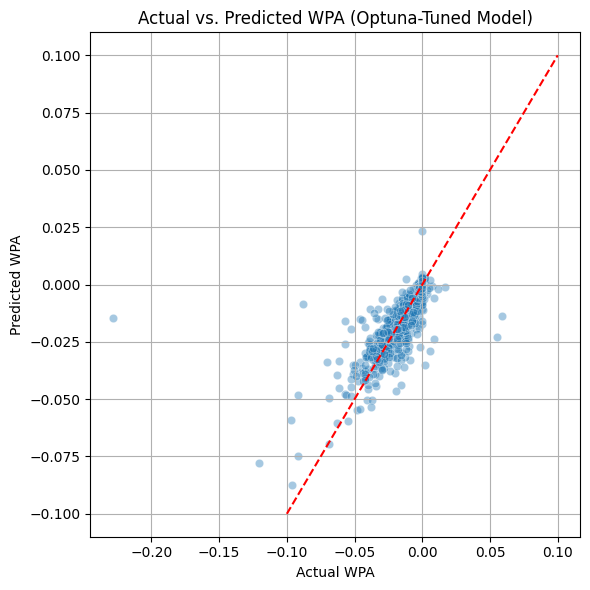

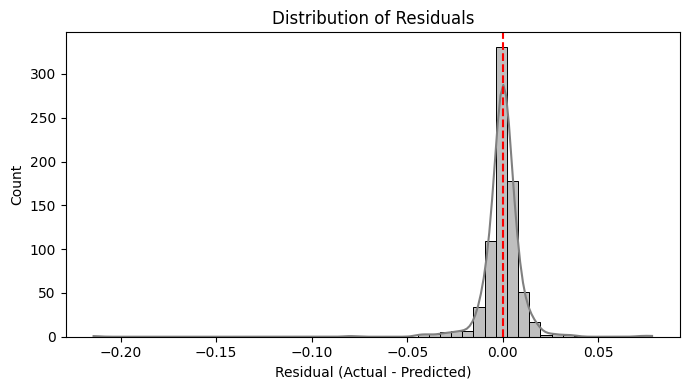

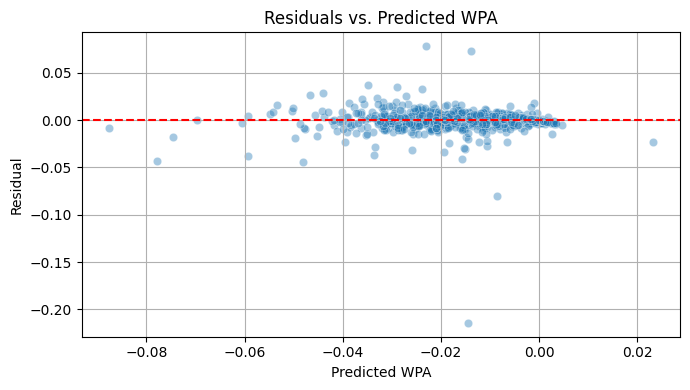

In [198]:
#Assessment Graphs for Paramater Tuned Timeout Model

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_penalty_test, y=y_optuna_pred, alpha=0.4)
plt.plot([-0.1, 0.1], [-0.1, 0.1], '--', color='red')  # Reference line
plt.xlabel('Actual WPA')
plt.ylabel('Predicted WPA')
plt.title('Actual vs. Predicted WPA (Optuna-Tuned Model)')
plt.grid(True)
plt.tight_layout()
plt.show()

residuals_optuna = y_penalty_test - y_optuna_pred

plt.figure(figsize=(7, 4))
sns.histplot(residuals_optuna, bins=50, kde=True, color='gray')
plt.axvline(0, linestyle='--', color='red')
plt.xlabel('Residual (Actual - Predicted)')
plt.title('Distribution of Residuals')
plt.tight_layout()
plt.show()

plt.figure(figsize=(7, 4))
sns.scatterplot(x=y_optuna_pred, y=residuals_optuna, alpha=0.4)
plt.axhline(0, linestyle='--', color='red')
plt.xlabel('Predicted WPA')
plt.ylabel('Residual')
plt.title('Residuals vs. Predicted WPA')
plt.grid(True)
plt.tight_layout()
plt.show()


In [200]:
#Add predicted wpa for each penalty back to the whole dataset (df_penalty)

# Step 1: Predict on the entire dataset
y_penalty_optuna_full = best_optuna_gbr.predict(X_penalty)

# Step 2: Inverse-transform predictions from log-modulus back to original WPA
y_penalty_pred_full = inv_log_modulus(y_penalty_optuna_full)

# Step 3: Save to df_penalty
df_penalty["predicted_gbr_wpa"] = y_penalty_pred_full

# Optional sanity check
print(df_penalty[["wpa", "predicted_gbr_wpa"]].head())


         wpa  predicted_gbr_wpa
6  -0.034203          -0.034277
8  -0.006367          -0.007196
25 -0.000043          -0.001291
39 -0.036030          -0.035989
61 -0.019719          -0.021547


In [202]:
#Table to see WPA loss by bins


#Separate the WPA loss by bins

bins_penalty = [0, 120, 240, 360, 480, 600, 720, 840, 960, 1080, 1200, 1320, 1440, 1560, 1680, 1800]
labels_penalty = ["0–2 min","2–4 min","4–6 min","6–8 min","8–10 min","10–12 min","12–14 min","14-16 min",
          "16–18 min","18–20 min","20–22 min","22–24 min","24–26 min","26–28 min","28–30 min"]

bins_wp_2 = [0, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1]
labels_wp_2 = ["0-10%","10-20%","20-30%","30-40%","40-50%","50-60%","60-70%","70-80%","80-90%","90-100%"]



df_penalty["seconds_remaining_bin"] = pd.cut(df_penalty["game_seconds_remaining"], bins=bins_penalty, labels=labels_penalty)
df_penalty["wp_bin"] = pd.cut(df_penalty["wp"], bins=bins_wp_2, labels=labels_wp_2)

grouped_penalty = df_penalty.groupby(["seconds_remaining_bin","wp_bin"])[['predicted_gbr_wpa']].mean()

# Count the number of rows in each bin
bin_counts_penalty = df_penalty.groupby(["seconds_remaining_bin","wp_bin"]).size().rename("count")

# Merge with grouped means
grouped_penalty = grouped_penalty.merge(bin_counts_penalty, left_index=True, right_index=True)

print(grouped_penalty)


# # 1. Reorder columns for correct stacking
# stacked = grouped[["marginal_gain_1_over_0", "marginal_gain_2_over_1", "marginal_gain_3_over_2"]]

# # 2. Create custom tick labels: bin label + count on new line
# xtick_labels = [f"{bin_label}\n(n={int(count)})" 
#                 for bin_label, count in zip(grouped.index, grouped["count"])]

# # 3. Plot the stacked bar chart
# ax = stacked.plot(kind="bar", stacked=True, figsize=(12,6), colormap="Blues")

# # Set x-tick labels
# ax.set_xticklabels(xtick_labels, rotation=0)

# # Axis labels and title
# ax.set_ylabel("Cumulative WP Gain")
# ax.set_xlabel("Starting Win Probability Bin")
# ax.set_title("Stacked WP Gains by Timeout and Starting WP Bin")
# ax.legend(title="Timeout Transition", loc="upper left")

# # Needed to avoid label cutoff
# plt.tight_layout()

# # Loop through bars in the stack
# for i, bin_label in enumerate(stacked.index):
#     bottom = 0  # Keep track of where each stack starts
    
#     # Go through each timeout transition in the stack
#     for col in stacked.columns:
#         value = stacked.loc[bin_label, col]
#         if pd.notnull(value) and value > 0:
#             # Position: x = bar index, y = middle of current segment
#             ax.text(
#                 x=i,
#                 y=bottom + value / 2,
#                 s=f"{value*100:.1f}%",
#                 ha="center",
#                 va="center",
#                 fontsize=9,
#                 color="white" if value > 0.015 else "black"
#             )
#             bottom += value

# # Add total value labels on top of each bar
# for i, bin_label in enumerate(stacked.index):
#     total = stacked.loc[bin_label].sum()
#     ax.text(
#         x=i,
#         y=total + 0.001,  # slightly above the top
#         s=f"{total*100:.1f}%",
#         ha="center",
#         va="bottom",
#         fontsize=10,
#         fontweight="bold",
#         color="black"
#     )

# plt.ylim(0, stacked.sum(axis=1).max() + 0.01)  # give room for top labels
# plt.show()


                               predicted_gbr_wpa  count
seconds_remaining_bin wp_bin                           
0–2 min               0-10%            -0.005915    101
                      10-20%           -0.024567     29
                      20-30%           -0.032758     29
                      30-40%           -0.061321     24
                      40-50%           -0.068364     21
                      50-60%           -0.047314     16
                      60-70%           -0.031500     11
                      70-80%           -0.024004      4
                      80-90%           -0.016166      7
                      90-100%          -0.001771    131
2–4 min               0-10%            -0.003359     95
                      10-20%           -0.020218     21
                      20-30%           -0.029920     18
                      30-40%           -0.038782     15
                      40-50%           -0.014266      7
                      50-60%           -0.051124

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [ ]:
#COMBINED ANALYSIS

In [218]:
from tqdm import tqdm
tqdm.pandas()  # <--- Register tqdm with pandas


# Step 1: Define grid and timeout curve
time_grid = np.arange(0, 241)
timeout_value_curve = f_3_to_2(time_grid)  # Replace with f_2_to_1 or f_1_to_0 if needed

# Step 2: Transform all rows at once
X_vectorized = preprocessor.transform(pbp_second_half_plays[feature_cols])

# Step 3: Predict probability distributions for all rows
probs_matrix = ckde.predict(X_vectorized, grid=time_grid)  # Shape: (n_rows, 241)

# Step 4: Multiply each row by the timeout value curve and sum across time
expected_values = probs_matrix @ timeout_value_curve  # Shape: (n_rows,)

# Step 5: Store back in your dataframe
pbp_second_half_plays["expected_timeout_value_3_to_2"] = expected_values


In [224]:
#Add new columns for each model


#PROBABILITY MODEL


X_prob_model = pbp_second_half_plays[['game_seconds_remaining', 'score_differential', 'yardline_100', 'down',
    'ydstogo','spread_line','defteam_home_status','wp']].copy()
X_prob_model = pd.get_dummies(X_prob_model, columns=['down'], drop_first=True)
X_prob_model = X_prob_model.reindex(columns=gb_model_columns, fill_value=0)
pbp_second_half_plays["prob_late_game_stop_pred"] = gb_model.predict_proba(X_prob_model)[:,1]



# #PREDICTED TIME REMAINING MODEL


# X_pred_time_model = pbp_second_half_plays[['game_seconds_remaining', 'yardline_100', 'spread_line', 'offensive_dvoa_difference',
#     'defensive_dvoa_difference','special_teams_dvoa_difference','down']].copy()
# X_pred_time_model = pd.get_dummies(X_pred_time_model, columns=['down'], drop_first=True)
# X_pred_time_model = X_pred_time_model.reindex(columns=ckde_columns, fill_value=0)


# # Create a grid of plausible start times (e.g., 0–250 seconds remaining)
# grid = np.linspace(0, 240, 500)  # You can adjust range/resolution if needed

# # Get density predictions for each row in X_pred_time_model
# densities = ckde.predict(X_pred_time_model, grid)  # shape = [n_samples, len(grid)]

# # Convert to expected value (i.e., mean of each predicted distribution)
# expected_start_times = np.sum(densities * grid, axis=1)

# # Add back to dataframe
# pbp_second_half_plays["expected_time_left_at_late_game_pred"] = expected_start_times





#TIMEOUT MODEL


X_timeout_model = pbp_second_half_plays[['game_seconds_remaining', 'score_differential', 'yardline_100', 'down',
    'ydstogo','spread_line', 'offensive_dvoa_difference','offteam_home_status','redzone','wp']].copy()

X_timeout_model = sm.add_constant(X_timeout_model)

second_half_timeout_log_pred = best_optuna_gbr.predict(X_timeout_model)
second_half_timeout_pred_full = inv_log_modulus(second_half_timeout_log_pred)
pbp_second_half_plays["penalty_wp_loss_pred"] = second_half_timeout_pred_full





In [288]:
pbp_second_half_plays.groupby(['game_late_def_stop','team_will_later_have_a_def_stop']).agg({'prob_late_game_stop_pred':'mean'})

prob_late_game_stop_pred
game_late_def_stop team_will_later_have_a_def_stop                          
0.0                0                                                0.171637
1.0                0                                                0.157514
                   1                                                0.484243

In [378]:

pbp_main_expanded.head(1000)


,game_id,posteam,defteam,away_team,home_team,qtr,game_seconds_remaining,time,score_differential,posteam_timeouts_remaining,defteam_timeouts_remaining,away_timeouts_remaining,home_timeouts_remaining,timeout,timeout_team,wp,def_wp,wpa,home_wp_post,away_wp_post,spread_line,drive,series,yrdln,yardline_100,down,ydstogo,play_type,yards_gained,rush_attempt,pass_attempt,own_kickoff_recovery,temp,wind,first_down,series_result,fg_prob,td_prob,total_home_epa,total_away_epa,series_start_seconds_remaining,drive_late_def_stop,game_late_def_stop,team_with_late_def_stop,late_def_teams_in_game,team_will_later_have_a_def_stop,year,posteam_offensive_dvoa,posteam_offensive_rank,defteam_offensive_dvoa,defteam_offensive_rank,defteam_defensive_dvoa,defteam_defensive_rank,posteam_defensive_dvoa,posteam_defensive_rank,defteam_total_dvoa,defteam_total_rank,posteam_total_dvoa,posteam_total_rank,defteam_special_teams_dvoa,defteam_special_teams_rank,posteam_special_teams_dvoa,posteam_special_teams_rank,offensive_dvoa_difference,defensive_dvoa_difference,special_teams_dvoa_difference,total_dvoa_difference,defteam_home_status,drive_beginning_def_wp,drive_end_def_wp,drive_beginning_def_to,drive_end_def_to,redzone,offteam_home_status,prob_late_def_stop,prob_late_game_stop_pred,expected_timeout_value_3_to_2,penalty_wp_loss_pred,marg_timeout_value_3_to_2,late_stop_3TO_v_penalty,team_half_id,prob_late_game_stop_situation
88,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1.780278,15:00,0.587453,3.0,3.0,3.0,3.0,0.0,None,0.693672,0.254163,-0.012221,0.733616,0.266384,0.441629,12.0,24.0,DEN 20,1.198365,-0.992702,0.335125,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.227784,0.352274,5.607522,-5.607522,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.222274,-1.561961,-1.385805,0.210866,-0.999268,0.254163,0.288142,3.0,3.0,0,1.0,0.263019,0.154734,0.027156,-1.348254e-02,0.004202,-0.009281,2015_01_BAL_DEN_DEN,0.018093
89,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1.774713,14:57,0.587453,3.0,3.0,3.0,3.0,0.0,None,0.659851,0.266384,-0.021758,0.711858,0.288142,0.441629,12.0,24.0,DEN 20,1.198365,0.002492,0.335125,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Opp touchdown,0.205863,0.315427,4.920987,-4.920987,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.222274,-1.561961,-1.385805,0.210866,-0.999268,0.254163,0.288142,3.0,3.0,0,1.0,0.265961,0.163109,0.028383,-1.285649e-02,0.004629,-0.008227,2015_01_BAL_DEN_DEN,0.018093
90,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1.693098,14:13,0.587453,3.0,3.0,3.0,3.0,0.0,None,0.599639,0.288142,-0.171003,0.540856,0.459144,0.441629,12.0,24.0,DEN 20,1.198365,0.997685,0.335125,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Opp touchdown,0.186743,0.274310,-1.760423,1.760423,1800.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.222274,-1.561961,-1.385805,0.210866,-0.999268,0.254163,0.288142,3.0,3.0,0,1.0,0.275428,0.179059,0.027243,-1.584344e-02,0.004878,-0.010965,2015_01_BAL_DEN_DEN,0.018093
93,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1.676404,14:04,0.049295,3.0,3.0,3.0,3.0,0.0,None,0.110474,0.464901,-0.014326,0.520773,0.479227,0.441629,13.0,25.0,DEN 20,1.198365,-0.992702,0.335125,run,0.0,1.0,0.0,0.0,88.0,13.0,0.0,Punt,0.232499,0.351124,-2.333716,2.333716,1744.0,0.0,1.0,0,[BAL],0,2015,-0.054033,23.0,-0.026661,20.0,0.086349,22.0,-0.218133,1.0,-0.039697,18.0,0.171169,8.0,0.073313,1.0,0.007070,14.0,0.222274,-1.561961,-1.385805,0.210866,-0.999268,0.464901,0.531315,3.0,3.0,0,1.0,0.380579,0.342725,0.028639,-1.906899e-02,0.009815,-0.009254,2015_01_BAL_DEN_DEN,0.018093
94,2015_01_BAL_DEN,DEN,BAL,BAL,DEN,3.0,1.594789,13:20,0.049295,3.0,3.0,3.0,3.0,0.0,None,0.070828,0.479227,-0.034656,0.486117,0.513883,0.441629,13.0,25.0,DEN 20,1.198365,0.002492,0.335125,pass,0.0,0.0,1.0,0.0,88.0,13.0,0.0,Punt,0.214879,0.321620,-3.100584,3.100

In [232]:


pbp_second_half_plays["marg_timeout_value_3_to_2"] = pbp_second_half_plays["prob_late_game_stop_pred"] * pbp_second_half_plays["expected_timeout_value_3_to_2"]
# pbp_second_half_plays["marg_timeout_value_2_to_1"] = pbp_second_half_plays["prob_late_game_stop_pred"] * pbp_second_half_plays["expected_timeout_value_2_to_1"]
# pbp_second_half_plays["marg_timeout_value_1_to_0"] = pbp_second_half_plays["prob_late_game_stop_pred"] * pbp_second_half_plays["expected_timeout_value_1_to_0"]


In [238]:

pbp_second_half_plays["late_stop_3TO_v_penalty"] = pbp_second_half_plays["penalty_wp_loss_pred"] + pbp_second_half_plays["marg_timeout_value_3_to_2"] 
# pbp_second_half_plays["late_stop_2TO_v_penalty"] = pbp_second_half_plays["penalty_wp_loss_pred"] + pbp_second_half_plays["marg_timeout_value_2_to_1"] 
# pbp_second_half_plays["late_stop_1TO_v_penalty"] = pbp_second_half_plays["penalty_wp_loss_pred"] + pbp_second_half_plays["marg_timeout_value_1_to_0"] 


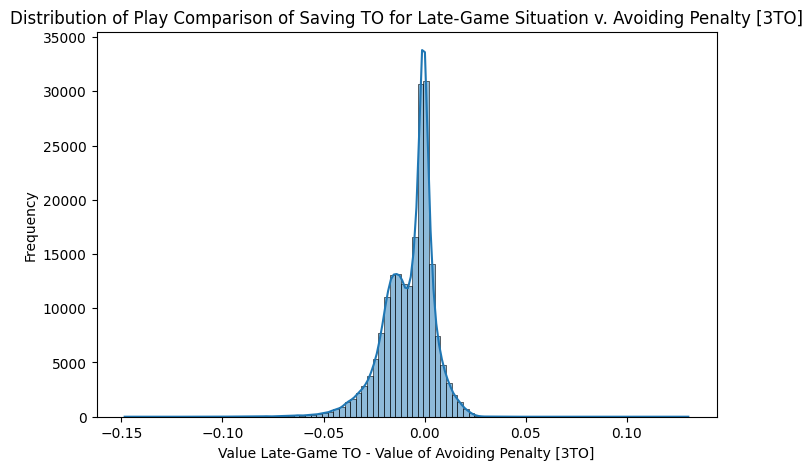

In [242]:
plt.figure(figsize=(8, 5))
sns.histplot(pbp_second_half_plays["late_stop_3TO_v_penalty"], bins=100, kde=True)
plt.xlabel("Value Late-Game TO - Value of Avoiding Penalty [3TO]")
plt.ylabel("Frequency")
plt.title("Distribution of Play Comparison of Saving TO for Late-Game Situation v. Avoiding Penalty [3TO]")
plt.show()

In [ ]:
#BAYESIAN BART REGRESSION ATTEMPTS

✅ R² Score: 0.5093


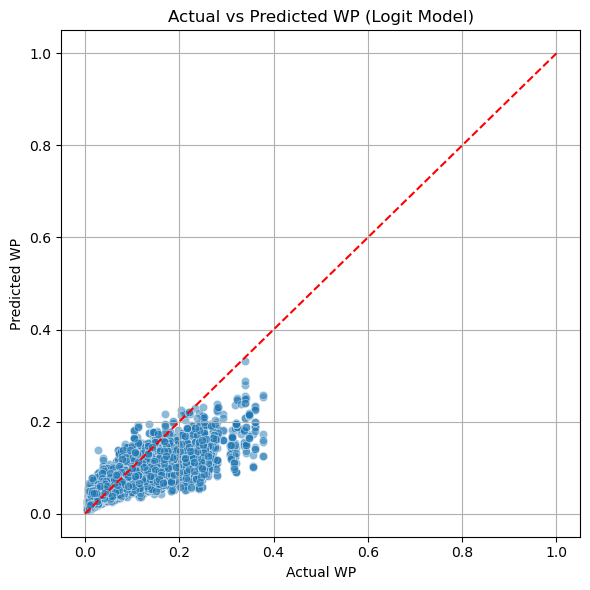

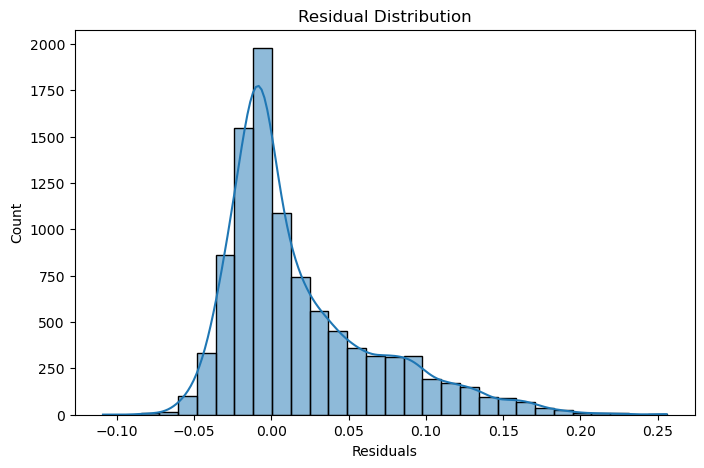

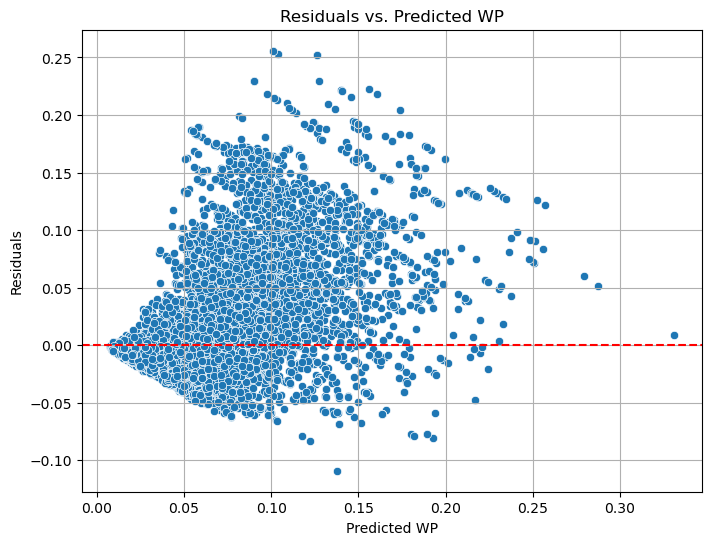

In [96]:
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# -------------------------------
# 1. Create interaction terms
# -------------------------------
df_late_stop_games['score_diff_x_wp'] = df_late_stop_games['score_differential'] * df_late_stop_games['wp']
df_late_stop_games['ydstogo_x_down'] = df_late_stop_games['ydstogo'] * df_late_stop_games['down']

# -------------------------------
# 2. Define features and logit-transformed target
# -------------------------------
features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp',
    'offensive_dvoa_difference',
    'defensive_dvoa_difference',
    # 'score_diff_x_wp',
    # 'ydstogo_x_down'
]

X_wp_pred = df_late_stop_games[features].copy()

# One-hot encode down
X_wp_pred = pd.get_dummies(X_wp_pred, columns=['down'], drop_first=True)

# Clip y values to avoid 0 or 1 for logit
epsilon = 1e-5
y_raw = df_late_stop_games['late_game_stop_drive_starting_wp'].clip(epsilon, 1 - epsilon)

# Apply logit transformation
y_wp_pred = np.log(y_raw / (1 - y_raw))

# -------------------------------
# 3. Train/test split
# -------------------------------
X_train_wp, X_test_wp, y_train_wp, y_test_wp = train_test_split(X_wp_pred, y_wp_pred, test_size=0.2, random_state=42)

# -------------------------------
# 4. Train gradient boosted regression model
# -------------------------------
wp_model = HistGradientBoostingRegressor(random_state=42)
wp_model.fit(X_train_wp, y_train_wp)

# -------------------------------
# 5. Evaluate model
# -------------------------------
y_pred_wp_logit = wp_model.predict(X_test_wp)

# Inverse logit to get back to probability scale
def inv_logit(x):
    return 1 / (1 + np.exp(-x))

y_pred_wp = inv_logit(y_pred_wp_logit)
y_actual_wp = inv_logit(y_test_wp)

r2 = r2_score(y_actual_wp, y_pred_wp)
# rmse = mean_squared_error(y_actual_wp, y_pred_wp, squared=False)

print(f"✅ R² Score: {r2:.4f}")
# print(f"✅ RMSE: {rmse:.6f}")

# -------------------------------
# 6. Visualizations
# -------------------------------
residuals = y_actual_wp - y_pred_wp

# Scatter: Actual vs. Predicted
plt.figure(figsize=(6, 6))
sns.scatterplot(x=y_actual_wp, y=y_pred_wp, alpha=0.5)
plt.plot([0, 1], [0, 1], '--', color='red')
plt.xlabel("Actual WP")
plt.ylabel("Predicted WP")
plt.title("Actual vs Predicted WP (Logit Model)")
plt.grid(True)
plt.tight_layout()
plt.show()

# Residual Histogram
plt.figure(figsize=(8, 5))
sns.histplot(residuals, kde=True, bins=30)
plt.xlabel("Residuals")
plt.title("Residual Distribution")
plt.show()

# Residuals vs. Predicted
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_wp, y=residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Predicted WP")
plt.ylabel("Residuals")
plt.title("Residuals vs. Predicted WP")
plt.grid(True)
plt.show()


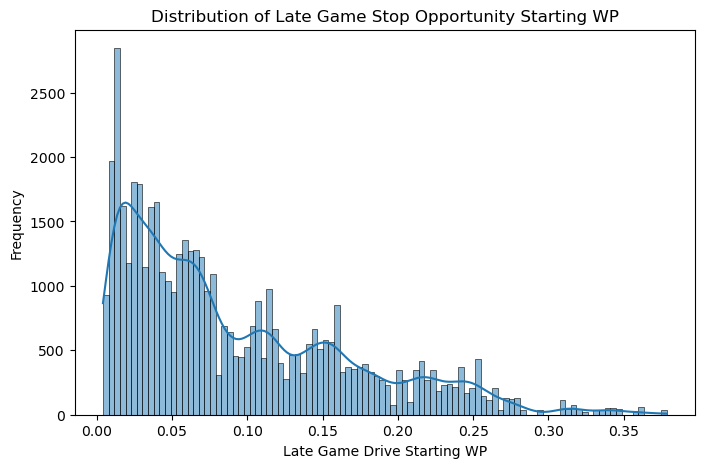

In [63]:
plt.figure(figsize=(8, 5))
sns.histplot(df_late_stop_games['late_game_stop_drive_starting_wp'], bins=100, kde=True)
plt.xlabel("Late Game Drive Starting WP")
plt.ylabel("Frequency")
plt.title("Distribution of Late Game Stop Opportunity Starting WP")
plt.show()

✅ R² Score: 0.3012
✅ RMSE: 0.062725


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


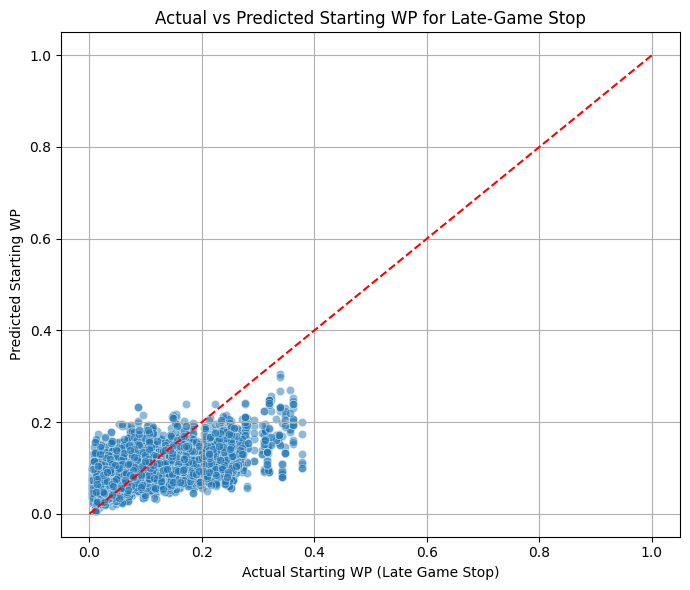

In [94]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------------
# 1. Prepare Data
# -----------------------------------
features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp'
]

df_model = df_late_stop_games.copy()  # Replace with your filtered dataset

X = df_model[features]
X = pd.get_dummies(X, columns=['down'], drop_first=True)

# ✅ Apply log1p transformation to the target
y_raw = df_model['late_game_stop_drive_starting_wp']
y_transformed = np.log1p(y_raw)

# -----------------------------------
# 2. Train/Test Split
# -----------------------------------
X_train, X_test, y_train, y_test_raw = train_test_split(
    X, y_raw, test_size=0.2, random_state=42
)
y_train_trans = np.log1p(y_train)  # Apply transformation to y_train

# -----------------------------------
# 3. Fit Model
# -----------------------------------
gbr = HistGradientBoostingRegressor(random_state=42)
gbr.fit(X_train, y_train_trans)

# -----------------------------------
# 4. Predict and Inverse Transform
# -----------------------------------
y_pred_trans = gbr.predict(X_test)
y_pred = np.expm1(y_pred_trans)  # ⬅️ inverse of log1p
y_test = y_test_raw  # (untouched test target)

# -----------------------------------
# 5. Evaluation
# -----------------------------------
r2 = r2_score(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)

print(f"✅ R² Score: {r2:.4f}")
print(f"✅ RMSE: {rmse:.6f}")

# -----------------------------------
# 6. Visualization
# -----------------------------------
plt.figure(figsize=(7, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.5)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlabel("Actual Starting WP (Late Game Stop)")
plt.ylabel("Predicted Starting WP")
plt.title("Actual vs Predicted Starting WP for Late-Game Stop")
plt.grid(True)
plt.tight_layout()
plt.show()


🔹 R² Score (Quantile 0.5): 0.0914
🔹 RMSE: 0.071524


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


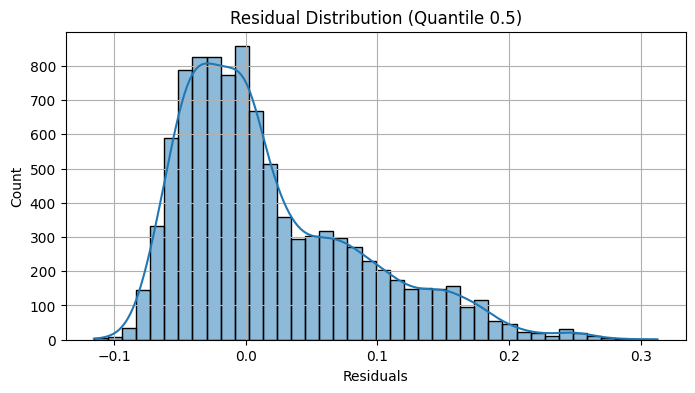

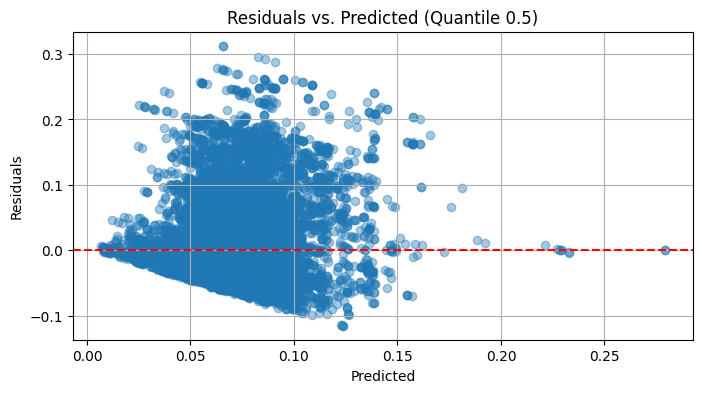

In [96]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

# -------------------------------
# 1. Define features and target
# -------------------------------
features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp'
]

X = df_late_stop_games[features]
y = df_late_stop_games['late_game_stop_drive_starting_wp']

# Optional: One-hot encode 'down' if it isn't already
X = pd.get_dummies(X, columns=['down'], drop_first=True)

# -------------------------------
# 2. Train/Test Split
# -------------------------------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# -------------------------------
# 3. Fit Quantile Regression (median)
# -------------------------------
quantile = 0.5  # Change to 0.1 or 0.9 for lower/upper bounds

q_model = GradientBoostingRegressor(
    loss='quantile',
    alpha=quantile,
    n_estimators=300,
    learning_rate=0.05,
    max_depth=4,
    random_state=42
)

q_model.fit(X_train, y_train)

# -------------------------------
# 4. Evaluate
# -------------------------------
y_pred_q = q_model.predict(X_test)

r2 = r2_score(y_test, y_pred_q)
rmse = mean_squared_error(y_test, y_pred_q, squared=False)

print(f"🔹 R² Score (Quantile {quantile}): {r2:.4f}")
print(f"🔹 RMSE: {rmse:.6f}")

# -------------------------------
# 5. Residual Plots
# -------------------------------
residuals_q = y_test - y_pred_q

plt.figure(figsize=(8, 4))
sns.histplot(residuals_q, bins=40, kde=True)
plt.title(f"Residual Distribution (Quantile {quantile})")
plt.xlabel("Residuals")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 4))
plt.scatter(y_pred_q, residuals_q, alpha=0.4)
plt.axhline(0, color='red', linestyle='--')
plt.title(f"Residuals vs. Predicted (Quantile {quantile})")
plt.xlabel("Predicted")
plt.ylabel("Residuals")
plt.grid(True)
plt.show()


In [98]:
import pymc as pm
import arviz as az
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ------------------------------
# 📊 1. Prepare data
# ------------------------------
features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp'
]

df_model = df_late_stop_games.copy()  # this should only include rows with a future late-game stop

X = df_model[features].copy()
y = df_model['late_game_stop_drive_starting_wp'].copy()

# One-hot encode down
X = pd.get_dummies(X, columns=['down'], drop_first=True)

# Optional: Scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

# ------------------------------
# 🧠 2. Bayesian linear regression model
# ------------------------------
with pm.Model() as bayes_model:

    # Priors on coefficients
    coefs = pm.Normal("coefs", mu=0, sigma=1, shape=X_scaled_df.shape[1])
    intercept = pm.Normal("intercept", mu=0, sigma=1)

    # Linear predictor
    mu = intercept + pm.math.dot(X_scaled_df.values, coefs)

    # Outcome likelihood
    sigma = pm.HalfNormal("sigma", sigma=1)
    likelihood = pm.Normal("y", mu=mu, sigma=sigma, observed=y.values)

    # Inference
    trace = pm.sample(2000, tune=1000, target_accept=0.9, return_inferencedata=True)


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [coefs, intercept, sigma]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 30 seconds.


In [100]:
import arviz as az

# Summary statistics
az.summary(trace, round_to=2)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
coefs[0],-0.00,0.0,-0.00,-0.00,0.0,0.0,7143.60,6115.07,1.0
coefs[1],0.00,0.0,0.00,0.01,0.0,0.0,5165.62,5562.93,1.0
coefs[2],-0.00,0.0,-0.00,0.00,0.0,0.0,7027.17,6415.70,1.0
coefs[3],-0.00,0.0,-0.00,0.00,0.0,0.0,10882.56,6468.50,1.0
coefs[4],0.00,0.0,-0.00,0.00,0.0,0.0,11403.45,5368.33,1.0
coefs[5],-0.01,0.0,-0.01,-0.01,0.0,0.0,9809.57,6098.55,1.0
coefs[6],0.01,0.0,0.01,0.01,0.0,0.0,5122.91,5809.44,1.0
coefs[7],-0.00,0.0,-0.00,0.00,0.0,0.0,9858.74,6474.27,1.0
coefs[8],-0.00,0.0,-0.00,0.00,0.0,0.0,9497.44,6941.05,1.0
coefs[9],-0.00,0.0,-0.00,-0.00,0.0,0.0,8873.65,6513.14,1.0


array([[<Axes: title={'center': 'coefs'}>,
        <Axes: title={'center': 'coefs'}>],
       [<Axes: title={'center': 'intercept'}>,
        <Axes: title={'center': 'intercept'}>]], dtype=object)

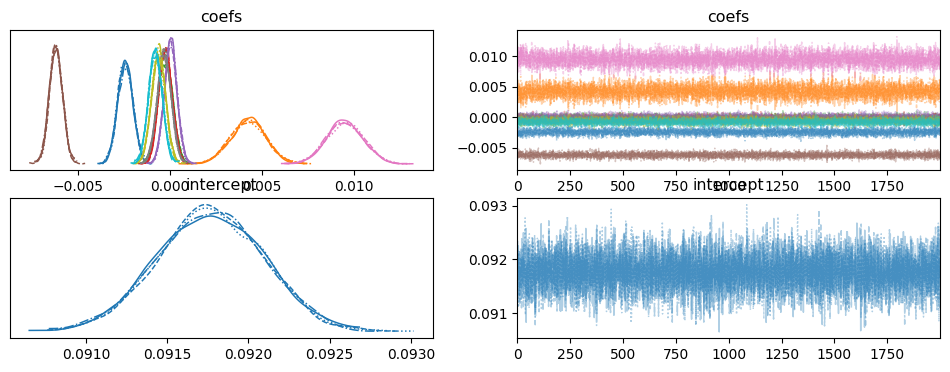

In [102]:
az.plot_trace(trace, var_names=["coefs", "intercept"])


Sampling: [y]


Output()

<Axes: xlabel='y'>

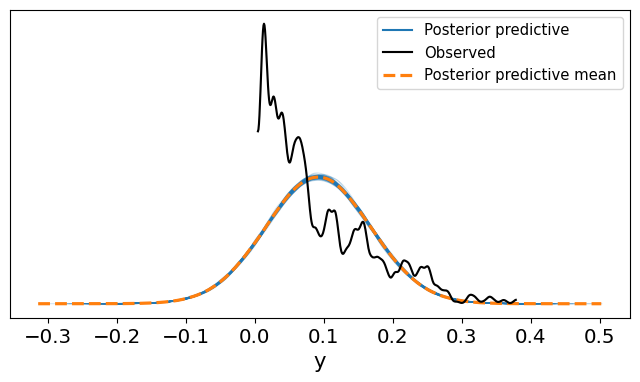

In [104]:
# 1. Sample posterior predictive using the full InferenceData return
with bayes_model:
    ppc = pm.sample_posterior_predictive(trace, random_seed=42)

# 2. Convert both posterior and PPC into InferenceData
idata_ppc = az.from_dict(
    posterior_predictive={"y": ppc.posterior_predictive["y"].values},
    observed_data={"y": y.values}
)

# 3. Plot posterior predictive checks
az.plot_ppc(idata_ppc, num_pp_samples=100, kind="kde", figsize=(8, 4))


In [31]:
import pymc as pm
from pymc_bart import BART
import numpy as np
import pandas as pd

# ----------------------------------
# 1. Prepare data
# ----------------------------------
features = [   
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp']

target = 'late_game_stop_drive_starting_wp'

X = df_late_stop_games[features]
y = df_late_stop_games[target]

# ----------------------------------
# 2. Fit BART model
# ----------------------------------
with pm.Model() as bart_model:
    # BART latent function (predictive mean)
    mu = BART("mu", X=X.values, Y=y.values, m=50)

    # Add a likelihood layer so PyMC can compute the posterior
    sigma = pm.HalfNormal("sigma", sigma=1.0)
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma, observed=y.values)

    # Sample from the posterior
    trace = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=42)

# ----------------------------------
# 3. Done! You can inspect trace or analyze predictions manually
# ----------------------------------


DisconnectedInputError:  
Backtrace when that variable is created:

  File "/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3336, in run_cell_async
    has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
  File "/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3519, in run_ast_nodes
    if await self.run_code(code, result, async_=asy):
  File "/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3579, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/2g/3q0d_r6j6dv0h16f84t9zb280000gn/T/ipykernel_9119/1163074909.py", line 29, in <module>
    mu = BART("mu", X=X.values, Y=y.values, m=50)
  File "/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/pymc_bart/bart.py", line 175, in __new__
    return super().__new__(cls, name, *params, **kwargs)
  File "/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/pymc/distributions/distribution.py", line 371, in __new__
    rv_out = model.register_rv(
  File "/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/pymc/model/core.py", line 1258, in register_rv
    self.create_value_var(rv_var, transform)
  File "/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/pymc/model/core.py", line 1396, in create_value_var
    value_var = rv_var.type()


In [22]:
print('Done!')

Done!


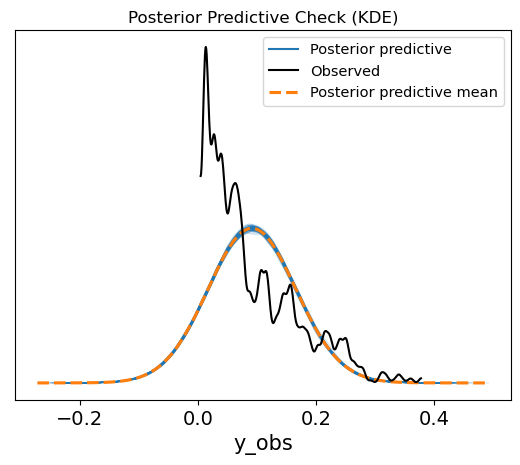

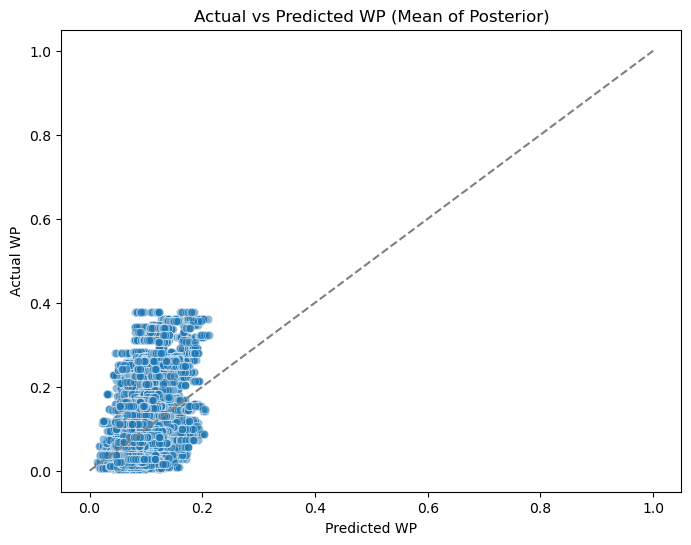

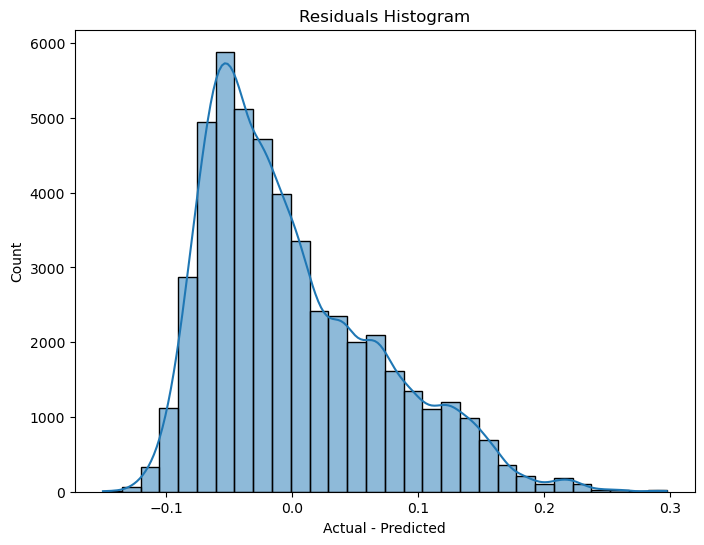

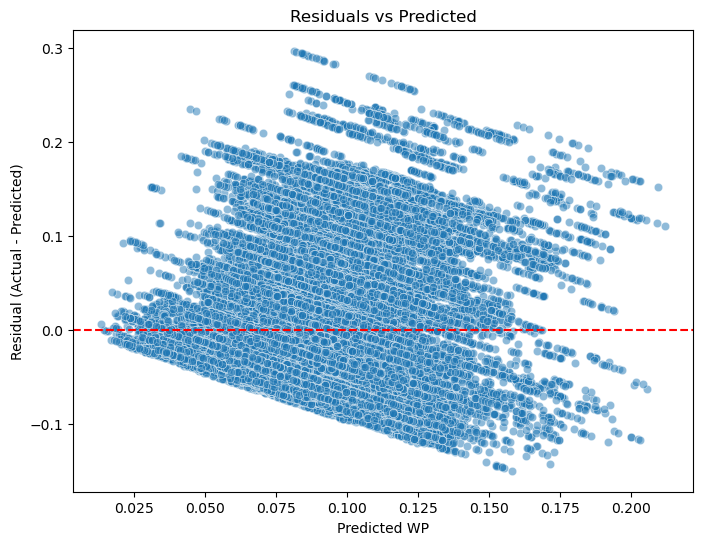

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Get predicted samples from ppc
y_pred_samples = ppc.posterior_predictive["y_obs"].values
y_pred_mean = y_pred_samples.mean(axis=(0, 1))
residuals = y.values - y_pred_mean

# 1. Posterior Predictive Check
az.plot_ppc(ppc, num_pp_samples=100, kind="kde")
plt.title("Posterior Predictive Check (KDE)")
plt.show()

# 2. Actual vs Predicted
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_mean, y=y.values, alpha=0.5)
plt.plot([0, 1], [0, 1], "--", color="gray")
plt.xlabel("Predicted WP")
plt.ylabel("Actual WP")
plt.title("Actual vs Predicted WP (Mean of Posterior)")
plt.show()

# # 3. RMSE & MAE
# rmse = mean_squared_error(y, y_pred_mean, squared=False)
# mae = mean_absolute_error(y, y_pred_mean)
# print(f"RMSE: {rmse:.4f}")
# print(f"MAE: {mae:.4f}")

# 4. Residuals Histogram
plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True, bins=30)
plt.title("Residuals Histogram")
plt.xlabel("Actual - Predicted")
plt.show()

# 5. Residuals vs Predicted
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_mean, y=residuals, alpha=0.5)
plt.axhline(0, color="red", linestyle="--")
plt.xlabel("Predicted WP")
plt.ylabel("Residual (Actual - Predicted)")
plt.title("Residuals vs Predicted")
plt.show()


In [23]:
# Posterior mean of sigma
pm.summary(trace, var_names=["sigma"])

# Posterior predictive mean from the BART model
mu_posterior_samples = trace.posterior["mu"]
mu_mean = mu_posterior_samples.mean(dim=["chain", "draw"]).values

In [24]:
import arviz as az

# Basic summary of sampled parameters
az.summary(trace, var_names=["sigma"])

/opt/anaconda3/envs/pymc-bart/lib/python3.10/site-packages/IPython/core/formatters.py:406: FutureWarning: Index.format is deprecated and will be removed in a future version. Convert using index.astype(str) or index.map(formatter) instead.
  return method()


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma,0.07,0.0,0.069,0.07,0.0,0.0,9.0,28.0,1.39


In [25]:
with bart_model:
    ppc = pm.sample_posterior_predictive(trace, var_names=["y_obs"])

Sampling: [y_obs]


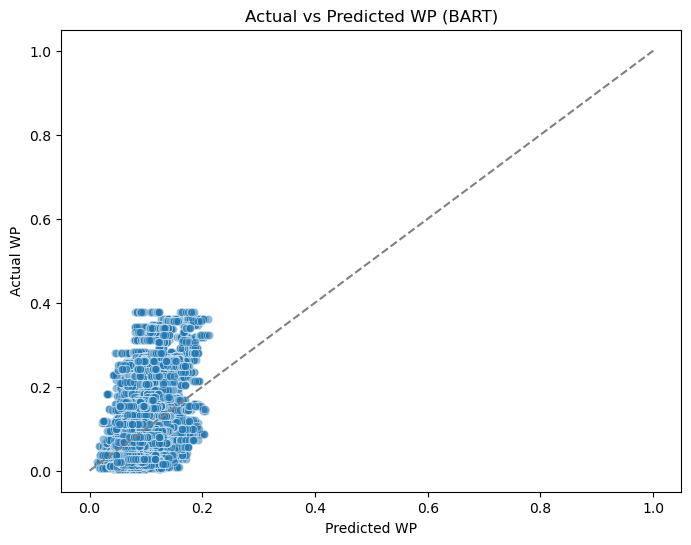

In [27]:
# Access the posterior predictive samples properly
y_pred_samples = ppc.posterior_predictive["y_obs"].values  # shape: (chains, draws, observations)

# Flatten chain and draw dimensions (if necessary)
y_pred_mean = y_pred_samples.mean(axis=(0, 1))  # Mean prediction for each observation

# Plot actual vs predicted
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred_mean, y=y.values, alpha=0.5)
plt.plot([0, 1], [0, 1], "--", color="gray")
plt.xlabel("Predicted WP")
plt.ylabel("Actual WP")
plt.title("Actual vs Predicted WP (BART)")
plt.show()


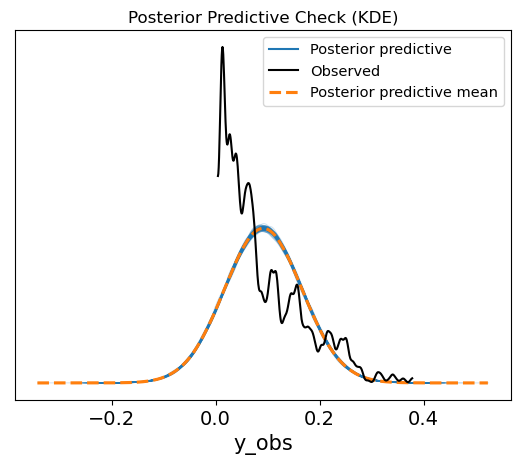

In [28]:
az.plot_ppc(ppc, num_pp_samples=100, kind="kde")
plt.title("Posterior Predictive Check (KDE)")
plt.show()

In [76]:
#BART with Beta Distribution

import pymc as pm
from pymc_bart import BART
import numpy as np
import pandas as pd

# ----------------------------------
# 1. Prepare data
# ----------------------------------
features = [   
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'defteam_home_status',
    'wp',
    'offensive_dvoa_difference',
    'defensive_dvoa_difference',
]
target = 'late_game_stop_drive_starting_wp'

X = df_late_stop_games[features]
y = df_late_stop_games[target]

# ----------------------------------
# 2. Fit BART model
# ----------------------------------
with pm.Model() as model:
    mu = BART("mu", X=X.values, Y=y.values, m=100)

    # Ensure mu is strictly between 0 and 1 (it should already be, but clip just in case)
    epsilon = 1e-5
    mu_clipped = pm.Deterministic("mu_clipped", pm.math.clip(mu, epsilon, 1 - epsilon))

    # Convert mean to alpha/beta for Beta distribution
    kappa = pm.HalfNormal("kappa", sigma=10)
    alpha = mu_clipped * kappa
    beta = (1 - mu_clipped) * kappa

    y_obs = pm.Beta("y_obs", alpha=alpha, beta=beta, observed=np.clip(y.values, epsilon, 1 - epsilon))

    trace = pm.sample(1000, tune=1000, target_accept=0.9, random_seed=42)

# ----------------------------------
# 3. Done! You can inspect trace or analyze predictions manually
# ----------------------------------


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>PGBART: [mu]
>NUTS: [kappa]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1858 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In [35]:
print('done')

done


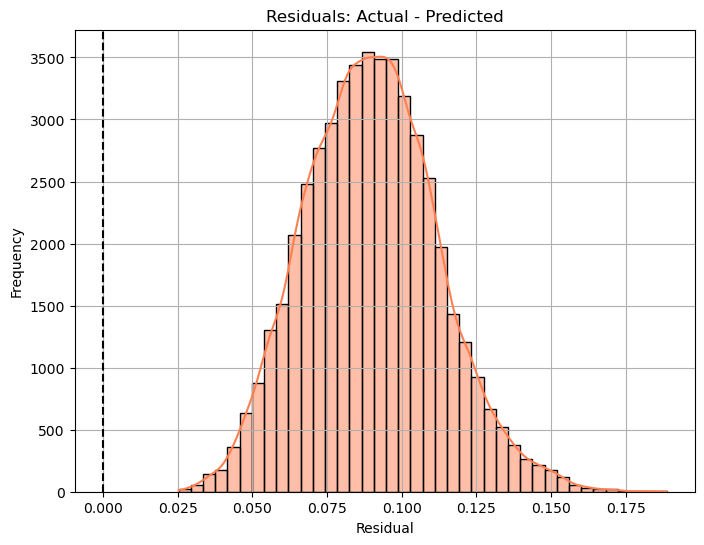

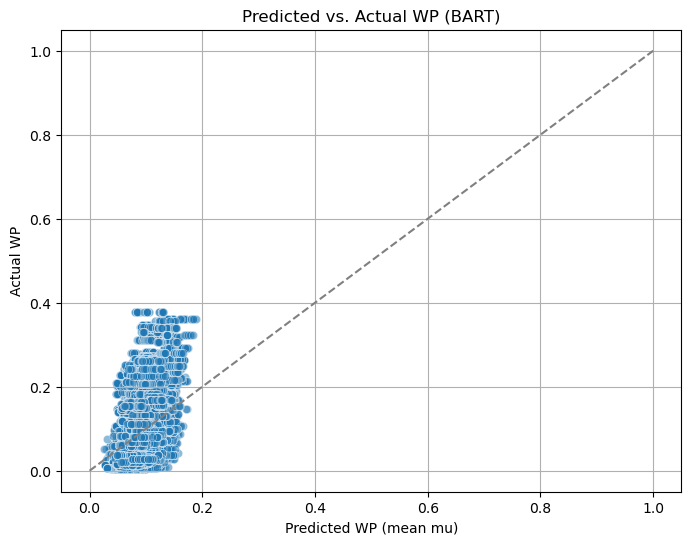

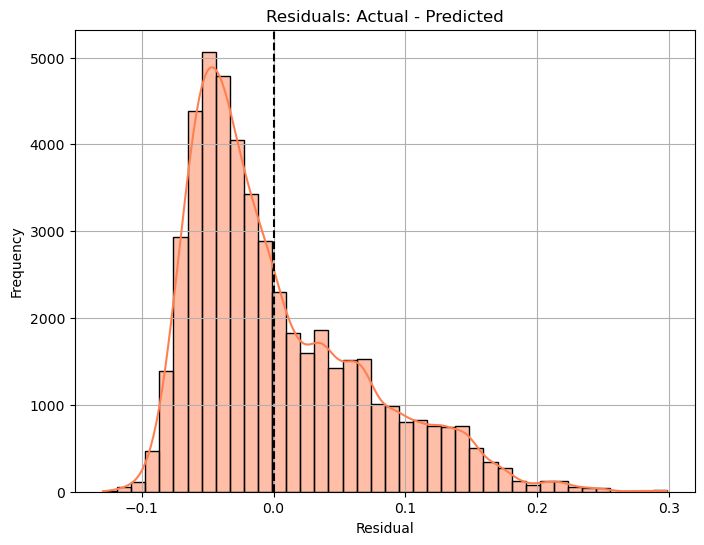

Mean Absolute Error (MAE): 0.0532
Root Mean Squared Error (RMSE): 0.0667
R²: 0.2152


In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# ----------------------------------
# 1. Extract posterior mean prediction (mu)
# ----------------------------------
mu_samples = trace.posterior["mu"]  # shape: (chain, draw, sample)
mu_mean = mu_samples.mean(dim=("chain", "draw")).values  # shape: (n_samples,)


# ----------------------------------
# 2. Plot Histogram of Predicted Values
# ----------------------------------
plt.figure(figsize=(8, 6))
sns.histplot(mu_mean, kde=True, bins=40, color="coral")
plt.title("Distribution of Sample Values")
plt.xlabel("Sample Values")
plt.ylabel("Frequency")
plt.axvline(0, color="black", linestyle="--")
plt.grid(True)
plt.show()

# ----------------------------------
# 3. Plot Actual vs. Predicted
# ----------------------------------
plt.figure(figsize=(8, 6))
sns.scatterplot(x=mu_mean, y=y.values, alpha=0.5)
plt.xlabel("Predicted WP (mean mu)")
plt.ylabel("Actual WP")
plt.title("Predicted vs. Actual WP (BART)")
plt.plot([0, 1], [0, 1], "--", color="gray")  # perfect prediction line
plt.grid(True)
plt.show()

# ----------------------------------
# 4. Residual Plot
# ----------------------------------
residuals = y.values - mu_mean
plt.figure(figsize=(8, 6))
sns.histplot(residuals, kde=True, bins=40, color="coral")
plt.title("Residuals: Actual - Predicted")
plt.xlabel("Residual")
plt.ylabel("Frequency")
plt.axvline(0, color="black", linestyle="--")
plt.grid(True)
plt.show()

# ----------------------------------
# 5. Optional: Print fit stats
# ----------------------------------
mae = np.mean(np.abs(residuals))
rmse = np.sqrt(np.mean(residuals**2))
r2 = 1 - (np.sum(residuals**2) / np.sum((y.values - np.mean(y.values))**2))

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print(f"R²: {r2:.4f}")


In [391]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import pandas as pd
import numpy as np

# ------------------------------------------
# STEP 1: Set up your features and targets
# ------------------------------------------

# Feature columns
features = [
    'game_seconds_remaining',
    'score_differential',
    'yardline_100',
    'down',
    'ydstogo',
    'spread_line',
    'wp'
]


X = pbp_main_expanded[features]

# ------------------------------------------
# STEP 2: Create multi-label target
# ------------------------------------------

# Define your WP bins (adjust if needed)
wp_bins = np.arange(0, 1.05, 0.05)  # e.g. 0.05–0.10, 0.10–0.15, ..., 0.95–1.00

# For each bin, create a binary column: 1 if the late game stop started in that WP range
for i in range(len(wp_bins)-1):
    lower = wp_bins[i]
    upper = wp_bins[i+1]
    col_name = f"bin_{int(lower*100)}_{int(upper*100)}"
    pbp_main_expanded[col_name] = (
        (pbp_main_expanded['team_will_later_have_a_def_stop'] == 1) &
        (pbp_main_expanded['drive_beginning_def_wp'] >= lower) &
        (pbp_main_expanded['drive_beginning_def_wp'] < upper)
    ).astype(int)

# Target matrix: one column per WP bin
bin_cols = [f"bin_{int(wp_bins[i]*100)}_{int(wp_bins[i+1]*100)}" for i in range(len(wp_bins)-1)]
Y = pbp_main_expanded[bin_cols]

# ------------------------------------------
# STEP 3: Train/Test Split
# ------------------------------------------
X_train_bins, X_test_bins, Y_train_bins, Y_test_bins = train_test_split(
    X, Y, test_size=0.2, random_state=42
)

# ------------------------------------------
# STEP 4: Train Multi-Output Gradient Boosting Model
# ------------------------------------------
gbr_bin_model = MultiOutputClassifier(
    GradientBoostingClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=3,
        random_state=42
    )
)
gbr_bin_model.fit(X_train_bins, Y_train_bins)

# ------------------------------------------
# STEP 5: Predict Probabilities
# ------------------------------------------
Y_bin_probs = gbr_bin_model.predict_proba(X_test_bins)

# Convert to dataframe
bin_prob_df = pd.DataFrame({
    col: Y_bin_probs[i][:, 1]  # Probability of class 1 (yes)
    for i, col in enumerate(bin_cols)
})

# Merge back with X_test if needed
results_df = X_test_bins.reset_index(drop=True).copy()
results_df = pd.concat([results_df, bin_prob_df], axis=1)

# ------------------------------------------
# STEP 6: Check example output
# ------------------------------------------
print("\n🔍 Example Predicted Probabilities (first 5 rows):")
print(results_df[bin_cols].head())



🔍 Example Predicted Probabilities (first 5 rows):
    bin_0_5  bin_5_10  bin_10_15  bin_15_20  bin_20_25  bin_25_30  bin_30_35  bin_35_40  bin_40_45  bin_45_50  bin_50_55  bin_55_60  bin_60_65  bin_65_70  bin_70_75  bin_75_80  bin_80_85  bin_85_90  bin_90_95  bin_95_100
0  0.000207  0.000929   0.004943   0.006604   0.000683   0.001923   0.001639   0.000245   0.000262   0.000243   0.000354   0.000581   0.000356   0.001045   0.000590   0.000518   0.000962   0.001381   0.000816    0.000196
1  0.000130  0.000148   0.000071   0.000091   0.000243   0.000169   0.000118   0.000114   0.000272   0.000117   0.000272   0.000134   0.000188   0.000378   0.000439   0.035834   0.291842   0.159936   0.003208    0.000270
2  0.000078  0.000074   0.004220   0.004457   0.065430   0.009187   0.004225   0.000132   0.000228   0.000117   0.000191   0.000226   0.000164   0.000072   0.000186   0.000150   0.000072   0.000125   0.000108    0.000309
3  0.000105  0.010030   0.065908   0.000736   0.000141   0.000451

In [403]:
import numpy as np

# Convert to NumPy array first to slice the second column
y_prob_late_stop = np.array(gbr_bin_model.predict_proba(X_test_bins))[:, 1]
y_pred_late_stop = gbr_bin_model.predict(X_test_bins)

# Print performance
print("🔍 Classification Report:")
print(classification_report(Y_test_bins, y_pred_late_stop))

print(f"✅ Accuracy: {accuracy_score(Y_test_bins, y_pred_late_stop):.4f}")
print(f"✅ ROC AUC: {roc_auc_score(Y_test_bins, y_prob_late_stop):.4f}")
print(f"✅ Brier Score: {brier_score_loss(Y_test_bins, y_prob_late_stop):.6f}")



🔍 Classification Report:
              precision    recall  f1-score   support

           0       0.08      0.02      0.03        55
           1       0.00      0.00      0.00        46
           2       0.08      0.01      0.02        99
           3       0.00      0.00      0.00        70
           4       0.00      0.00      0.00       123
           5       0.40      0.01      0.03       299
           6       0.67      0.01      0.02       186
           7       0.50      0.01      0.01       165
           8       0.33      0.01      0.01       295
           9       0.46      0.02      0.05       248
          10       0.40      0.01      0.01       397
          11       0.00      0.00      0.00       483
          12       0.75      0.01      0.01       551
          13       0.67      0.01      0.01       674
          14       0.60      0.01      0.02       713
          15       0.60      0.04      0.08       797
          16       0.56      0.13      0.21      1121
  

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no true nor predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


ValueError: Found input variables with inconsistent numbers of samples: [40417, 20]

In [ ]:
#VERY OLD WORK

In [10]:
#Search for close games to use as examples when going through this process

pbp_py_comeback = pbp_py[
            (pbp_py['game_seconds_remaining'] < 10) &
            (pbp_py['posteam_score_post'] > 0) &
            (pbp_py['score_differential'] < 0) &
            (pbp_py['field_goal_attempt'] == 1) &
            (pbp_py['field_goal_result'] == "made")
].copy()

pbp_py_comeback.tail(20)

,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assist_tack

In [12]:
#Trial work to test on a couple of different games

# Cut down to a couple of games to experiment with
pbp_trial = pbp_py[
            ((pbp_py['game_id'] == '2015_01_MIA_WAS') | 
             (pbp_py['game_id'] == '2015_02_BAL_OAK') |
             (pbp_py['game_id'] == '2015_01_DET_SD') |
             (pbp_py['game_id'] == '2024_07_HOU_GB')) 
]

# pbp_trial = pbp_py

#Cut down table to only needed columns
pbp_trial = pbp_trial [['game_id','posteam','defteam','away_team','home_team','qtr','game_seconds_remaining','time','score_differential', 'away_timeouts_remaining',
                        'home_timeouts_remaining', 'posteam_timeouts_remaining','defteam_timeouts_remaining','timeout','timeout_team','wp','def_wp',
                        'wpa','home_wp_post','away_wp_post','spread_line','drive','series','yrdln','down','ydstogo','yardline_100','yards_gained']]

pbp_trial['def_wp'] = pbp_trial['def_wp'].fillna(0)


#Remove all plays where the first down doesn't begin with 3 minutes or less remaining
    #Create column for "seconds remaining in series" 
pbp_trial['series_start_seconds_remaining'] = pbp_trial.groupby(['game_id','series'])['game_seconds_remaining'].transform('first')
    # Apply filter
pbp_trial = pbp_trial.query('qtr == 4 & series_start_seconds_remaining < 210')

#Add columns for WP and defense's timeouts at the beginning and the end of the drive
pbp_trial['drive_beginning_def_wp'] = pbp_trial.groupby(['game_id','drive'])['def_wp'].transform('first')
pbp_trial['drive_end_def_wp'] = pbp_trial.groupby(['game_id','drive'])['def_wp'].transform('last')

pbp_trial['drive_beginning_def_to'] = pbp_trial.groupby('drive')['defteam_timeouts_remaining'].transform('first')
pbp_trial['drive_end_def_to'] = pbp_trial.groupby('drive')['defteam_timeouts_remaining'].transform('last')

# Create a column to classify the entire game as having or not having a late game defenisve stop
pbp_trial['game_late_def_stop'] = (pbp_trial['qtr'] == 4) & (pbp_trial['game_seconds_remaining'] <= 210) & \
                (pbp_trial['score_differential'] <= 8) & (pbp_trial['score_differential'] > 0)
pbp_trial['game_late_def_stop'] = pbp_trial['game_late_def_stop'].astype(int)
pbp_trial['game_late_def_stop'] = pbp_trial.groupby('game_id')['game_late_def_stop'].transform('max')



# Create a column to classify each drive as having or not having a late game defenisve stop
# pbp_trial['drive_late_def_stop'] = (pbp_trial['qtr'] == 4) & (pbp_trial['game_seconds_remaining'] <= 210) & \
#                 (pbp_trial['score_differential'] <= 8) & (pbp_trial['score_differential'] > 0)
# pbp_trial['drive_late_def_stop'] = pbp_trial.groupby(['game_id','drive'])['drive_late_def_stop'].transform('max')

pbp_trial['drive_late_def_stop'] = ((pbp_trial.groupby(['game_id','drive'])['qtr'].transform('first') == 4) &
                                   (pbp_trial.groupby(['game_id','drive'])['game_seconds_remaining'].transform('first') <= 210) &
                                    (pbp_trial.groupby(['game_id','drive'])['score_differential'].transform('first') <= 8) &
                                    (pbp_trial.groupby(['game_id','drive'])['score_differential'].transform('first') > 0))
pbp_trial['drive_late_def_stop'] = pbp_trial['drive_late_def_stop'].astype(int)




#Remove series where a team has no choice because they already used their TOs
#NOTE: Could later update this so that it only removes those where the team called *all* of their TOs on *DEFENSE*
    #Create columns for number of TOs for the team at the beginning of the 'end of game' period (3:30 in the fourth quarter)
pbp_trial['away_TO_late_start'] = pbp_trial.groupby('game_id')['away_timeouts_remaining'].transform('first')
pbp_trial['home_TO_late_start'] = pbp_trial.groupby('game_id')['home_timeouts_remaining'].transform('first')

    #Create columns for number of TOs used by the team since the beginning of the 'end of game' period (3:30 in the fourth quarter)
pbp_trial['away_TO_late_use'] = pbp_trial['away_TO_late_start'] - pbp_trial['away_timeouts_remaining']
pbp_trial['home_TO_late_use'] = pbp_trial['home_TO_late_start'] - pbp_trial['home_timeouts_remaining']

    #Create a column indicating whether the away team already used enough of their timeouts in the late game period that these rows should be removed'
pbp_trial['away_not_enough_time'] = ((pbp_trial['away_team'] == pbp_trial['defteam']) &
                    (pbp_trial['game_seconds_remaining'] <= 120) & 
                    (pbp_trial['game_seconds_remaining'] + 45 * pbp_trial['away_timeouts_remaining'] <= 135) & 
                    (pbp_trial['game_seconds_remaining'] - 45 * pbp_trial['away_TO_late_use'] <= 0))
pbp_trial['away_not_enough_time'] = pbp_trial['away_not_enough_time'].astype(int)
pbp_trial['away_not_enough_time'] = pbp_trial.groupby(['game_id','drive'])['away_not_enough_time'].transform('min')

    #Create a column indicating whether the home team already used enough of their timeouts in the late game period that these rows should be removed'
pbp_trial['home_not_enough_time'] = ((pbp_trial['home_team'] == pbp_trial['defteam']) &
                    (pbp_trial['game_seconds_remaining'] <= 120) & 
                    (pbp_trial['game_seconds_remaining'] + 45 * pbp_trial['home_timeouts_remaining'] <= 135) & 
                    (pbp_trial['game_seconds_remaining'] - 45 * pbp_trial['home_TO_late_use'] <= 0))
pbp_trial['home_not_enough_time'] = pbp_trial['home_not_enough_time'].astype(int)
pbp_trial['home_not_enough_time'] = pbp_trial.groupby(['game_id','drive'])['home_not_enough_time'].transform('min')

pbp_trial['drive_start_time'] = pbp_trial.groupby(['game_id','drive'])['game_seconds_remaining'].transform('first')
pbp_trial['drive_end_time'] = pbp_trial.groupby(['game_id','drive'])['game_seconds_remaining'].transform('last')
pbp_trial['drive_start_yard_line'] = pbp_trial.groupby(['game_id','drive'])['yardline_100'].transform('first')
pbp_trial['drive_start_score_differential'] = pbp_trial.groupby(['game_id','drive'])['score_differential'].transform('first')


#Simplify and show the table
test = pbp_trial[['game_id','posteam','defteam','away_team','home_team','game_seconds_remaining','time','score_differential','defteam_timeouts_remaining',
                  'drive','series','series_start_seconds_remaining','def_wp','drive_beginning_def_wp','drive_end_def_wp','yrdln','game_late_def_stop','drive_late_def_stop',
                  'down','ydstogo','yards_gained','away_TO_late_start','home_TO_late_start','away_timeouts_remaining','away_TO_late_use',
                  'home_TO_late_use','away_not_enough_time','home_not_enough_time','drive_start_time','drive_end_time','drive_start_yard_line','drive_start_score_differential']]
test.query('game_id == "2015_01_DET_SD"').tail(1000)

,game_id,posteam,defteam,away_team,home_team,game_seconds_remaining,time,score_differential,defteam_timeouts_remaining,drive,series,series_start_seconds_remaining,def_wp,drive_beginning_def_wp,drive_end_def_wp,yrdln,game_late_def_stop,drive_late_def_stop,down,ydstogo,yards_gained,away_TO_late_start,home_TO_late_start,away_timeouts_remaining,away_TO_late_use,home_TO_late_use,away_not_enough_time,home_not_enough_time,drive_start_time,drive_end_time,drive_start_yard_line,drive_start_score_differential
841,2015_01_DET_SD,None,None,DET,LAC,209.0,03:29,NaN,NaN,21.0,52.0,209.0,0.089498,0.089498,0.022211,DET 22,1,1,NaN,0.0,0.0,3.0,2.0,3.0,0.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
842,2015_01_DET_SD,LAC,DET,DET,LAC,209.0,03:29,5.0,3.0,21.0,52.0,209.0,0.089498,0.089498,0.022211,DET 22,1,1,1.0,10.0,2.0,3.0,2.0,3.0,0.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
843,2015_01_DET_SD,None,None,DET,LAC,204.0,03:24,NaN,NaN,21.0,52.0,209.0,0.097543,0.089498,0.022211,DET 20,1,1,NaN,0.0,0.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
844,2015_01_DET_SD,LAC,DET,DET,LAC,204.0,03:24,5.0,2.0,21.0,52.0,209.0,0.097543,0.089498,0.022211,DET 20,1,1,2.0,8.0,5.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
845,2015_01_DET_SD,LAC,DET,DET,LAC,168.0,02:48,5.0,2.0,21.0,52.0,209.0,0.087495,0.089498,0.022211,DET 15,1,1,3.0,3.0,14.0,3.0,2.0,2.0,1.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
846,2015_01_DET_SD,None,None,DET,LAC,157.0,02:37,NaN,NaN,21.0,53.0,157.0,0.050395,0.089498,0.022211,DET 1,1,1,NaN,0.0,0.0,3.0,2.0,1.0,2.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
847,2015_01_DET_SD,LAC,DET,DET,LAC,157.0,02:37,5.0,1.0,21.0,53.0,157.0,0.050395,0.089498,0.022211,DET 1,1,1,1.0,1.0,1.0,3.0,2.0,1.0,2.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
848,2015_01_DET_SD,LAC,DET,DET,LAC,153.0,02:33,11.0,1.0,21.0,53.0,157.0,0.022211,0.089498,0.022211,DET 15,1,1,NaN,0.0,0.0,3.0,2.0,1.0,2.0,0.0,0.0,0.0,209.0,153.0,22.0,5.0
849,2015_01_DET_SD,DET,LAC,DET,LAC,153.0,02:33,-12.0,2.0,22.0,54.0,153.0,0.980514,0.980514,0.968960,LAC 35,1,0,NaN,0.0,0.0,3.0,2.0,1.0,2.0,0.0,0.0,0.0,153.0,64.0,35.0,-12.0
850,2015_01_DET_SD,DET,LAC,DET,LAC,147.0,02:27,-12.0,2.0,22.0,54.0,153.0,0.981997,0.980514,0.968960,DET 17,1,0,1.0,10.0,14.0,3.0,2.0,1.0,2.0,0.0,0.0,0.0,153.0,64.0,35.0,-12.0


In [ ]:
#TEST GAMES TO LOOK AT

2015_02_BAL_OAK
2015_01_MIA_WAS 
2015_01_DET_SD
2024_07_HOU_GB
2024_05_TB_ATL

In [16]:
#Exploratory Data Analysis

#------------------------------------------------------------------------------------------------------------------------------------------#

# Count of # of games that have a "late game defensive stop opportunity"

    #Table with each individual game listed as having or not having a late-game defensive stop

# game_grouping = pbp_main.groupby('game_id').agg({'game_late_def_stop':'max'})
# # print(game_grouping)

#     #Table summarizing the number of games with and without a late-game defensive stop

# a = game_grouping.groupby('game_late_def_stop').agg({'game_late_def_stop':'count'})
# print(a)

#------------------------------------------------------------------------------------------------------------------------------------------#

#Split of # of games with a "late game defensive stop opportunity" by timeouts left

    #Table with each drive from each game listed as having or not having a late-game defensive stop, along with their number of TOs

to_grouping = pbp_main.groupby(['game_id','drive']).agg({'drive_late_def_stop':'max','drive_beginning_def_to':'max'}).reset_index()
print(to_grouping)

# b = to_grouping.query('drive_late_def_stop == 1').groupby('drive_beginning_def_to').agg({'drive':'count'})
# print(b)

              game_id  drive  drive_late_def_stop  drive_beginning_def_to
0     2015_01_BAL_DEN   21.0                    0                     2.0
1     2015_01_BAL_DEN   22.0                    1                     1.0
2     2015_01_CAR_JAX   21.0                    0                     2.0
3     2015_01_CAR_JAX   22.0                    0                     1.0
4     2015_01_CAR_JAX   23.0                    0                     1.0
5     2015_01_CAR_JAX   24.0                    0                     0.0
6     2015_01_CIN_OAK   23.0                    0                     0.0
7     2015_01_CIN_OAK   24.0                    0                     3.0
8     2015_01_CLE_NYJ   21.0                    0                     3.0
9      2015_01_DET_SD   21.0                    1                     3.0
10     2015_01_DET_SD   22.0                    0                     2.0
11     2015_01_DET_SD   23.0                    1                     0.0
12     2015_01_GB_CHI   14.0          

In [306]:
#Additional Exploratory Analysis


#------------------------------------------------------------------------------------------------------------------------------------------#

#Looks at the average drive start and end time for each late game defensive stop opportunity by the number of TOs the defense started with

grouping_table = all_stop_drives.groupby('drive_beginning_def_to').agg(
                                    avg_drive_start_time = ('drive_start_time','mean'),
                                    avg_drive_end_time = ('drive_end_time','mean'))
#grouping_table.head(10)


#------------------------------------------------------------------------------------------------------------------------------------------#

#FIRST, THIS LOOKS AT WP **BEFORE** THE LAST PLAY OF THE DRIVE

#------------------------------------------------------------------------------------------------------------------------------------------#

# Looks at the distribution of ending WP by percentile based on the number of TOs the defense started with

percentiles = [0.1,0.2,0.3,0.4,0.5,0.6,0.7, 0.8,0.9, 1.0]

    # Step 1: Calculate the mean values
mean_values = all_stop_drives.groupby('drive_beginning_def_to').agg(
    mean_drive_beginning_def_wp=('drive_beginning_def_wp', 'mean'),
    mean_drive_end_def_wp=('drive_end_def_wp', 'mean')
).reset_index()

    # Step 2: Calculate specific quantiles
quantile_values = all_stop_drives.groupby('drive_beginning_def_to')['drive_end_def_wp'].quantile(percentiles).unstack().reset_index()
quantile_values.columns = ['drive_beginning_def_to'] + [f'percentile_{int(p * 100)}' for p in percentiles]

    # Step 3: Merge the two DataFrames
b = pd.merge(mean_values, quantile_values, on='drive_beginning_def_to')

    # Step 4: Display the data
b.head(10)


#------------------------------------------------------------------------------------------------------------------------------------------#

#NEXT, THIS LOOKS AT WP **AFTER** THE LAST PLAY OF THE DRIVE

#------------------------------------------------------------------------------------------------------------------------------------------#

# Looks at the distribution of ending WP by percentile based on the number of TOs the defense started with

percentiles = [0.1,0.2,0.3,0.4,0.5,0.6,0.7, 0.8,0.9, 1.0]

    # Step 1: Calculate the mean values
mean_values = all_stop_drives.groupby('drive_beginning_def_to').agg(
    mean_drive_beginning_def_wp=('drive_beginning_def_wp', 'mean'),
    mean_drive_end_def_wp=('def_post_drive_wp', 'mean')
).reset_index()

    # Step 2: Calculate specific quantiles
quantile_values = all_stop_drives.groupby('drive_beginning_def_to')['def_post_drive_wp'].quantile(percentiles).unstack().reset_index()
quantile_values.columns = ['drive_beginning_def_to'] + [f'percentile_{int(p * 100)}' for p in percentiles]

    # Step 3: Merge the two DataFrames
b = pd.merge(mean_values, quantile_values, on='drive_beginning_def_to')

    # Step 4: Display the data
b.head(10)






,drive_beginning_def_to,mean_drive_beginning_def_wp,mean_drive_end_def_wp,percentile_10,percentile_20,percentile_30,percentile_40,percentile_50,percentile_60,percentile_70,percentile_80,percentile_90,percentile_100
0,0.0,0.042134,0.007869,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.468459
1,1.0,0.067391,0.046558,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.020383,0.073008,0.158761,0.813310
2,2.0,0.099046,0.091242,0.0,0.000000,0.000000,0.013663,0.032817,0.062542,0.133639,0.192071,0.274568,0.669116
3,3.0,0.113763,0.128976,0.0,0.009876,0.026585,0.047357,0.077812,0.121639,0.183512,0.245280,0.317360,0.815661


In [16]:
#Linear Regression Analysis

#------------------------------------------------------------------------------------------------------------------------------------------#

#THIS LOOKS AT WP **AFTER** THE LAST PLAY OF THE DRIVE

#------------------------------------------------------------------------------------------------------------------------------------------#

all_stop_drives['drive_beginning_def_to_str'] = all_stop_drives['drive_beginning_def_to'].astype(str)

expected_end_wp = smf.ols(data = all_stop_drives,
                          formula = "def_post_drive_wp ~ 1 + drive_beginning_def_to_str + " +
                                      "drive_start_yard_line + drive_start_score_differential + first_downs + two_min_warning + not_enough_time_left ").fit()

all_stop_drives['to_linear_residuals'] = expected_end_wp.resid

print(expected_end_wp.summary())

#NOTES: Other variables tested include:

# - Temp: coefficient of -.0001 and p-value of .46
# - Wind: coeficcent of -.0003 and p-value of .63
# - Spread Line: coefficient of 0.0004 and a p-value of .33
# - Home or Away: coefficient of 0.005 and a p-value of .28
# - Number of Plays: including first_downs captures essentially the entire effect of number of plays -- the correlation coefficent only increases by 0.01 when including number of plays too (as well as interaction term too)
# - Offense / Defense DVOA: Their individual values (and the difference between them),plus ranks
# - Rushing Percentage: While this was statistially siginificant, it dramatically increased the condition # and so was removed to limit multicollinearity
# - Drive Start Time (seconds remaining): While this was statistially siginificant, it dramatically increased the condition # and demonstrated moderate collinearity with the variable two_min_warning (through VIF testing) and so was removed to limit multicollinearity


#------------------------------------------------------------------------------------------------------------------------------------------#

#THIS LOOKS AT WP **BEFORE** THE LAST PLAY OF THE DRIVE

#------------------------------------------------------------------------------------------------------------------------------------------#

all_stop_drives['drive_beginning_def_to_str'] = all_stop_drives['drive_beginning_def_to'].astype(str)

expected_end_wp = smf.ols(data = all_stop_drives,
                          formula = "drive_end_def_wp ~ 1 + drive_beginning_def_to_str + " +
                                      "drive_start_yard_line + drive_start_score_differential + first_downs + two_min_warning + not_enough_time_left").fit()

all_stop_drives['to_linear_residuals'] = expected_end_wp.resid

print(expected_end_wp.summary())

#NOTES: Other variables tested include:

# - Temp: coefficient of -.0001 and p-value of .46
# - Wind: coeficcent of -.0003 and p-value of .63
# - Spread Line: coefficient of 0.0004 and a p-value of .33
# - Home or Away: coefficient of 0.005 and a p-value of .28
# - Number of Plays: including first_downs captures essentially the entire effect of number of plays -- the correlation coefficent only increases by 0.01 when including number of plays too (as well as interaction term too)
# - Offense / Defense DVOA: Their individual values (and the difference between them),plus ranks
# - Rushing Percentage: While this was statistially siginificant, it dramatically increased the condition # and so was removed to limit multicollinearity
# - Drive Start Time (seconds remaining): While this was statistially siginificant, it dramatically increased the condition # and demonstrated moderate collinearity with the variable two_min_warning (through VIF testing) and so was removed to limit multicollinearity



                            OLS Regression Results                            
Dep. Variable:      def_post_drive_wp   R-squared:                       0.508
Model:                            OLS   Adj. R-squared:                  0.506
Method:                 Least Squares   F-statistic:                     212.8
Date:                Mon, 24 Mar 2025   Prob (F-statistic):          1.65e-247
Time:                        15:28:14   Log-Likelihood:                 1796.1
No. Observations:                1656   AIC:                            -3574.
Df Residuals:                    1647   BIC:                            -3525.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Interc

In [213]:
#Tobit Regression

#------------------------------------------------------------------------------------------------------------------------------------------#

#THIS LOOKS AT WP **AFTER** THE LAST PLAY OF THE DRIVE

#------------------------------------------------------------------------------------------------------------------------------------------#

from py4etrics import tobit

#Variables tested but not used

    # defteam_home_status = ('defteam_home_status','first'),
    # num_of_plays = ('num_of_plays','first'),
    # offense_dvoa = ('OFFENSE DVOA','first'),
    # defense_dvoa = ('DEFENSE DVOA','first'),
    # off_dvoa_rank = ('OFFENSE RANK','first'),
    # def_dvoa_rank = ('DEFENSE RANK','first'),
    # dvoa_difference = ('dvoa_difference','first'),
    # rushing_pct: adds a bit in AIC but makes the model more complex (lower BIC) while barely budging the pseudo-R^2 so not going to include


#Tobit Test

    # Dependent variable (endog)
endog = all_stop_drives['def_post_drive_wp']

    # Independent variables (exog)
exog = all_stop_drives[[ 'drive_beginning_def_wp',
                         'drive_start_time',
                         'drive_start_yard_line', 
                         'drive_start_score_differential', 
                         'first_downs', 
                         'two_min_warning', 
                         'two_TO',
                         'one_TO',
                         'zero_TO',
                       'not_enough_time_left_2'

]].copy()

    # Add a constant for the intercept
exog = sm.add_constant(exog)  # This adds an intercept term to the model

    # Censored variable
cens = all_stop_drives['censored_postdrive_wp'] #1 for all WPs of <=0

    # Fit the Tobit model
tobit_res = tobit.Tobit(endog, exog, cens).fit()

    # Save residuals
all_stop_drives['tobit_residuals_postdrive_wp'] = tobit_res.resid

    # Output the summary of the results
print(tobit_res.summary())



#------------------------------------------------------------------------------------------------------------------------------------------#

#THIS LOOKS AT WP **BEFORE** THE LAST PLAY OF THE DRIVE

#------------------------------------------------------------------------------------------------------------------------------------------#


    # Dependent variable (endog)
endog = all_stop_drives['drive_end_def_wp']

    # Independent variables (exog)
exog = all_stop_drives[[ 'drive_beginning_def_wp',
                         'drive_start_time',
                         'drive_start_yard_line', 
                         'drive_start_score_differential', 
                         'first_downs', 
                         'two_min_warning', 
                         'two_TO',
                         'one_TO',
                         'zero_TO',
                       'not_enough_time_left_2'

]].copy()

    # Add a constant for the intercept
exog = sm.add_constant(exog)  # This adds an intercept term to the model

    # Censored variable
cens = all_stop_drives['censored_lastplaydrive_wp'] #1 for all WPs of <=0

    # Fit the Tobit model
tobit_res = tobit.Tobit(endog, exog, cens).fit()


    # Save residuals

all_stop_drives['tobit_residuals_lastplaydrive_wp'] = tobit_res.resid# Save residuals in your DataFrame

# Output the summary of the results
print(tobit_res.summary())

Optimization terminated successfully.
         Current function value: -0.275222
         Iterations: 3606
         Function evaluations: 4889
                              Tobit Regression Results                             
Dep. Variable:           def_post_drive_wp   Pseudo R-squ:                    2.109
Method:                 Maximum Likelihood   Log-Likelihood:                  455.8
No. Observations:                     1656   LL-Null:                        -410.9
No. Uncensored Obs:                    805   LL-Ratio:                       1733.4
No. Left-censored Obs:                 851   LLR p-value:                     0.000
No. Right-censored Obs:                  0   AIC:                            -889.5
Df Residuals:                         1645   BIC:                            -830.0
Df Model:                               10   Covariance Type:             nonrobust
                                     coef    std err          z      P>|z|      [0.025      0.975]
--

In [215]:
#Create Predicted Values

all_stop_drives['tobit_predicted_postdrive_wp'] = all_stop_drives['tobit_residuals_postdrive_wp'] + all_stop_drives['def_post_drive_wp']
all_stop_drives['tobit_predicted_lastplaydrive_wp'] = all_stop_drives['tobit_residuals_lastplaydrive_wp'] + all_stop_drives['drive_end_def_wp']


#Show Table
                                              
all_stop_drives[['game_id','drive','defteam','drive_start_time','def_post_drive_wp','tobit_predicted_postdrive_wp','tobit_residuals_postdrive_wp','drive_end_def_wp','tobit_predicted_lastplaydrive_wp','tobit_residuals_lastplaydrive_wp']]

,game_id,drive,defteam,drive_start_time,def_post_drive_wp,tobit_predicted_postdrive_wp,tobit_residuals_postdrive_wp,drive_end_def_wp,tobit_predicted_lastplaydrive_wp,tobit_residuals_lastplaydrive_wp
0,2015_01_BAL_DEN,22.0,BAL,28.0,0.000000,0.236437,0.236437,0.000000,0.101094,0.101094
1,2015_01_DET_SD,21.0,DET,209.0,0.019486,-0.008711,-0.028198,0.022211,-0.001522,-0.023733
2,2015_01_DET_SD,23.0,DET,64.0,0.000000,0.147891,0.147891,0.000000,0.099526,0.099526
3,2015_01_GB_CHI,15.0,CHI,221.0,0.002100,0.166772,0.164672,0.002463,0.098416,0.095953
4,2015_01_GB_CHI,17.0,CHI,34.0,0.000000,0.261060,0.261060,0.000000,0.113365,0.113365
5,2015_01_KC_HOU,29.0,HOU,83.0,0.000000,0.164166,0.164166,0.000000,0.100482,0.100482
6,2015_01_MIA_WAS,19.0,WAS,137.0,0.000000,0.139223,0.139223,0.000000,0.123606,0.123606
7,2015_01_NO_ARI,19.0,NO,232.0,0.146833,0.145573,-0.001259,0.137239,0.144356,0.007116
8,2015_01_NO_ARI,21.0,NO,109.0,0.011879,-0.010449,-0.022327,0.013442,0.001863,-0.011579
9,2015_01_NYG_DAL,19.0,DAL,198.0,0.142742,0.284124,0.141383,0.051360,0.110659,0.059299


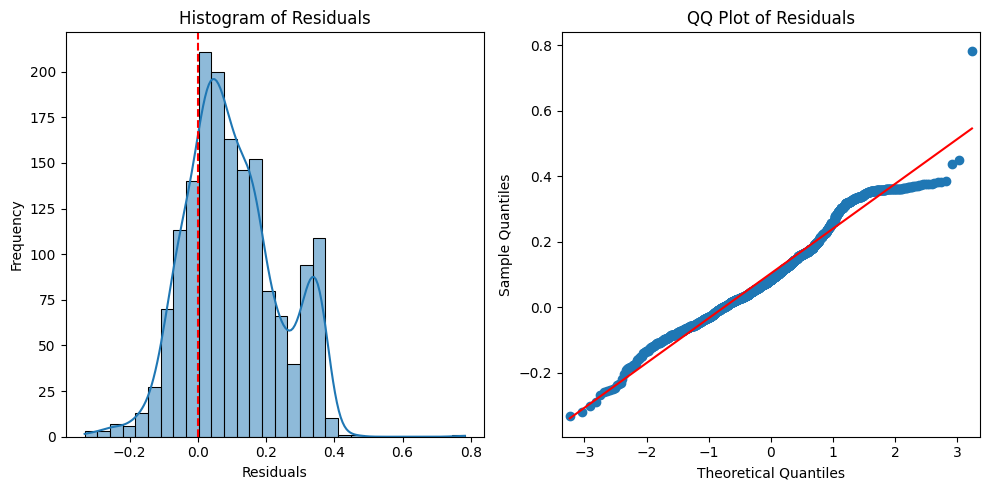

In [217]:
#Graph of Tobit Residuals (WP Post Drive)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.histplot(all_stop_drives['tobit_residuals_postdrive_wp'], bins=30, kde=True)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.axvline(0, color='red', linestyle='--')  # Line at zero


plt.subplot(1, 2, 2)
sm.qqplot(all_stop_drives['tobit_residuals_postdrive_wp'], line='s', ax = plt.gca())
plt.title('QQ Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')

plt.tight_layout()
plt.show()

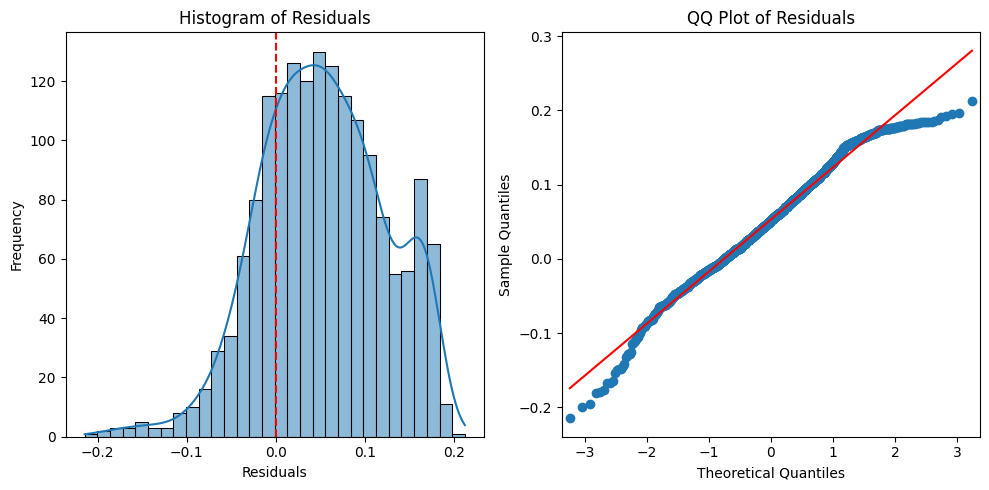

In [219]:
#Graph of Tobit Residuals (WP Last Play of Drive)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
sns.histplot(all_stop_drives['tobit_residuals_lastplaydrive_wp'], bins=30, kde=True)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.axvline(0, color='red', linestyle='--')  # Line at zero


plt.subplot(1, 2, 2)
sm.qqplot(all_stop_drives['tobit_residuals_lastplaydrive_wp'], line='s', ax = plt.gca())
plt.title('QQ Plot of Residuals')
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Sample Quantiles')

plt.tight_layout()
plt.show()